# Explore Results from Param Exploration

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import h5py
import copy
import pandas as pd
from scipy import optimize
from matplotlib import pyplot as plt
import pickle
from itertools import cycle
import matplotlib.colors as mcolors
from photochem.utils import stars
import PICASO_Climate_grid_121625 as picaso_grid
import Photochem_grid_121625 as photochem_grid
from picaso.photochem import EquilibriumChemistry
import GraphsKey

/mnt/c/Users/lily/Documents/NASAUWPostbac/MiniNeptuneGrid26_PostBac/Installation&Setup_Instructions/picasofiles/reference
/mnt/c/Users/lily/Documents/NASAUWPostbac/MiniNeptuneGrid26_PostBac/Installation&Setup_Instructions/picasofiles/grp/redcat/trds


In [2]:
def plot_PT_Photochem(rad_plan=None, planet_metal=None, tint=None, semi_major=None, ctoO=None, kzz=None, calc_PT=True, calc_PhotCh=True):
    
    PT_list, sol_dict, soleq_dict, PT_list_Photochem = GraphsKey.find_all_plotting_values(rad_plan=rad_plan, planet_metal=planet_metal, tint=tint, semi_major=semi_major, ctoO=ctoO, kzz=kzz, calc_PT=calc_PT, calc_PhotCh=calc_PhotCh)


    # Plot the Composition from Photochem
    custom_colors = ['red', 'green', 'blue', 'orange', 'purple', 'grey', 'yellow', 'black', 'magenta', 'cyan', 'pink', '#1f77b4']


    # Plot the Composition from Photochem
    fig, ax1 = plt.subplots(1,1,figsize=[8,6])
    #species = ['CO2','H2O','CH4','CO','NH3','H2','HCN','H2Oaer']
    species_sol = ['CO2_sol','CH4_sol','H2O_sol','CO_sol','NH3_sol','H2_sol','HCN_sol', 'O_sol', 'O2_sol', 'O3_sol', 'OH_sol', 'H2Oaer_sol']
    species_soleq = ['CO2_soleq','CH4_soleq','H2O_soleq','CO_soleq','NH3_soleq','H2_soleq','HCN_soleq', 'O_soleq', 'O2_soleq', 'O3_soleq', 'OH_soleq', 'H2Oaer_soleq']
 
    #for i,sp in enumerate(species):
        #ax1.plot(sol_dict[sp],sol_dict['pressure']/1e6,label=sp, c='C'+str(i))
        #ax1.plot(soleq_dict[sp],soleq_dict['pressure']/1e6, ls=':', c='C'+str(i), alpha=0.4)
    
    for i,sp in enumerate(species_soleq):
        ax1.plot(soleq_dict[sp],soleq_dict['pressure_soleq']/1e6, ls=':', c=custom_colors[i], alpha=0.4)
    for i,sp in enumerate(species_sol):
        ax1.plot(sol_dict[sp],sol_dict['pressure_sol']/1e6, c=custom_colors[i], label=sp.rstrip('_sol'))
    
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    ax1.set_xlim(1e-20,1)
    ax1.set_ylim(1e+3,1e-6)
    ax1.grid(alpha=0.4)
    ax1.legend(ncol=1,bbox_to_anchor=(1,1.0),loc='upper left')
    ax1.set_xlabel('Mixing Ratio', fontsize=16)
    ax1.set_ylabel('Pressure (bar)', fontsize=16)
    #ax1.set_yticks(10.0**np.arange(-6,2))
    ax1.tick_params(axis='x', labelsize=16) 
    ax1.tick_params(axis='y', labelsize=16)
    #ax1.text(0.02, 1.04, 't = '+'%.2e'%pc.wrk.tn, \
    #    size = 15,ha='left', va='bottom',transform=ax1.transAxes)
    
    ax2 = ax1.twiny()
    ax2.set_xlabel('Temperature (K)', fontsize=16)
    ax2.set_xlim(0, 2000)
    ax2.tick_params(axis='x', labelsize=16)
    #print(((PT_list_Photochem[1])/(10**6)),  PT_list_Photochem[0])
    #print(np.flip(PT_list[1]), np.flip(PT_list[0]))
    #ax2.invert_yaxis()
    ax2.plot(PT_list_Photochem[1], (PT_list_Photochem[0]/(10**6)), c='blue', ls='--',label='PT Photochem Profile')
    
    plt.title('K2-18b Around Sun (G-Star)', fontsize=20)
    
    #plt.legend()
    
    # Save the plot as a PNG image
    #plt.tight_layout()
    #plt.savefig('AllCaseMatch_EX_with_PT_Photochem.png')
    
    plt.show()
    
    # Close the plot to free up memory (important if you're generating many plots)
    # plt.close()

# Load data files

In [3]:
filename_picaso ='results/PICASO_climate_updatop_paramext_K218b.h5'

with h5py.File(filename_picaso, 'r') as f:
    picaso_data = f
    #print(list(picaso_data['inputs'][0]))

In [4]:
# Calculate what inputs didn't complete

import itertools

def generate_combinations_with_ranges(input_lists):
  """
  Generates all combinations from a list of inputs, which can be
  lists of values or range objects.

  Args:
    input_lists: A list of iterables (lists or ranges).

  Returns:
    A list of tuples, where each tuple is a combination.
  """
  # itertools.product takes each input list as an argument
  # The '*' unpacks the input_lists into separate arguments
  all_combinations = list(itertools.product(*input_lists))
  return all_combinations

# --- Example Usage ---

# Define your inputs, including standard lists and ranges
# Format for a range should be a range() object: range(start, stop, step)

rad_plan_earth_units = np.array([1.6, 4]) # in units of xEarth radii
log10_planet_metallicity = np.array([0.5, 3.5]) # in units of solar metallicity
tint_K = np.array([20, 400]) # in Kelvin
semi_major_AU = np.array([0.3, 10]) # in AU 
ctoO_solar = np.array([0.01, 1]) # in units of solar C/O
log_Kzz = np.array([5, 9]) # In units of logspace (so 5 means 10^5 cm^2/s)

inputs = [
    rad_plan_earth_units,          
    log10_planet_metallicity,      
    tint_K,
    semi_major_AU,
    ctoO_solar,
    log_Kzz
]

# Generate the combinations
combinations_list = generate_combinations_with_ranges(inputs)

# Print the results
print(f"Total combinations: {len(combinations_list)}\n")
print(np.array(combinations_list))

Total combinations: 64

[[1.6e+00 5.0e-01 2.0e+01 3.0e-01 1.0e-02 5.0e+00]
 [1.6e+00 5.0e-01 2.0e+01 3.0e-01 1.0e-02 9.0e+00]
 [1.6e+00 5.0e-01 2.0e+01 3.0e-01 1.0e+00 5.0e+00]
 [1.6e+00 5.0e-01 2.0e+01 3.0e-01 1.0e+00 9.0e+00]
 [1.6e+00 5.0e-01 2.0e+01 1.0e+01 1.0e-02 5.0e+00]
 [1.6e+00 5.0e-01 2.0e+01 1.0e+01 1.0e-02 9.0e+00]
 [1.6e+00 5.0e-01 2.0e+01 1.0e+01 1.0e+00 5.0e+00]
 [1.6e+00 5.0e-01 2.0e+01 1.0e+01 1.0e+00 9.0e+00]
 [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e-02 5.0e+00]
 [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e-02 9.0e+00]
 [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e+00 5.0e+00]
 [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e+00 9.0e+00]
 [1.6e+00 5.0e-01 4.0e+02 1.0e+01 1.0e-02 5.0e+00]
 [1.6e+00 5.0e-01 4.0e+02 1.0e+01 1.0e-02 9.0e+00]
 [1.6e+00 5.0e-01 4.0e+02 1.0e+01 1.0e+00 5.0e+00]
 [1.6e+00 5.0e-01 4.0e+02 1.0e+01 1.0e+00 9.0e+00]
 [1.6e+00 3.5e+00 2.0e+01 3.0e-01 1.0e-02 5.0e+00]
 [1.6e+00 3.5e+00 2.0e+01 3.0e-01 1.0e-02 9.0e+00]
 [1.6e+00 3.5e+00 2.0e+01 3.0e-01 1.0e+00 5.0e+00]
 [1.6e+

[array([1.6e+00, 5.0e-01, 2.0e+01, 3.0e-01, 1.0e-02, 5.0e+00]), array([1.6e+00, 5.0e-01, 2.0e+01, 3.0e-01, 1.0e-02, 9.0e+00]), array([ 1.6,  0.5, 20. ,  0.3,  1. ,  5. ]), array([ 1.6,  0.5, 20. ,  0.3,  1. ,  9. ]), array([nan, nan, nan, nan, nan, nan]), array([nan, nan, nan, nan, nan, nan]), array([ 1.6,  0.5, 20. , 10. ,  1. ,  5. ]), array([ 1.6,  0.5, 20. , 10. ,  1. ,  9. ]), array([1.6e+00, 5.0e-01, 4.0e+02, 3.0e-01, 1.0e-02, 5.0e+00]), array([1.6e+00, 5.0e-01, 4.0e+02, 3.0e-01, 1.0e-02, 9.0e+00]), array([1.6e+00, 5.0e-01, 4.0e+02, 3.0e-01, 1.0e+00, 5.0e+00]), array([1.6e+00, 5.0e-01, 4.0e+02, 3.0e-01, 1.0e+00, 9.0e+00]), array([1.6e+00, 5.0e-01, 4.0e+02, 1.0e+01, 1.0e-02, 5.0e+00]), array([1.6e+00, 5.0e-01, 4.0e+02, 1.0e+01, 1.0e-02, 9.0e+00]), array([  1.6,   0.5, 400. ,  10. ,   1. ,   5. ]), array([  1.6,   0.5, 400. ,  10. ,   1. ,   9. ]), array([nan, nan, nan, nan, nan, nan]), array([nan, nan, nan, nan, nan, nan]), array([ 1.6,  3.5, 20. ,  0.3,  1. ,  5. ]), array([ 1.6,

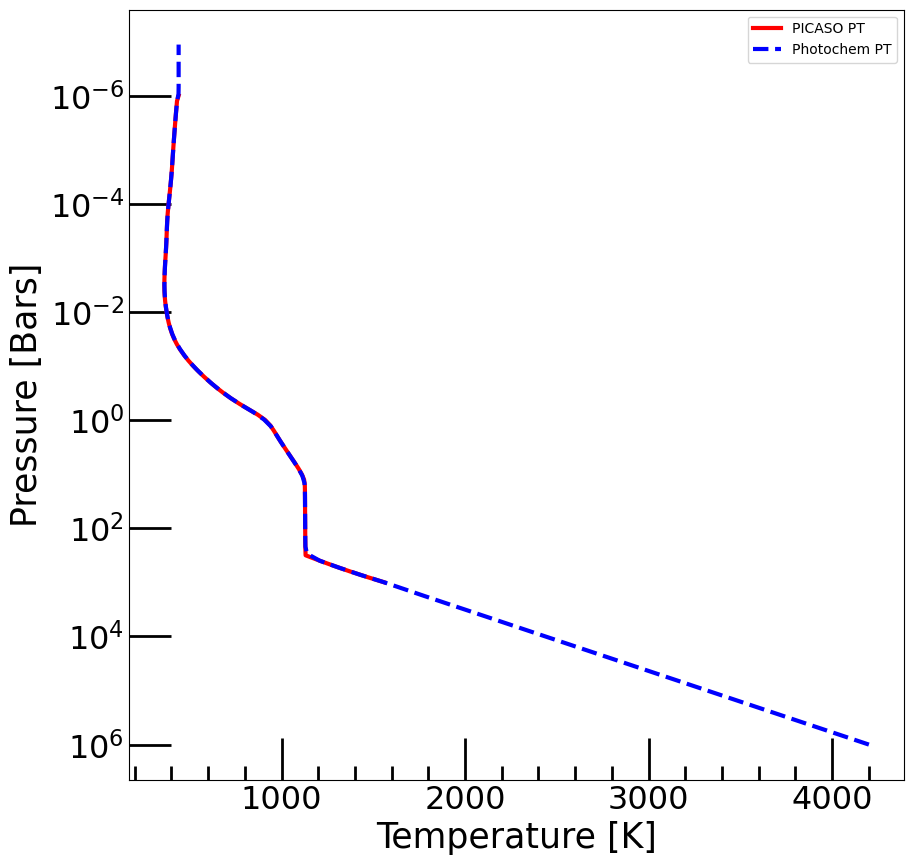

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 2.0e+01 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:20.0, semi major:0.3, ctoO: 0.01, log_Kzz: 5.0


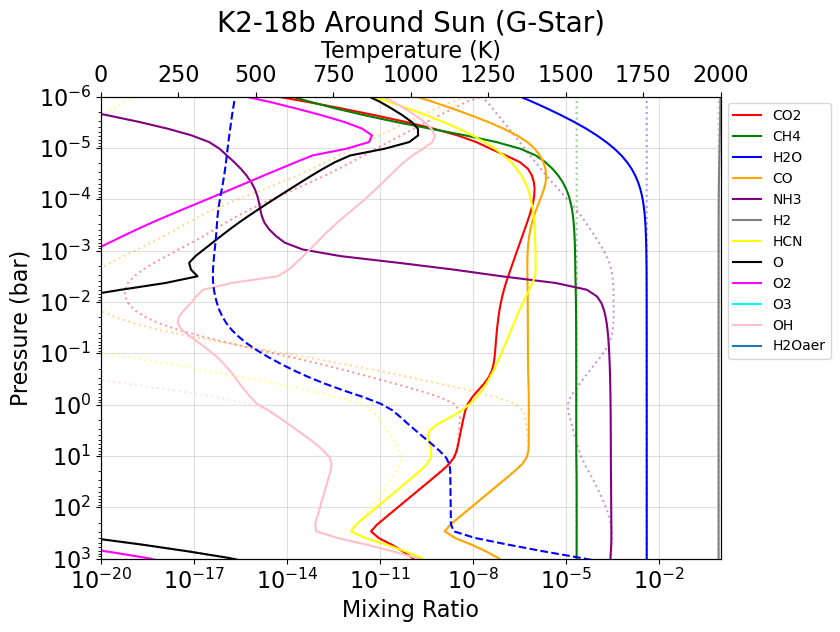

This is an example of inputs: [1.6e+00 5.0e-01 2.0e+01 3.0e-01 1.0e-02 9.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 2.0e+01 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:20.0, semi major:0.3, ctoO: 0.01, log_Kzz: 9.0


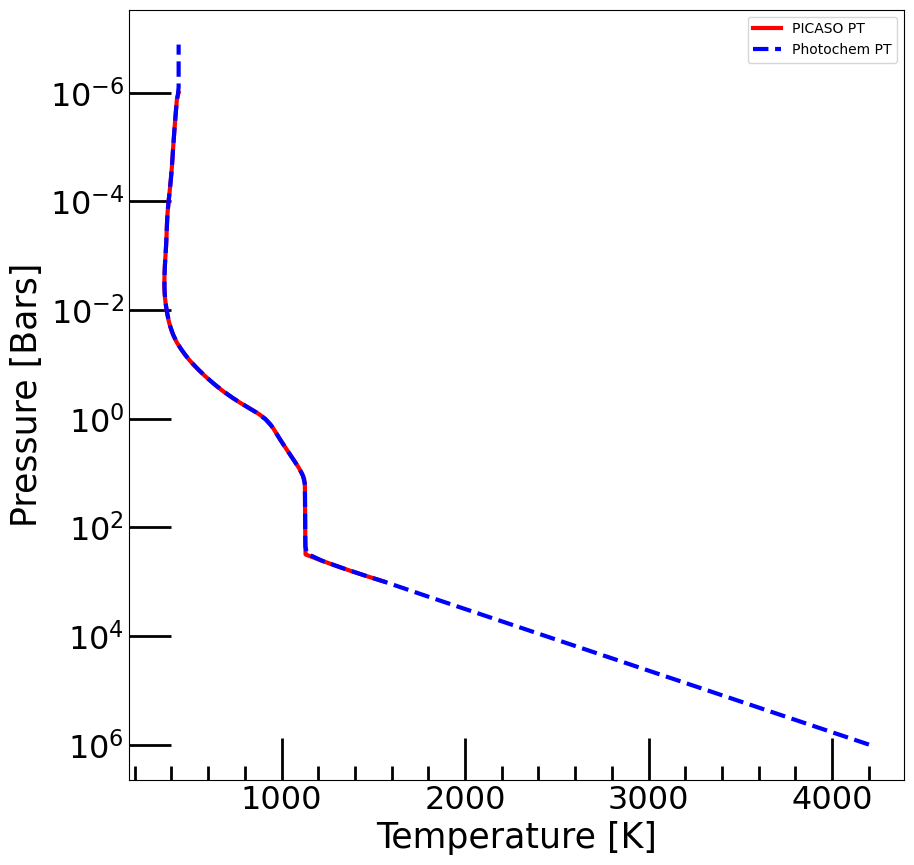

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 2.0e+01 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:20.0, semi major:0.3, ctoO: 0.01, log_Kzz: 9.0


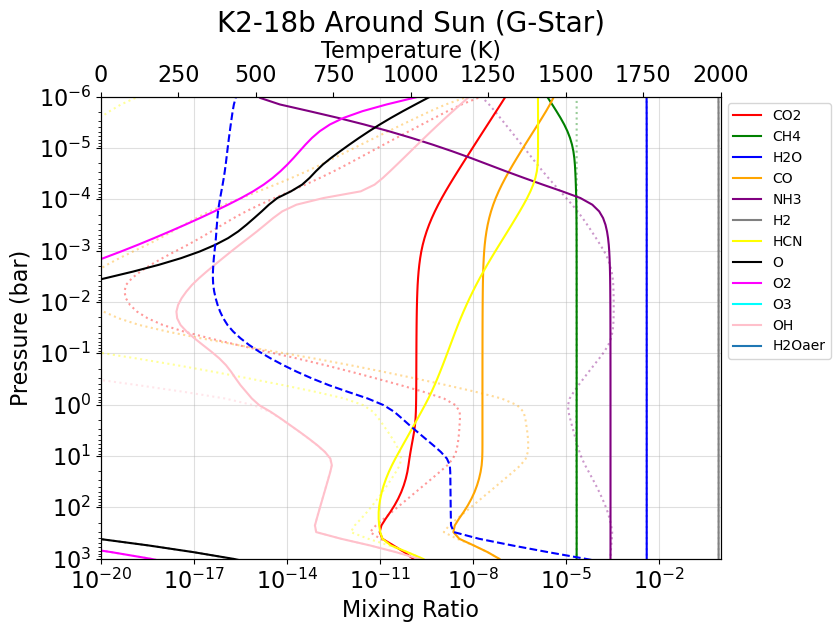

This is an example of inputs: [ 1.6  0.5 20.   0.3  1.   5. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 1.6  0.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


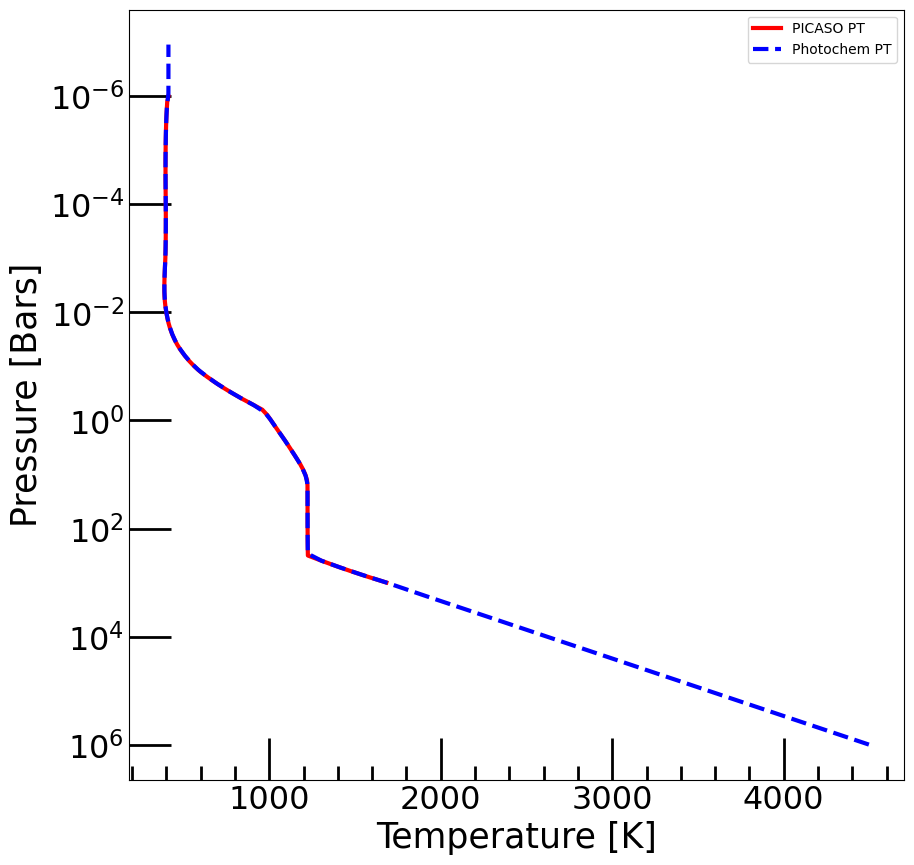

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 1.6  0.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


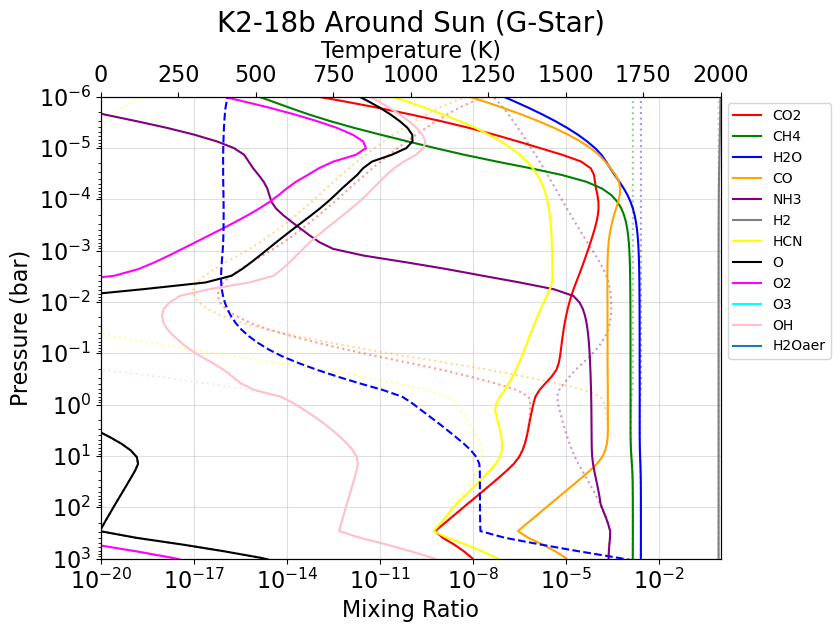

This is an example of inputs: [ 1.6  0.5 20.   0.3  1.   9. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 1.6  0.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


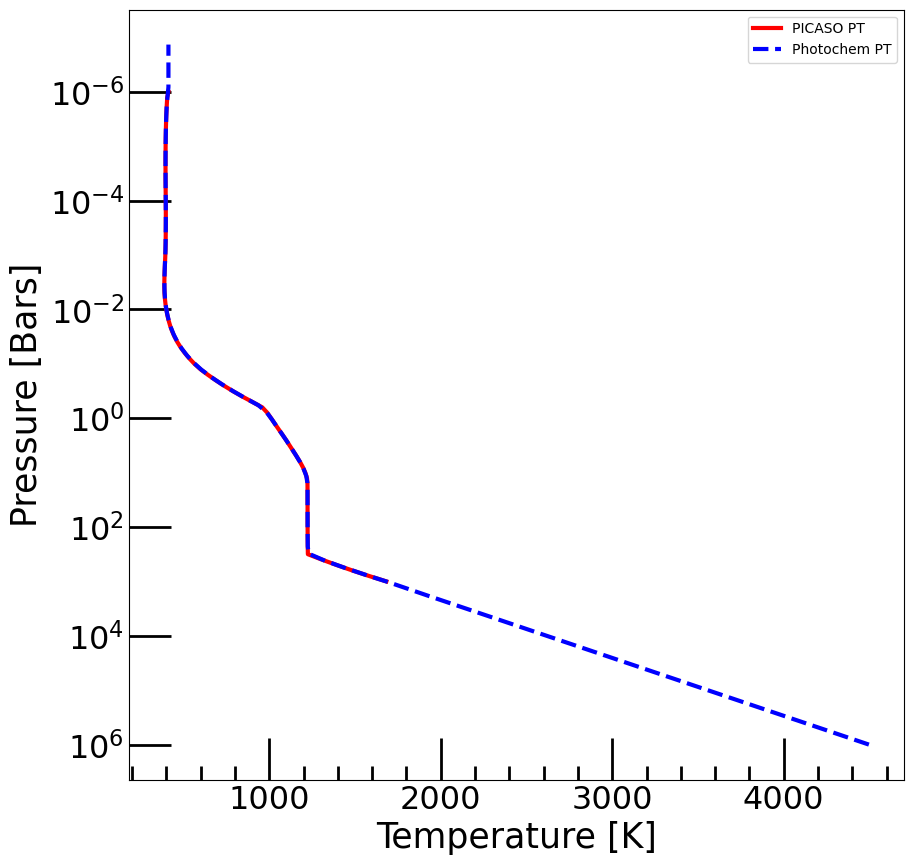

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 1.6  0.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


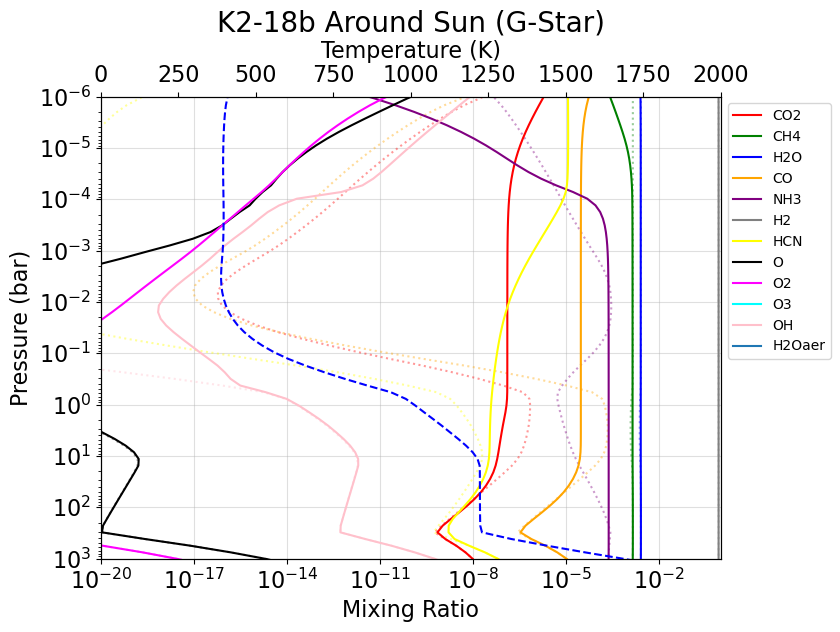

This is an example of inputs: [ 1.6  0.5 20.  10.   1.   5. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 1.6  0.5 20.  10.   1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:20.0, semi major:10.0, ctoO: 1.0, log_Kzz: 5.0


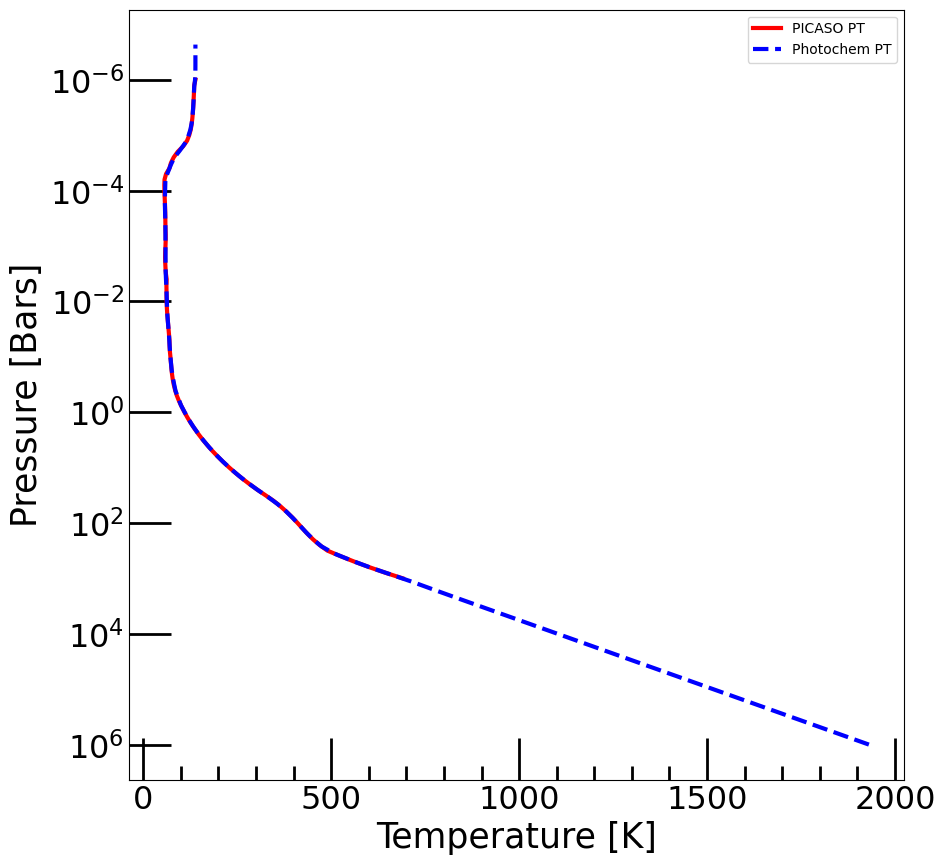

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 1.6  0.5 20.  10.   1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:20.0, semi major:10.0, ctoO: 1.0, log_Kzz: 5.0


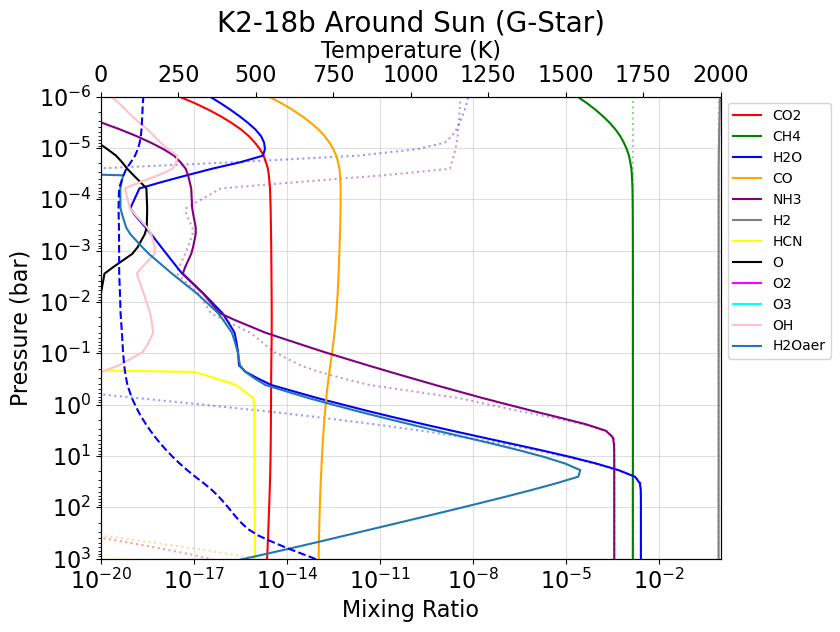

This is an example of inputs: [ 1.6  0.5 20.  10.   1.   9. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 1.6  0.5 20.  10.   1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:20.0, semi major:10.0, ctoO: 1.0, log_Kzz: 9.0


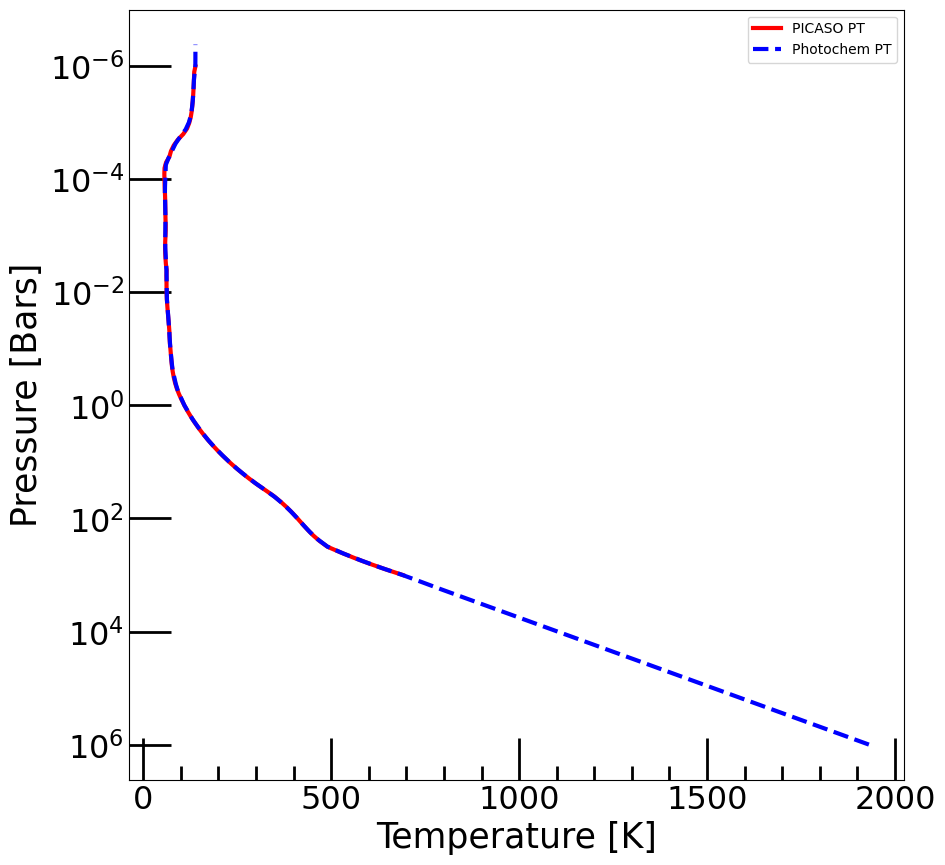

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 1.6  0.5 20.  10.   1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:20.0, semi major:10.0, ctoO: 1.0, log_Kzz: 9.0


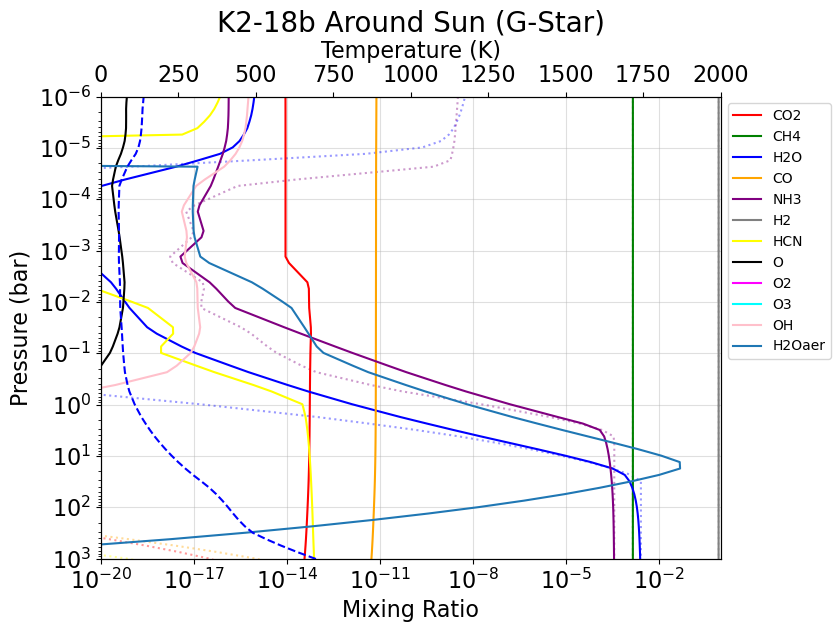

This is an example of inputs: [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e-02 5.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 5.0


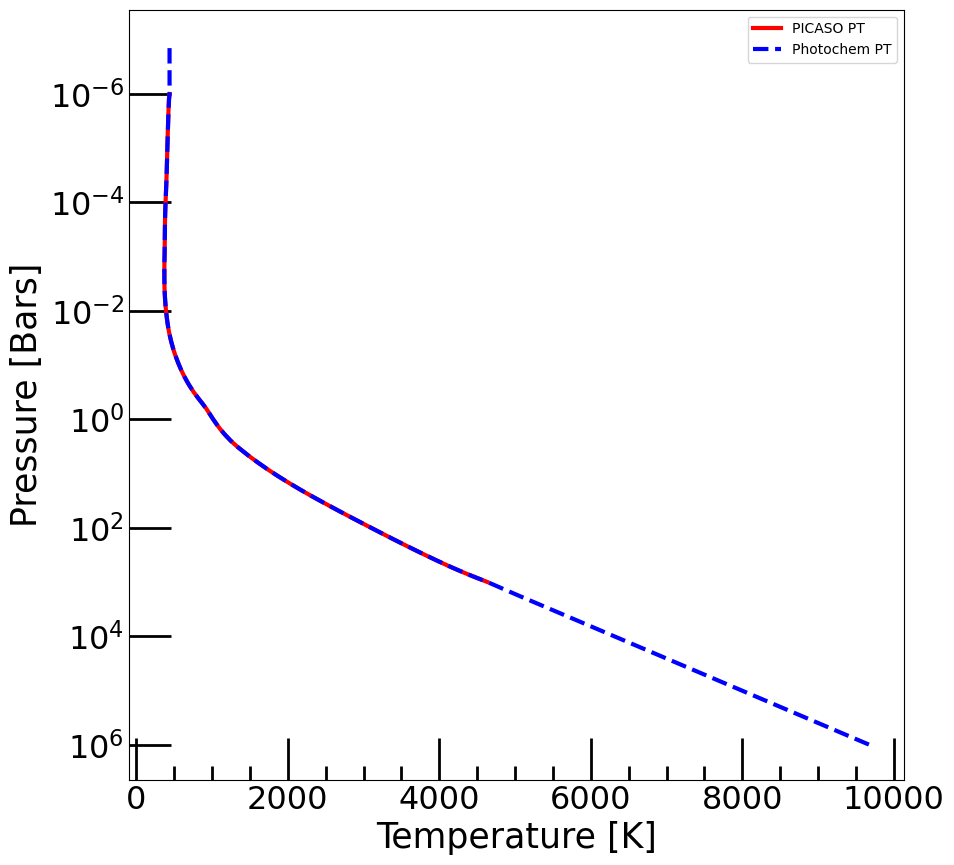

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 5.0


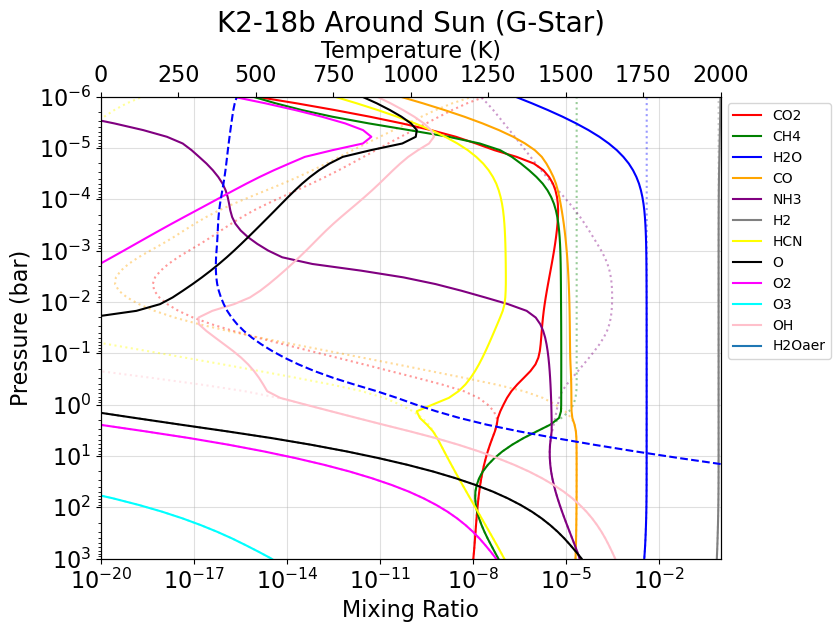

This is an example of inputs: [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e-02 9.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 9.0


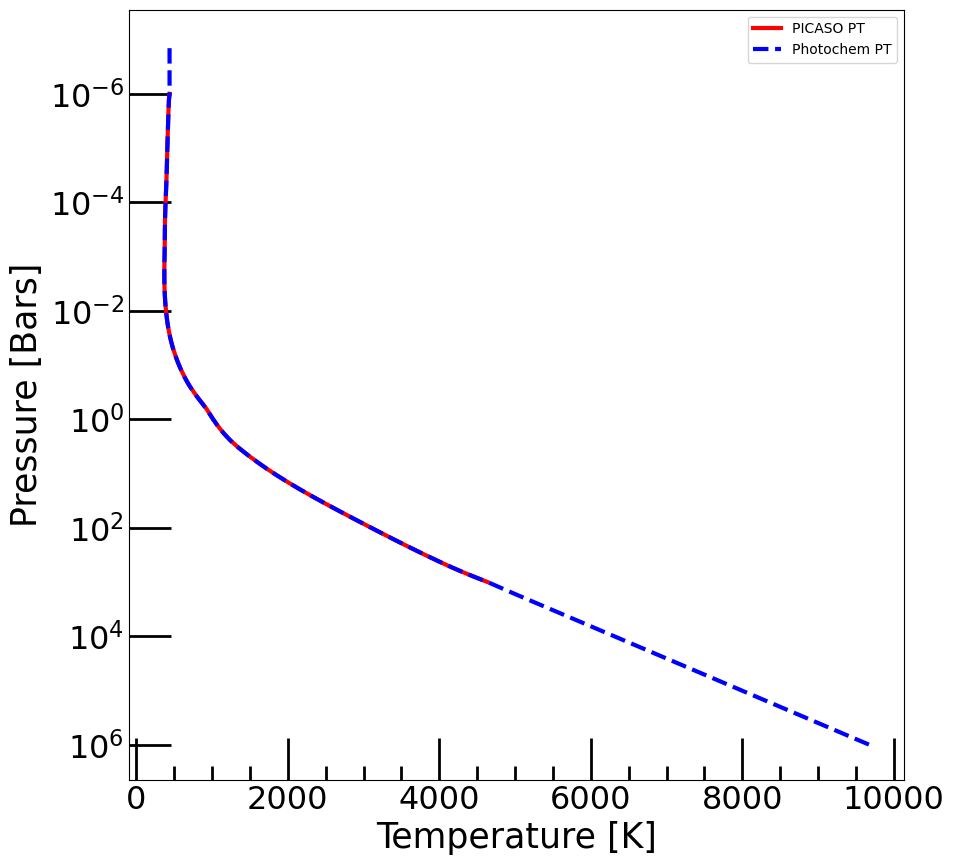

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 9.0


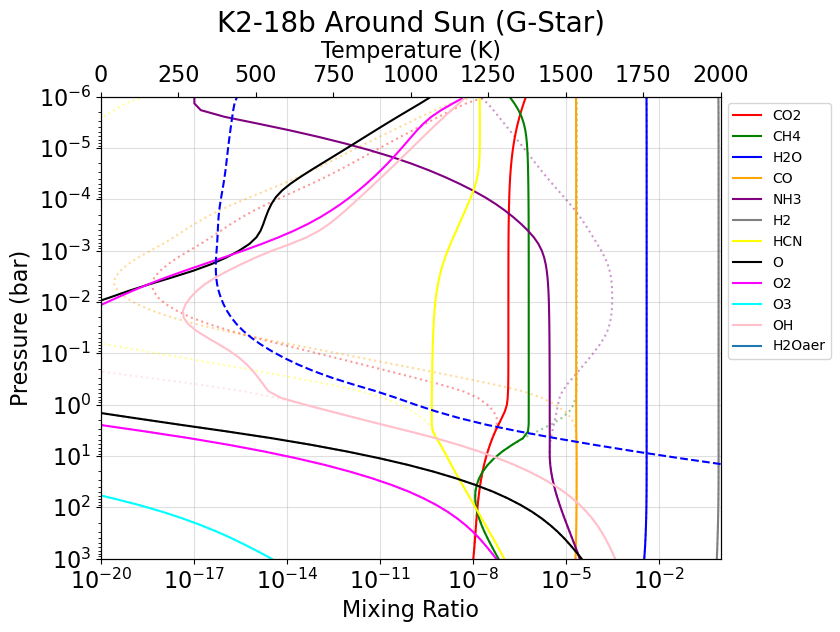

This is an example of inputs: [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e+00 5.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


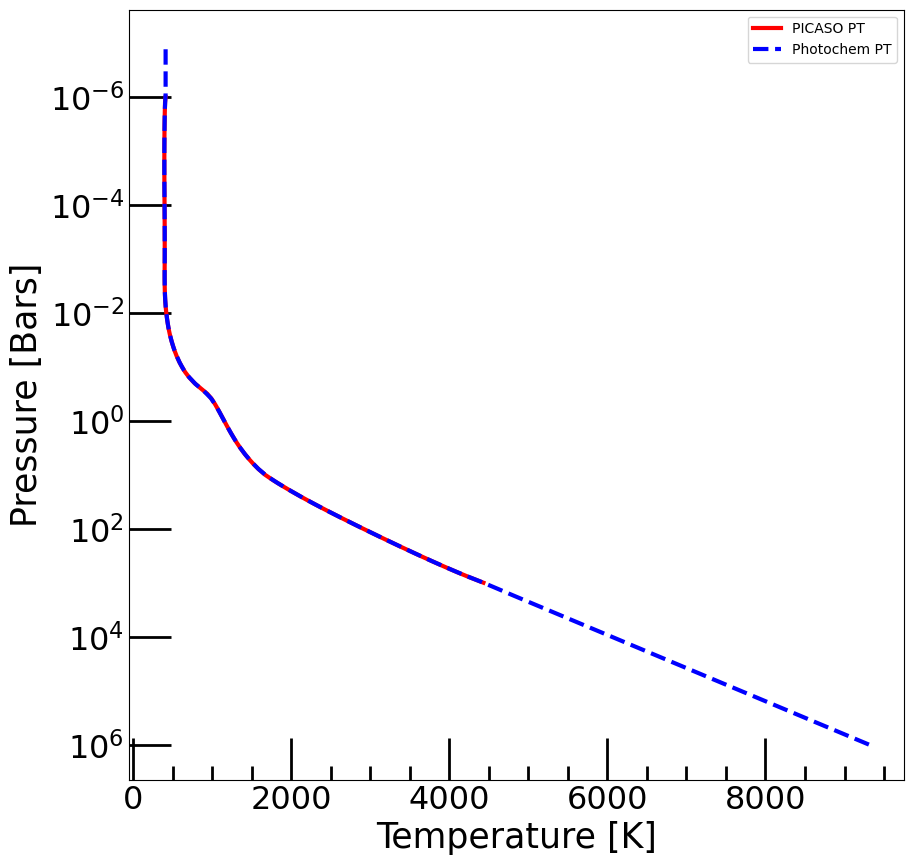

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


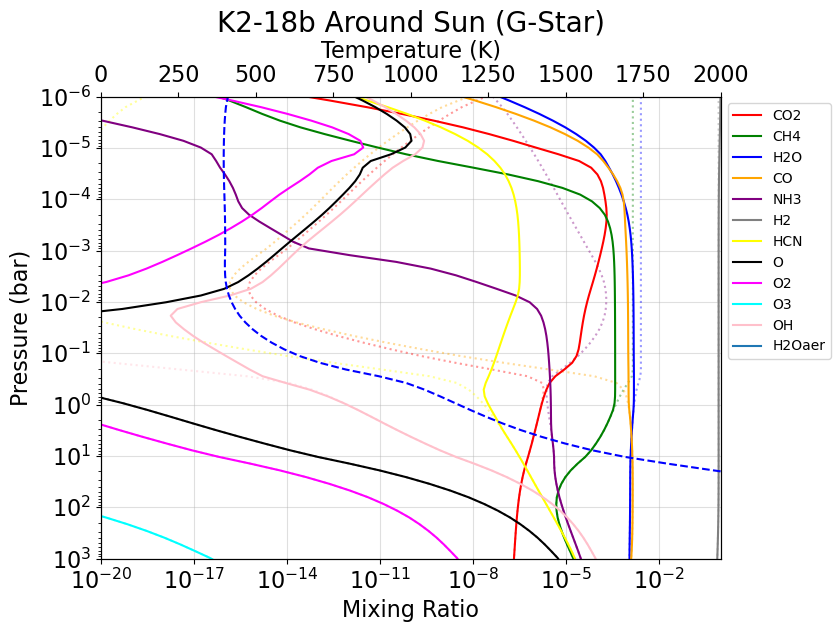

This is an example of inputs: [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e+00 9.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


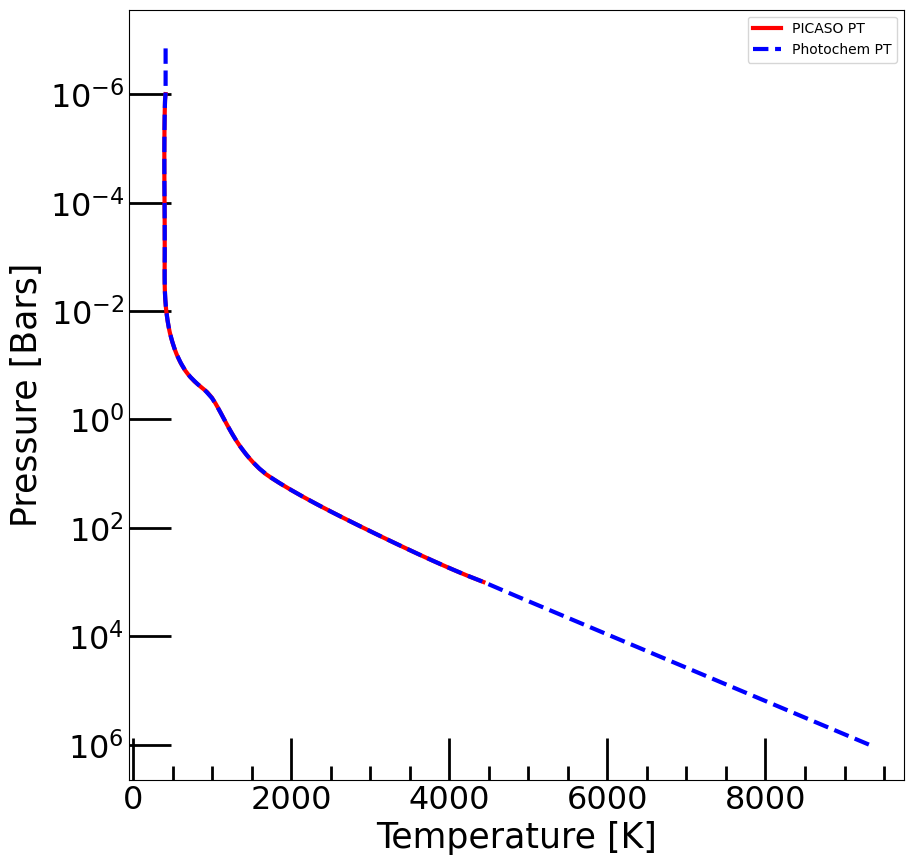

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 4.0e+02 3.0e-01 1.0e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


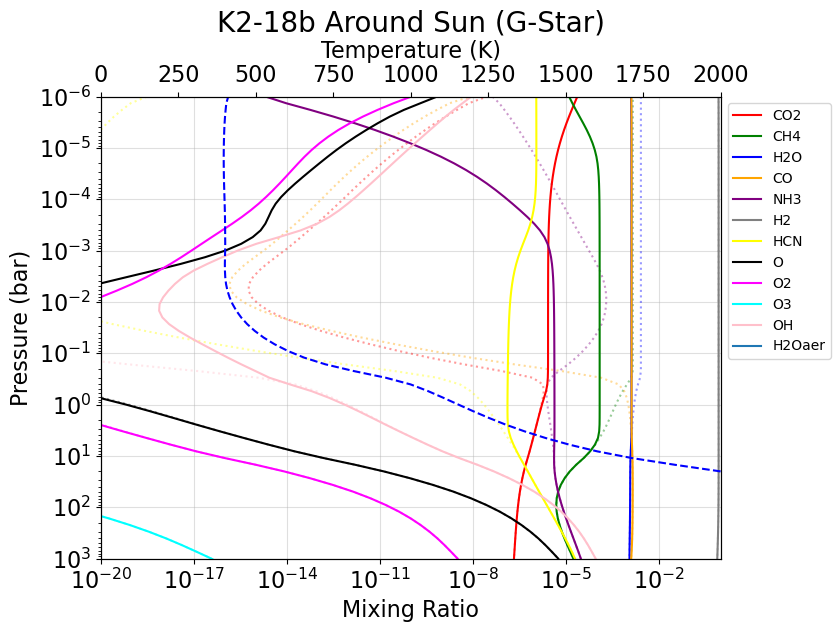

This is an example of inputs: [1.6e+00 5.0e-01 4.0e+02 1.0e+01 1.0e-02 5.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 4.0e+02 1.0e+01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 5.0


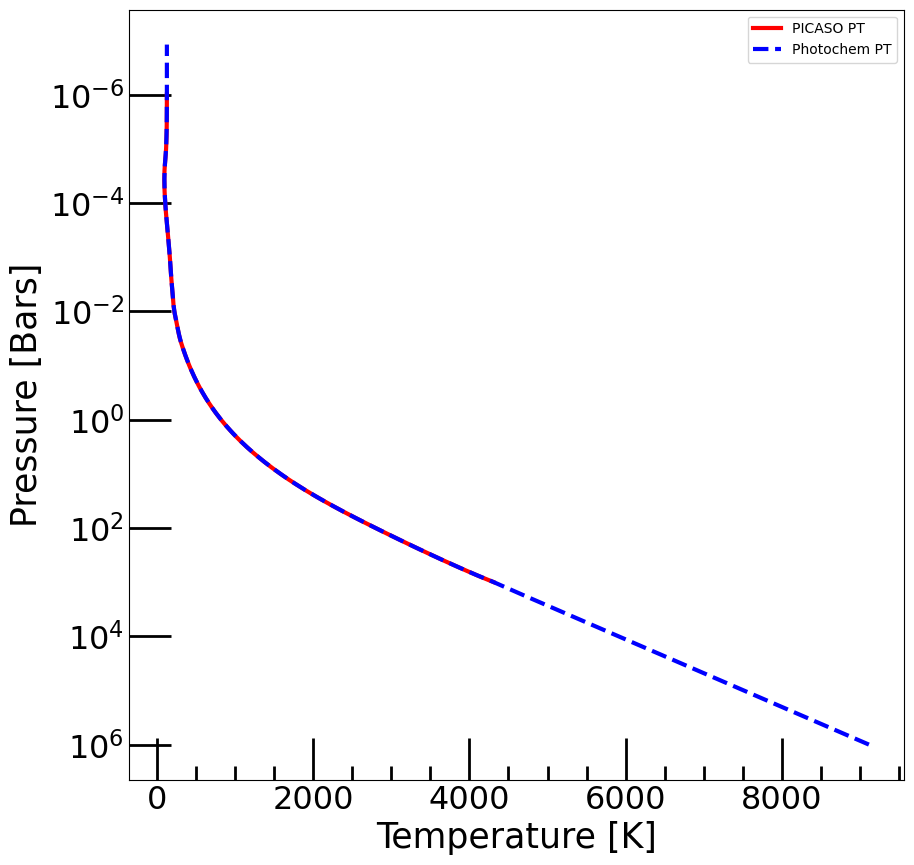

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 4.0e+02 1.0e+01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 5.0


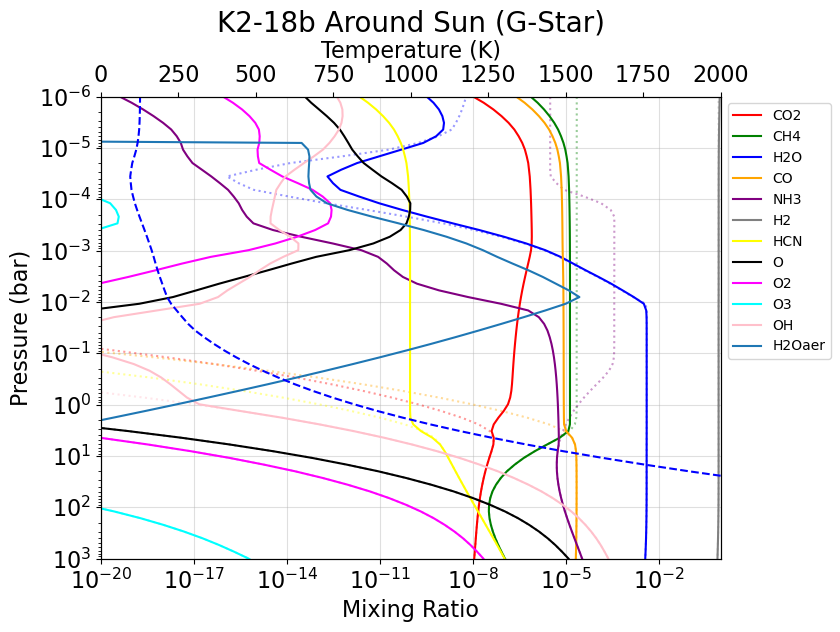

This is an example of inputs: [1.6e+00 5.0e-01 4.0e+02 1.0e+01 1.0e-02 9.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 4.0e+02 1.0e+01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 9.0


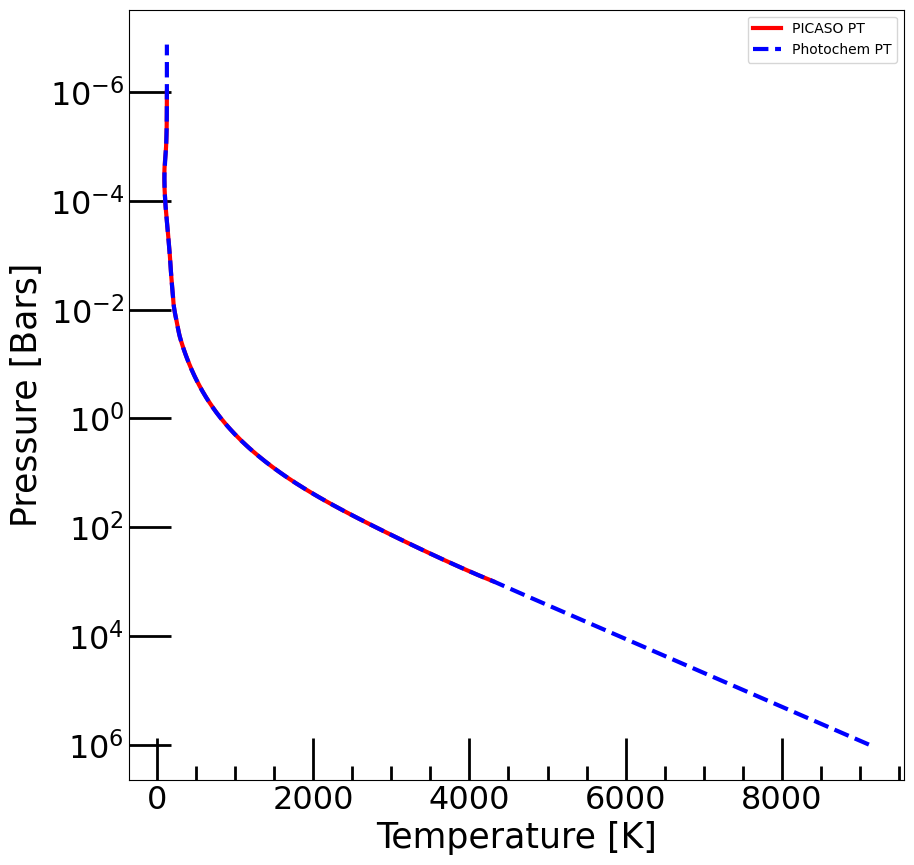

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 4.0e+02 1.0e+01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 9.0


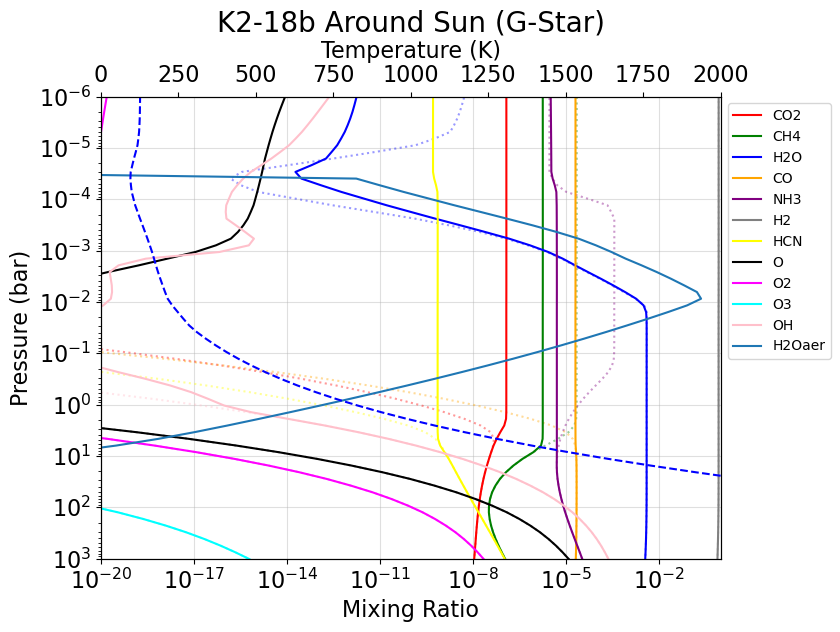

This is an example of inputs: [  1.6   0.5 400.   10.    1.    5. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  1.6   0.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 5.0


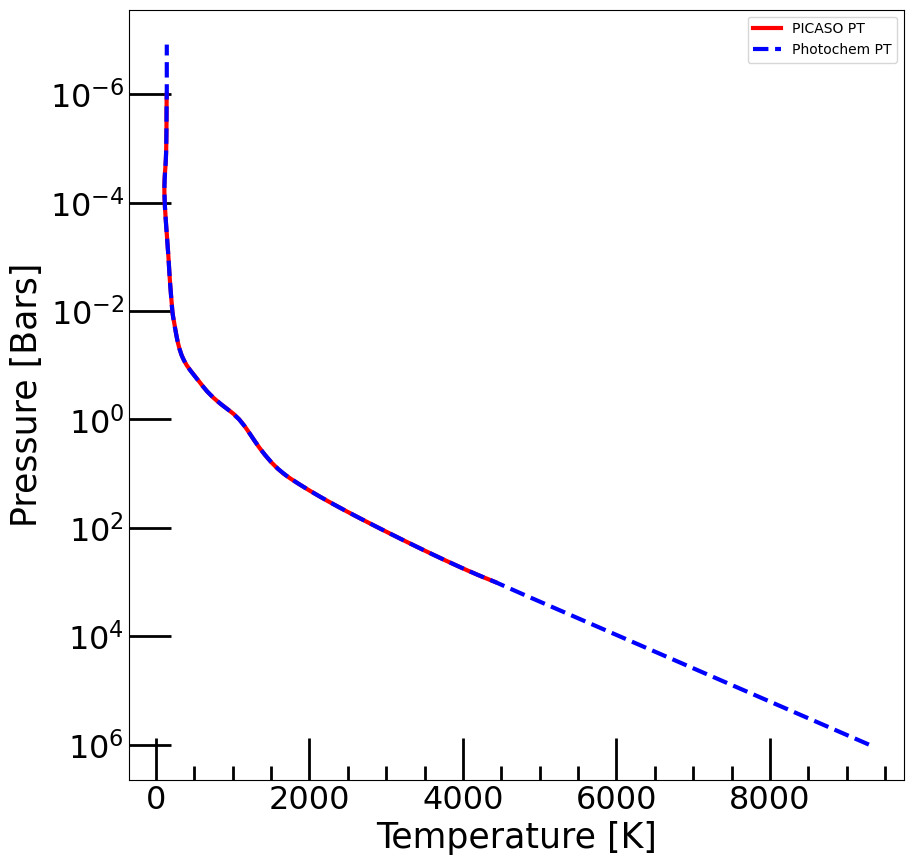

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  1.6   0.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 5.0


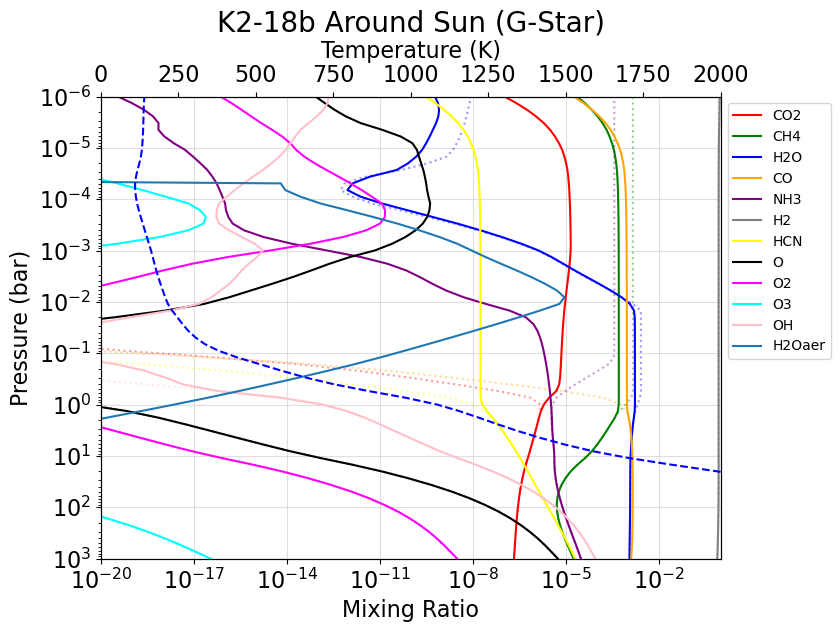

This is an example of inputs: [  1.6   0.5 400.   10.    1.    9. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  1.6   0.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 9.0


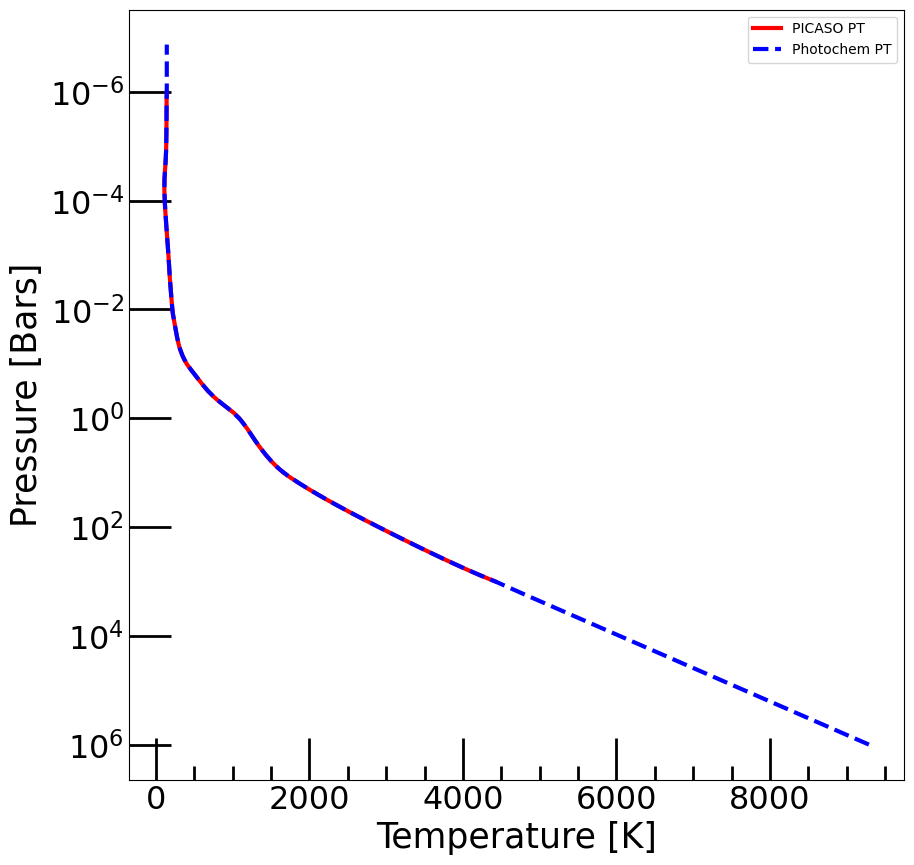

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  1.6   0.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 9.0


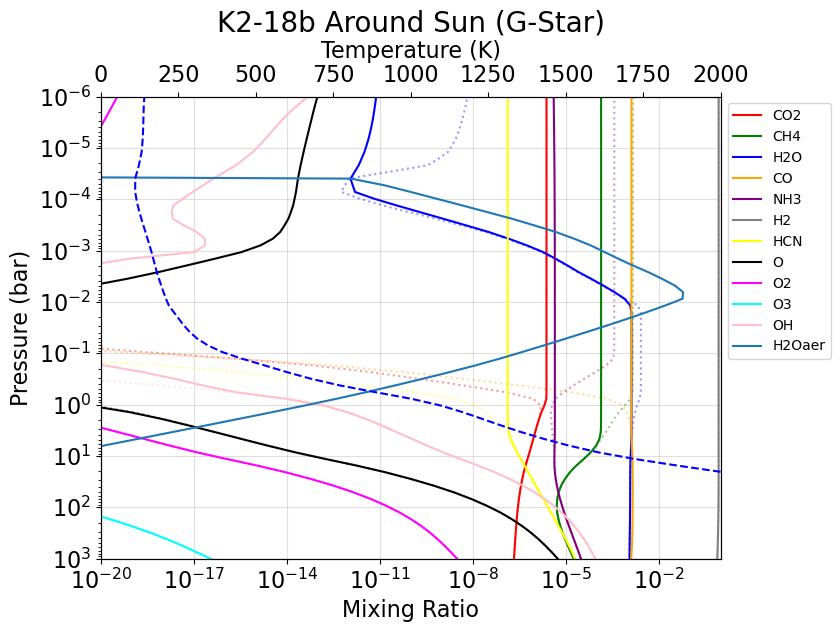

This is an example of inputs: [ 1.6  3.5 20.   0.3  1.   5. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 1.6  3.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


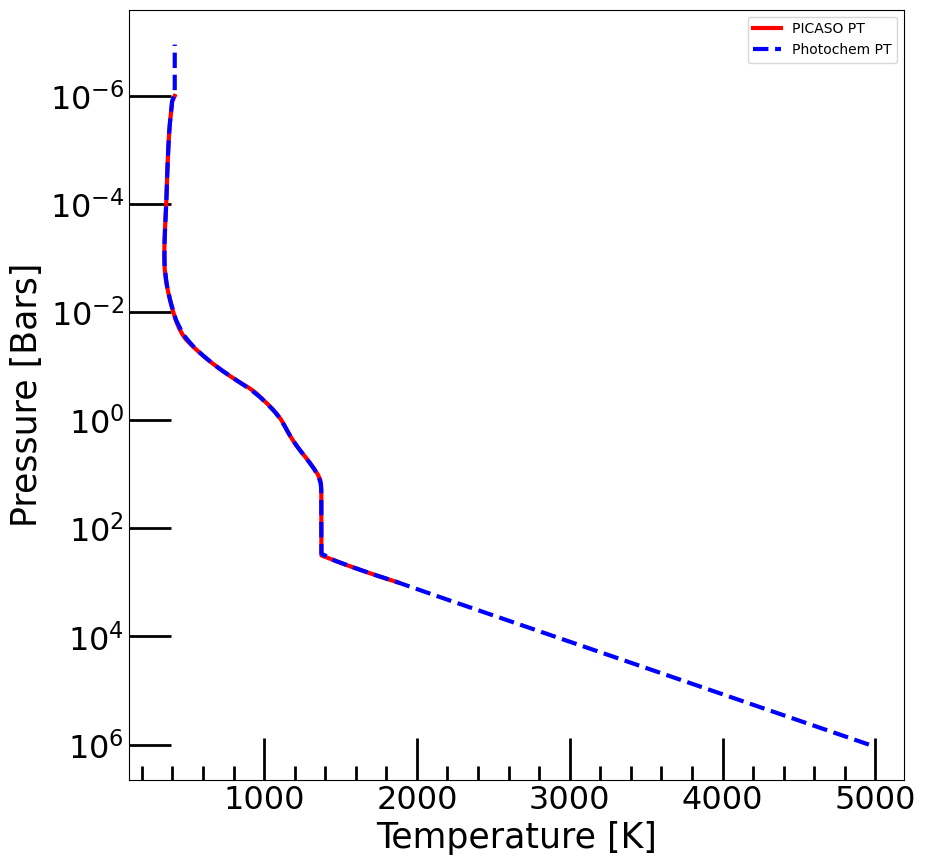

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 1.6  3.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


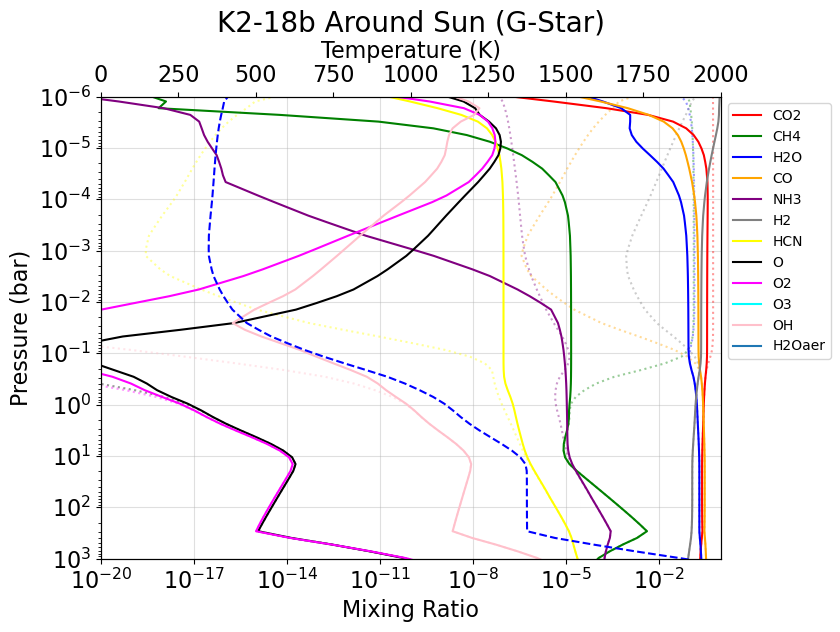

This is an example of inputs: [ 1.6  3.5 20.   0.3  1.   9. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 1.6  3.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


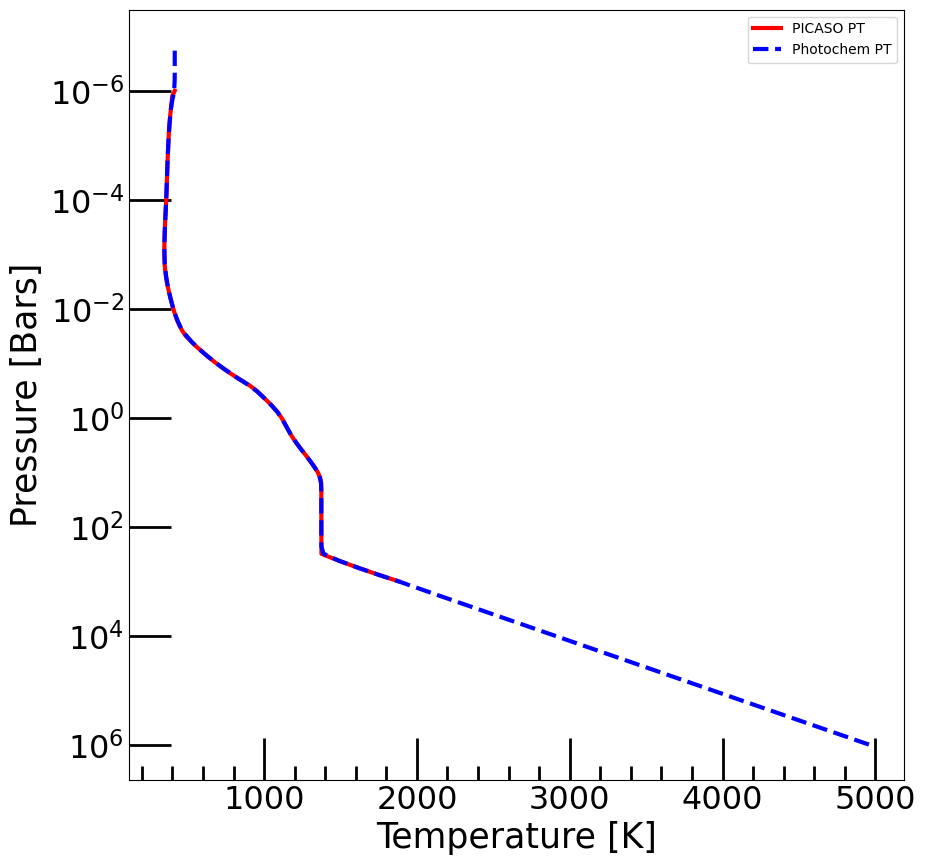

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 1.6  3.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


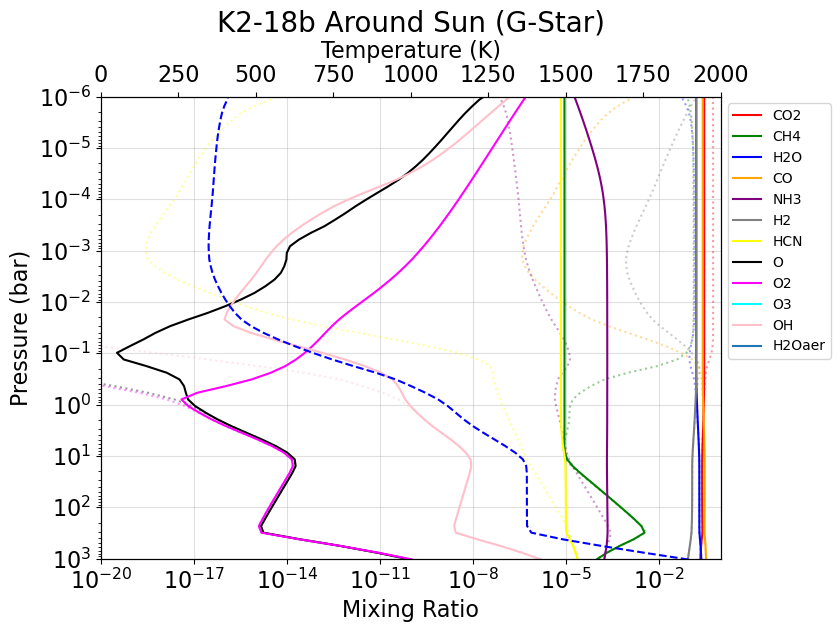

This is an example of inputs: [1.6e+00 3.5e+00 4.0e+02 3.0e-01 1.0e-02 5.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 3.5e+00 4.0e+02 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 5.0


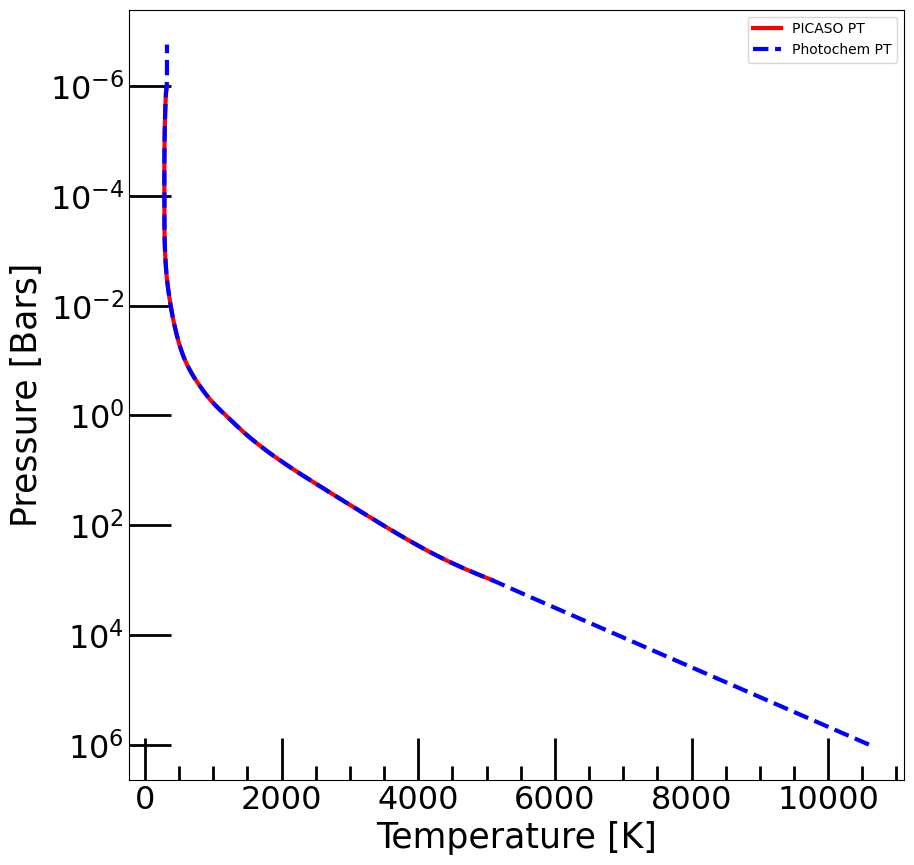

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 3.5e+00 4.0e+02 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 5.0


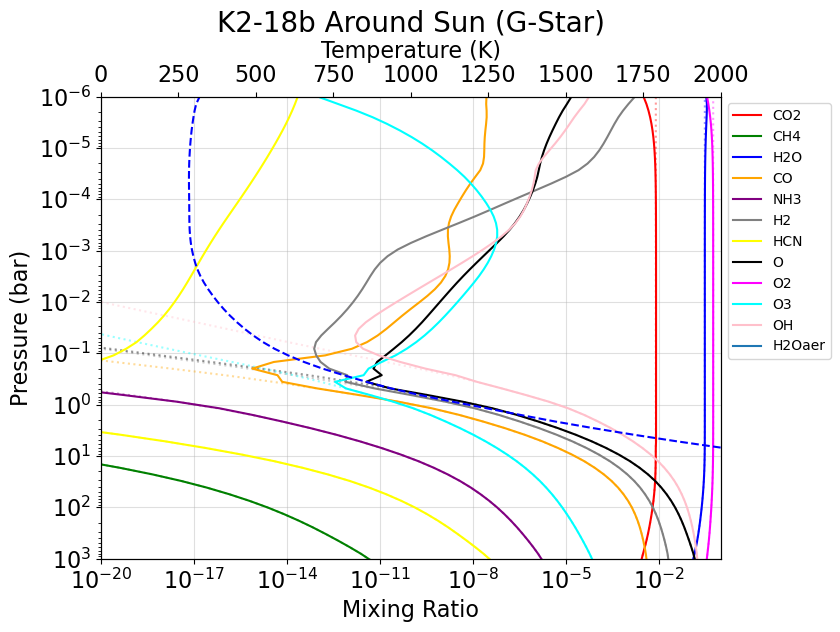

This is an example of inputs: [1.6e+00 3.5e+00 4.0e+02 3.0e-01 1.0e-02 9.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 3.5e+00 4.0e+02 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 9.0


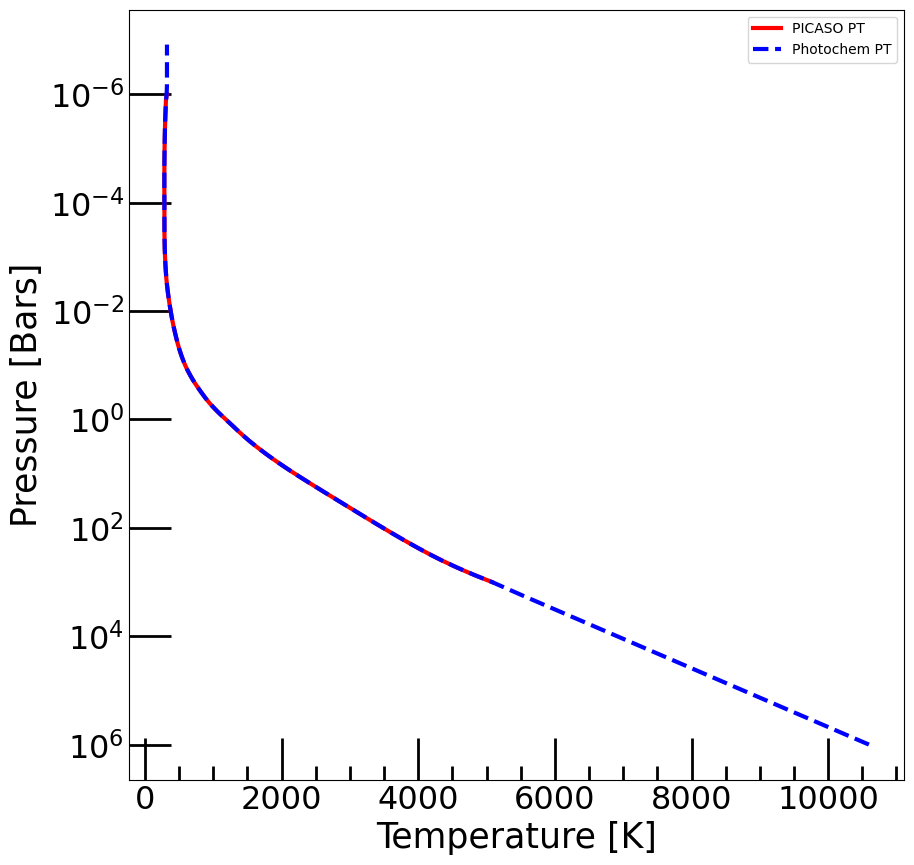

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 3.5e+00 4.0e+02 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 9.0


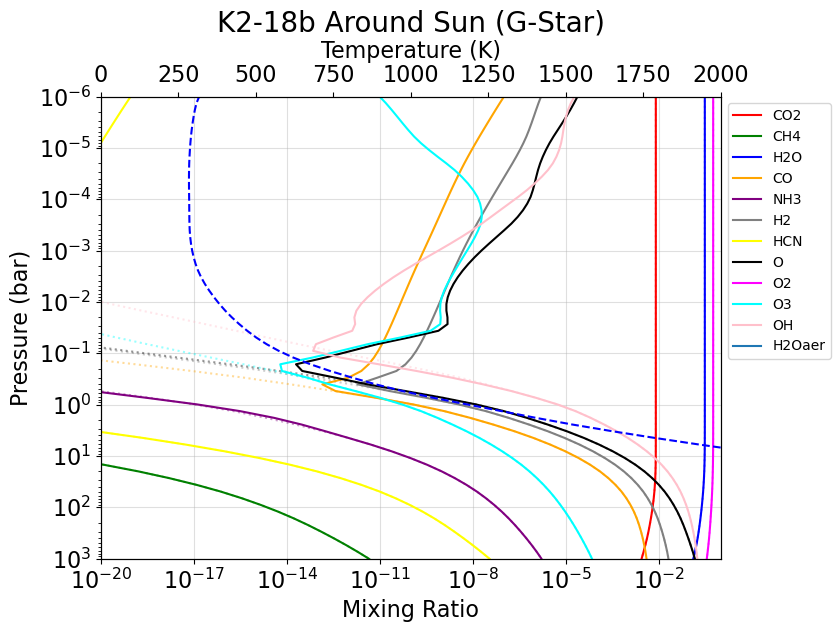

This is an example of inputs: [1.6e+00 3.5e+00 4.0e+02 3.0e-01 1.0e+00 5.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 3.5e+00 4.0e+02 3.0e-01 1.0e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


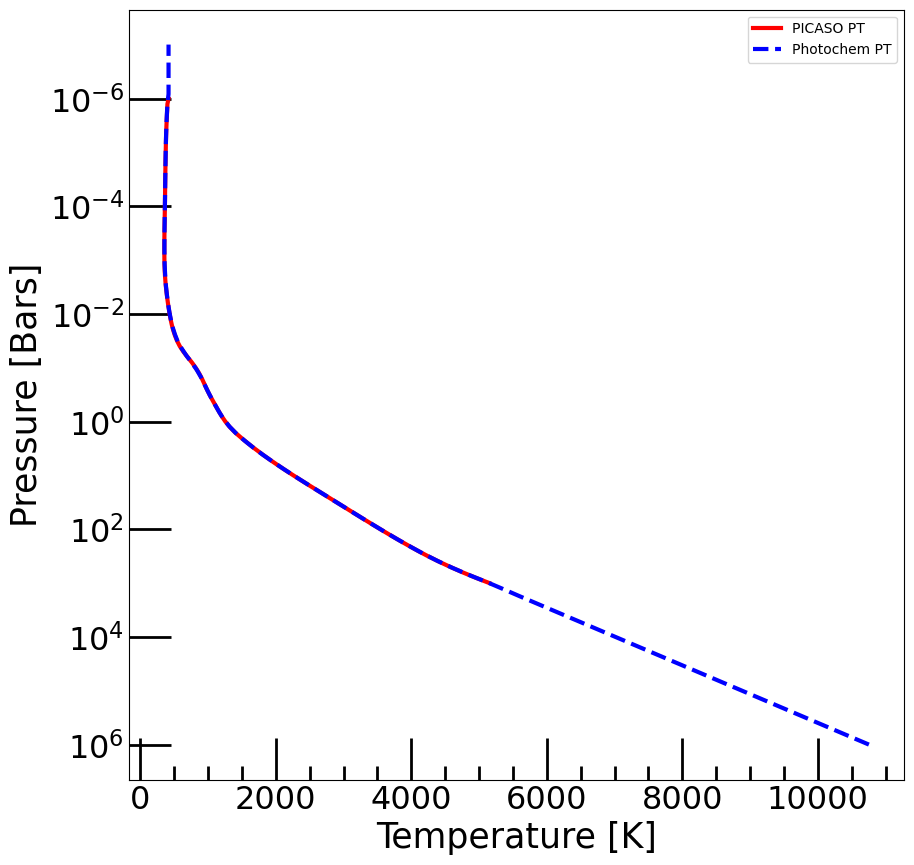

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 3.5e+00 4.0e+02 3.0e-01 1.0e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


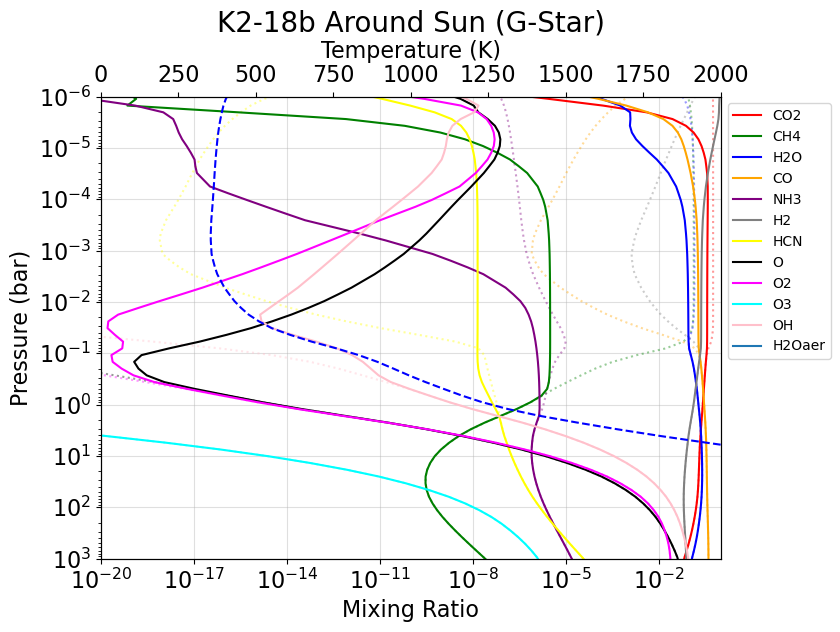

This is an example of inputs: [1.6e+00 3.5e+00 4.0e+02 3.0e-01 1.0e+00 9.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 3.5e+00 4.0e+02 3.0e-01 1.0e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


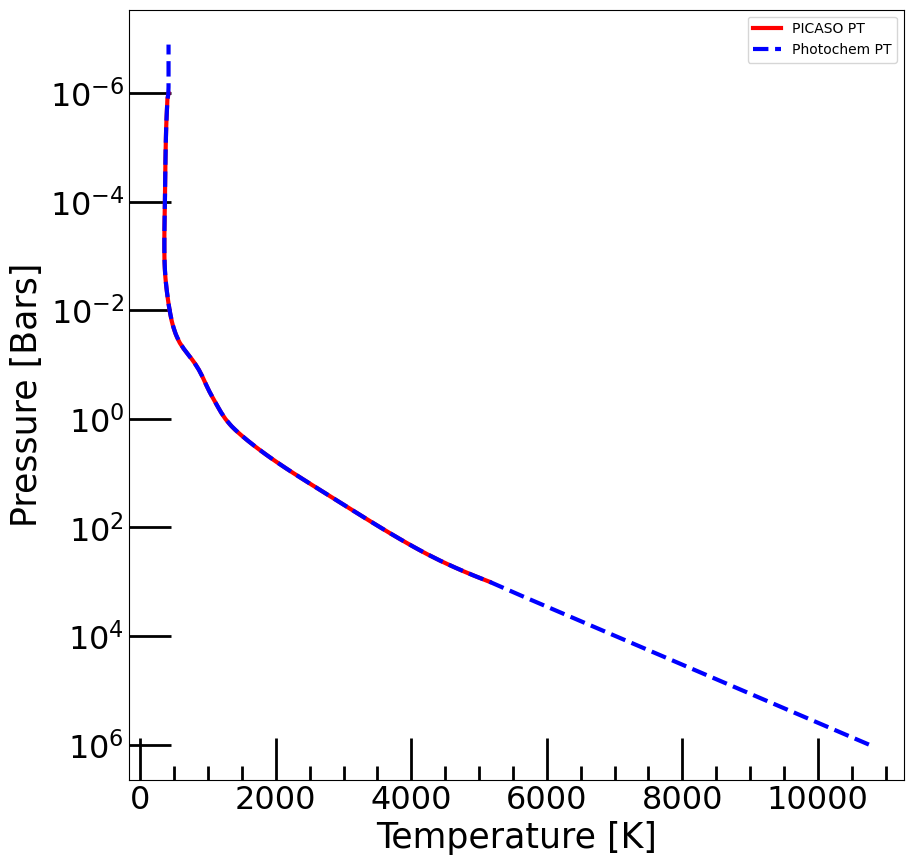

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 3.5e+00 4.0e+02 3.0e-01 1.0e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


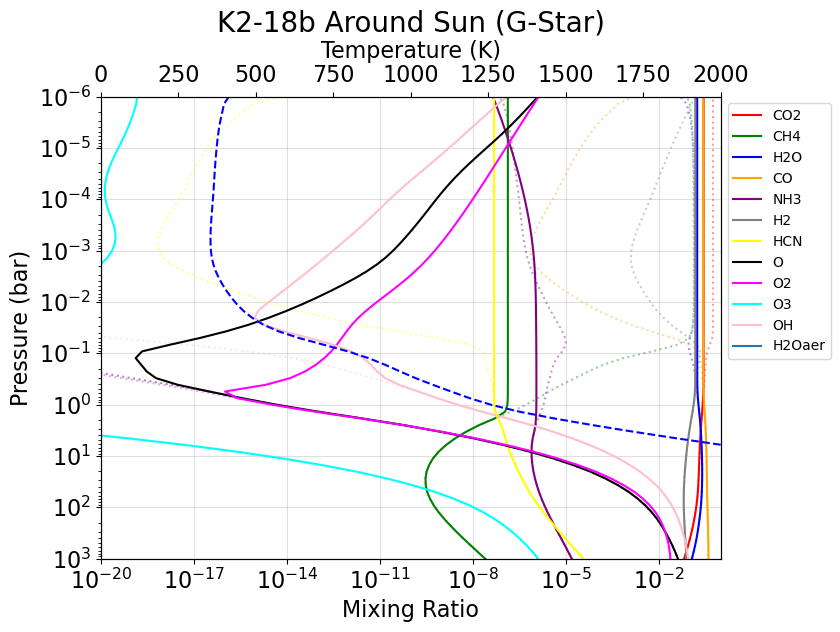

This is an example of inputs: [1.6e+00 3.5e+00 4.0e+02 1.0e+01 1.0e-02 5.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 3.5e+00 4.0e+02 1.0e+01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 5.0


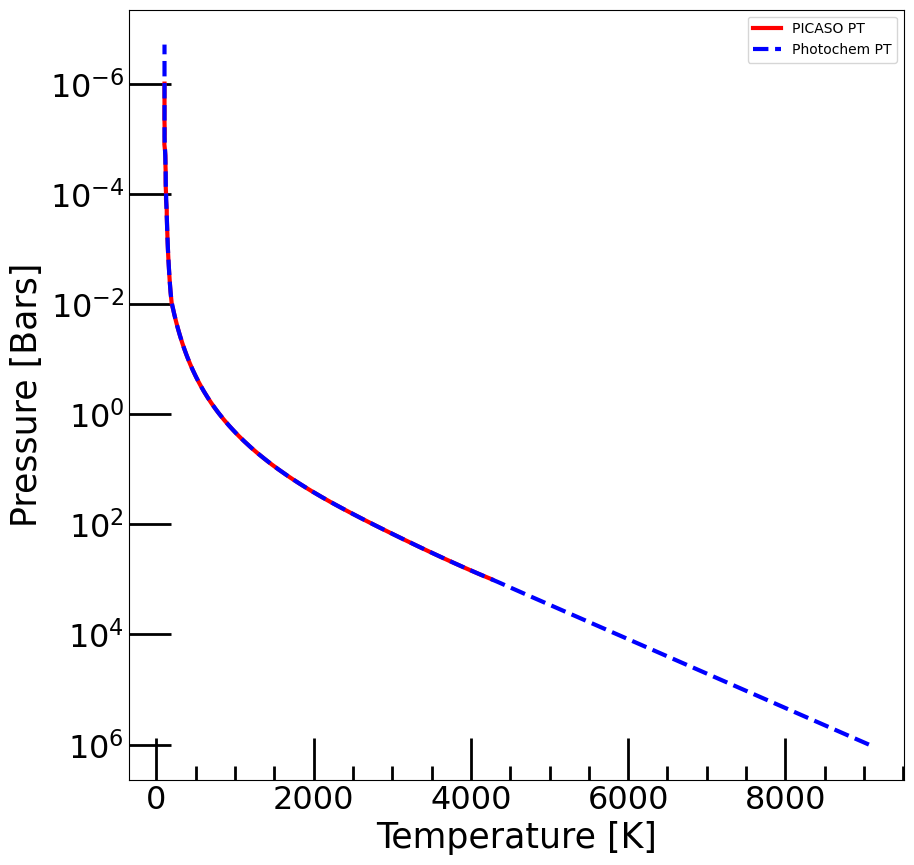

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 3.5e+00 4.0e+02 1.0e+01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 5.0


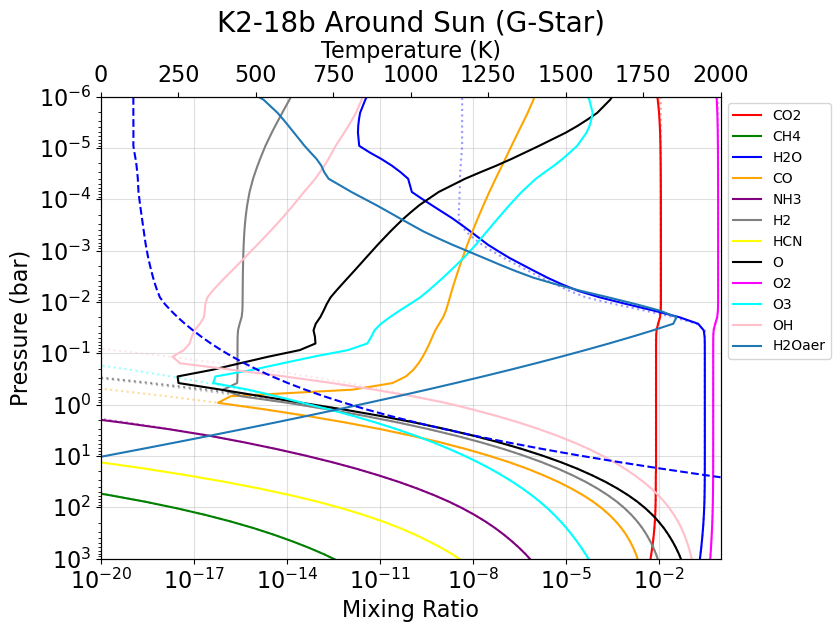

This is an example of inputs: [1.6e+00 3.5e+00 4.0e+02 1.0e+01 1.0e-02 9.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 3.5e+00 4.0e+02 1.0e+01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 9.0


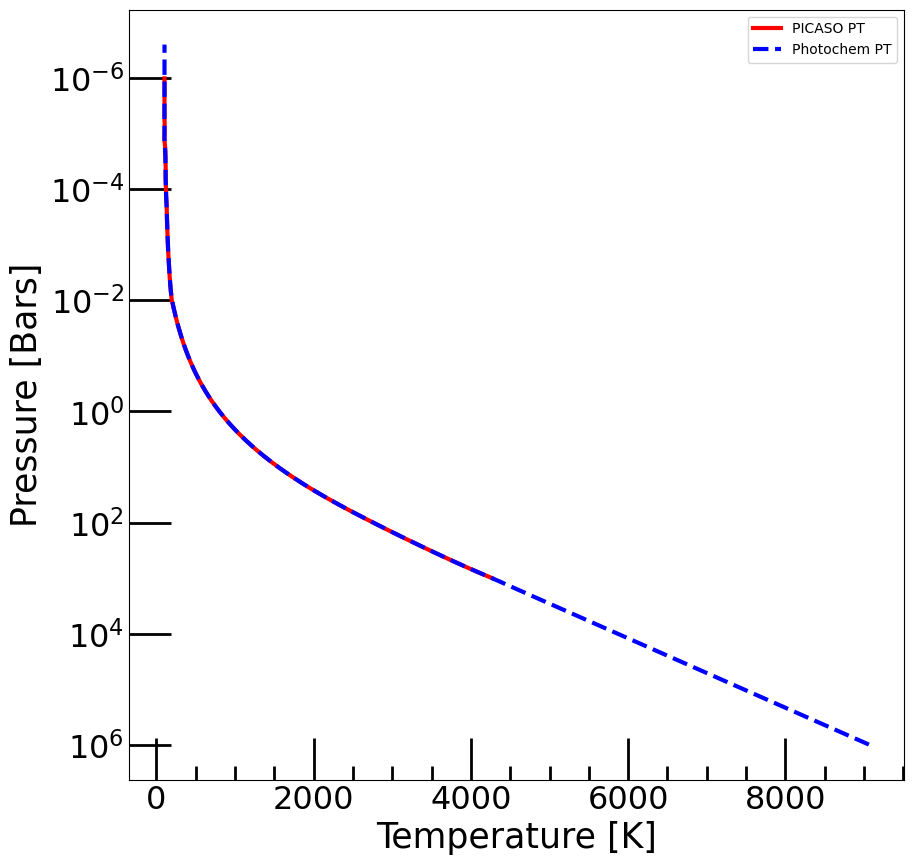

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 3.5e+00 4.0e+02 1.0e+01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 9.0


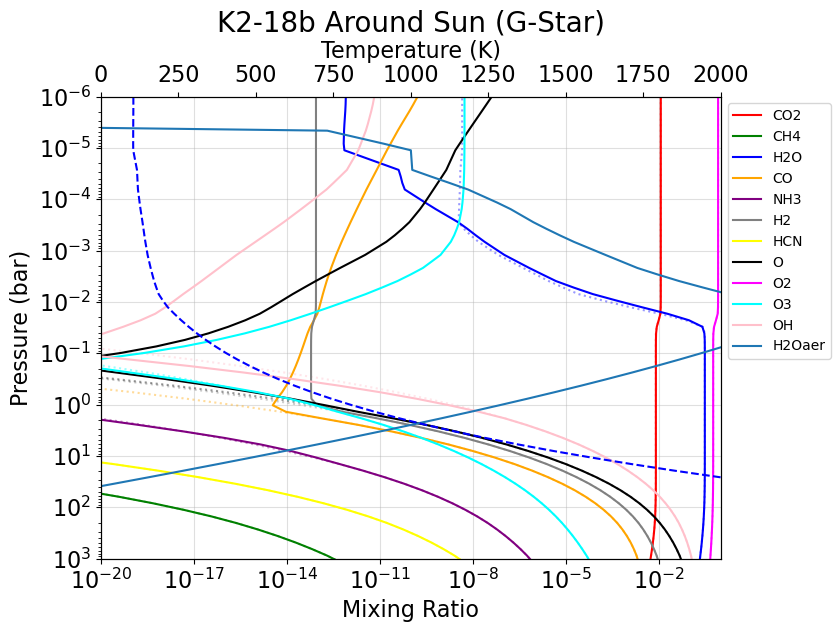

This is an example of inputs: [  1.6   3.5 400.   10.    1.    5. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  1.6   3.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 5.0


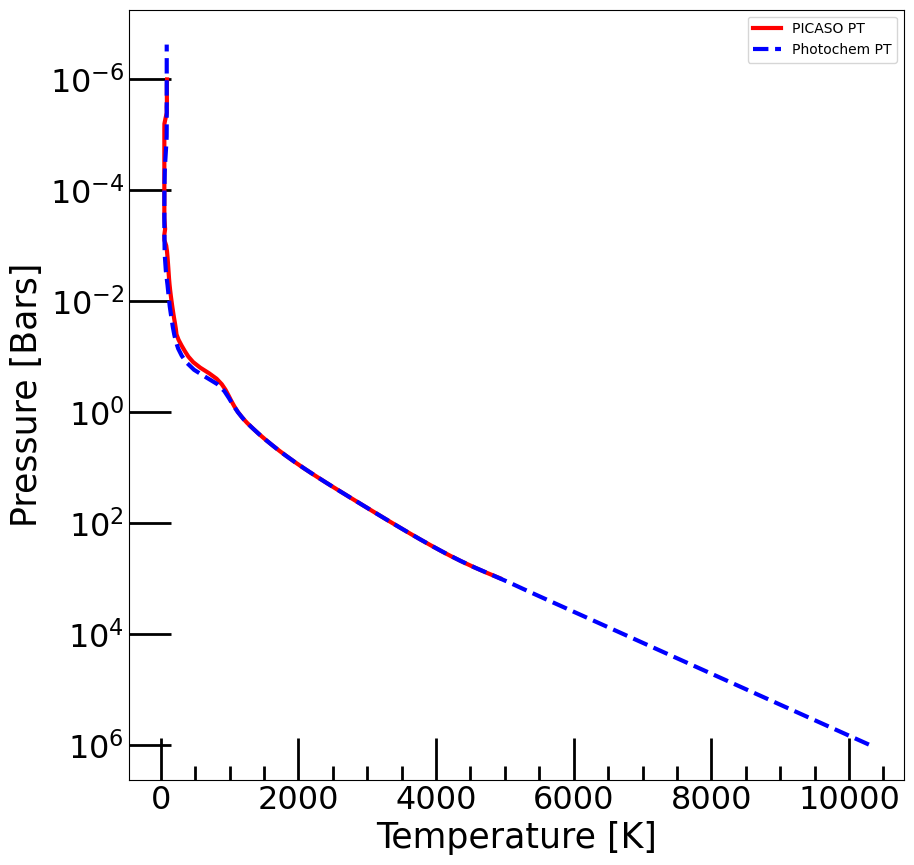

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  1.6   3.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 5.0


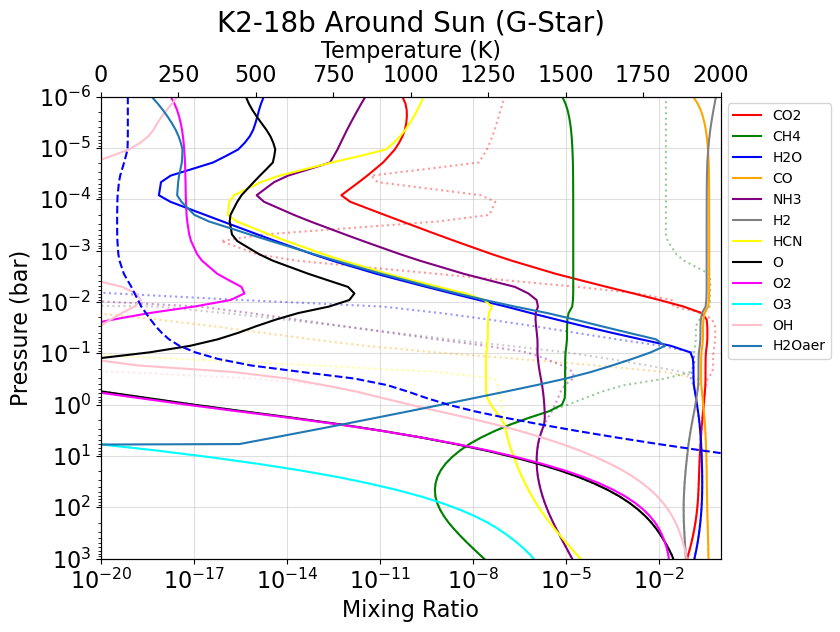

This is an example of inputs: [  1.6   3.5 400.   10.    1.    9. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  1.6   3.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 9.0


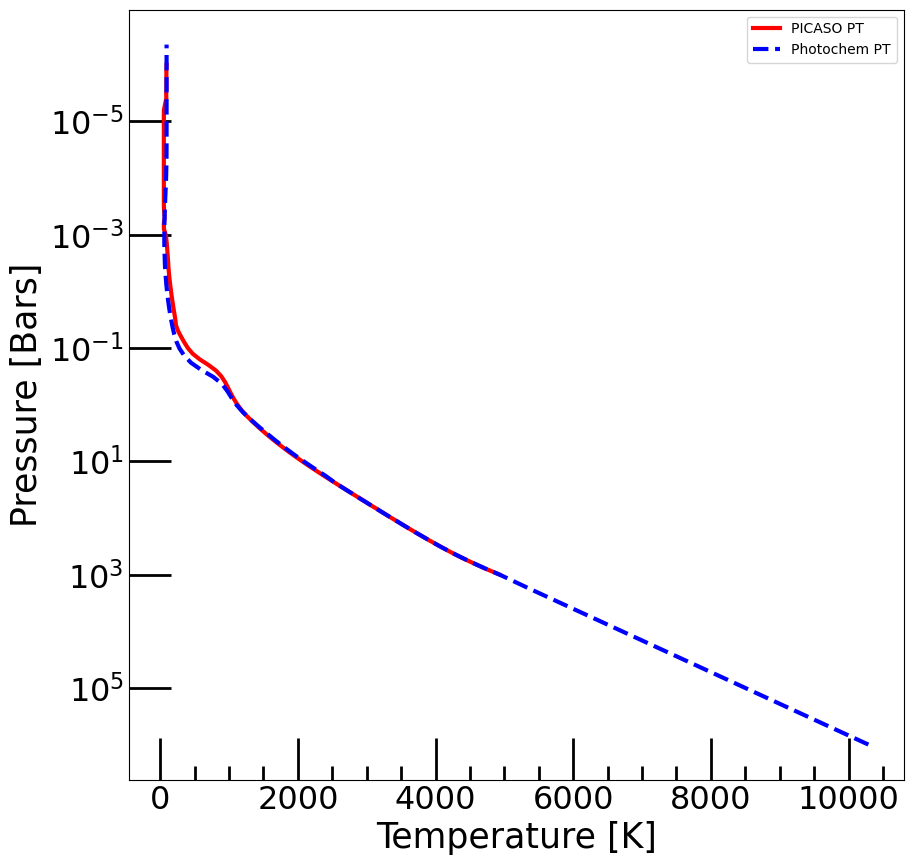

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  1.6   3.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:3.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 9.0


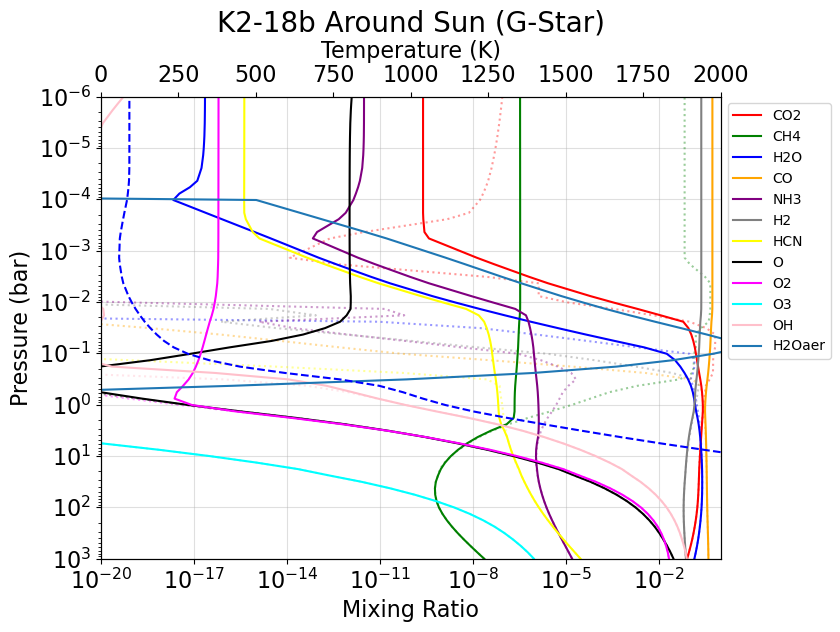

This is an example of inputs: [4.e+00 5.e-01 2.e+01 3.e-01 1.e-02 5.e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 2.e+01 3.e-01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:0.3, ctoO: 0.01, log_Kzz: 5.0


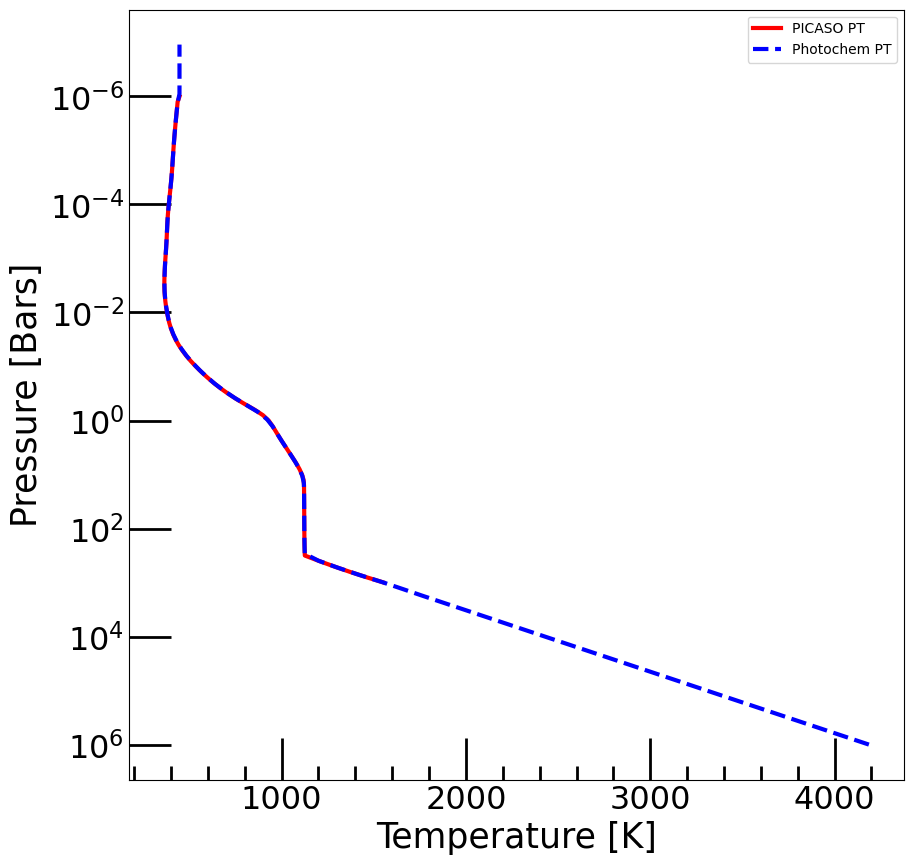

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 2.e+01 3.e-01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:0.3, ctoO: 0.01, log_Kzz: 5.0


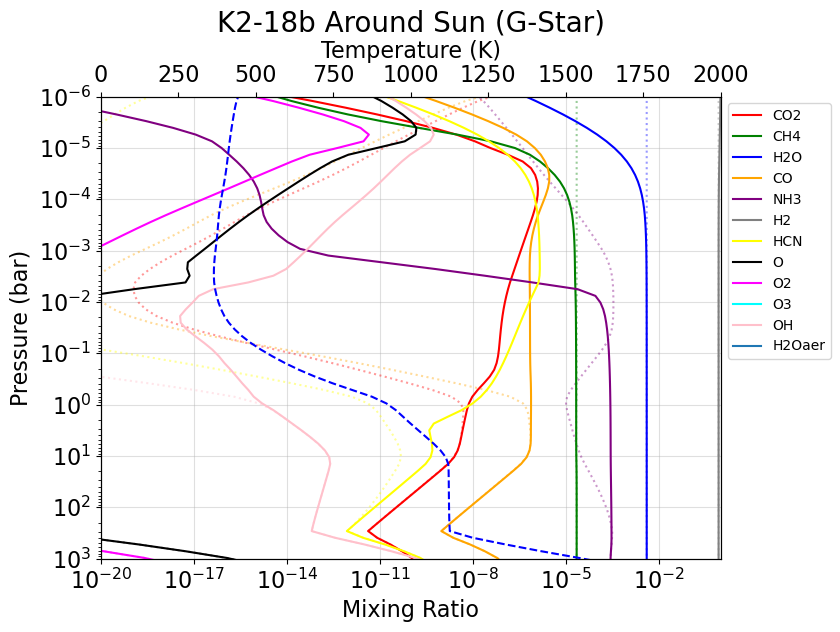

This is an example of inputs: [4.e+00 5.e-01 2.e+01 3.e-01 1.e-02 9.e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 2.e+01 3.e-01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:0.3, ctoO: 0.01, log_Kzz: 9.0


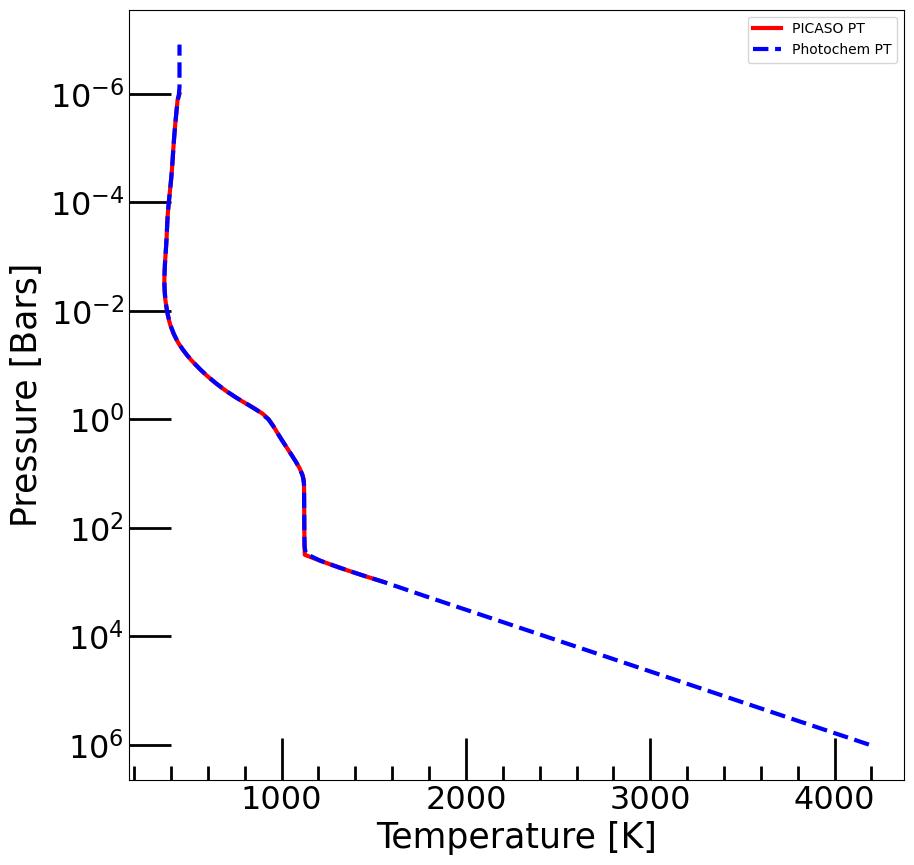

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 2.e+01 3.e-01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:0.3, ctoO: 0.01, log_Kzz: 9.0


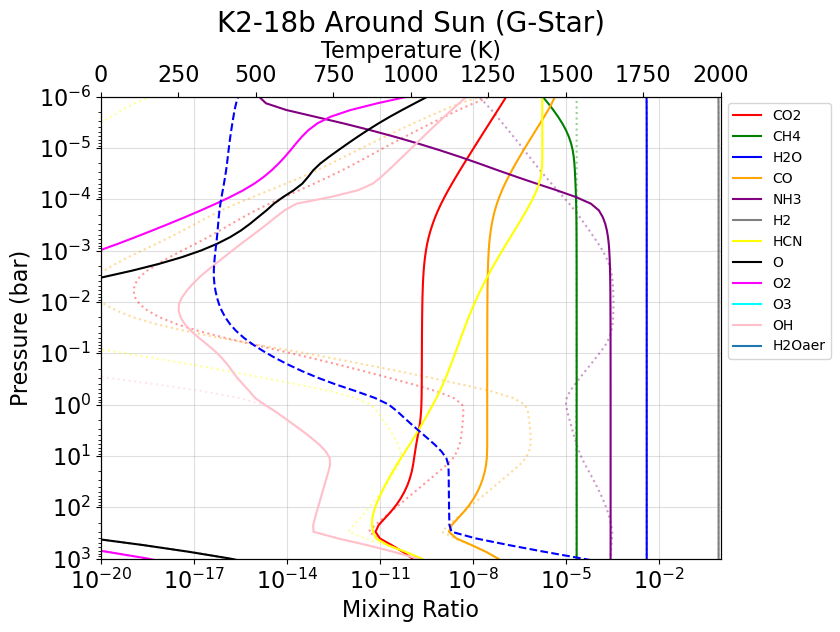

This is an example of inputs: [ 4.   0.5 20.   0.3  1.   5. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 4.   0.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


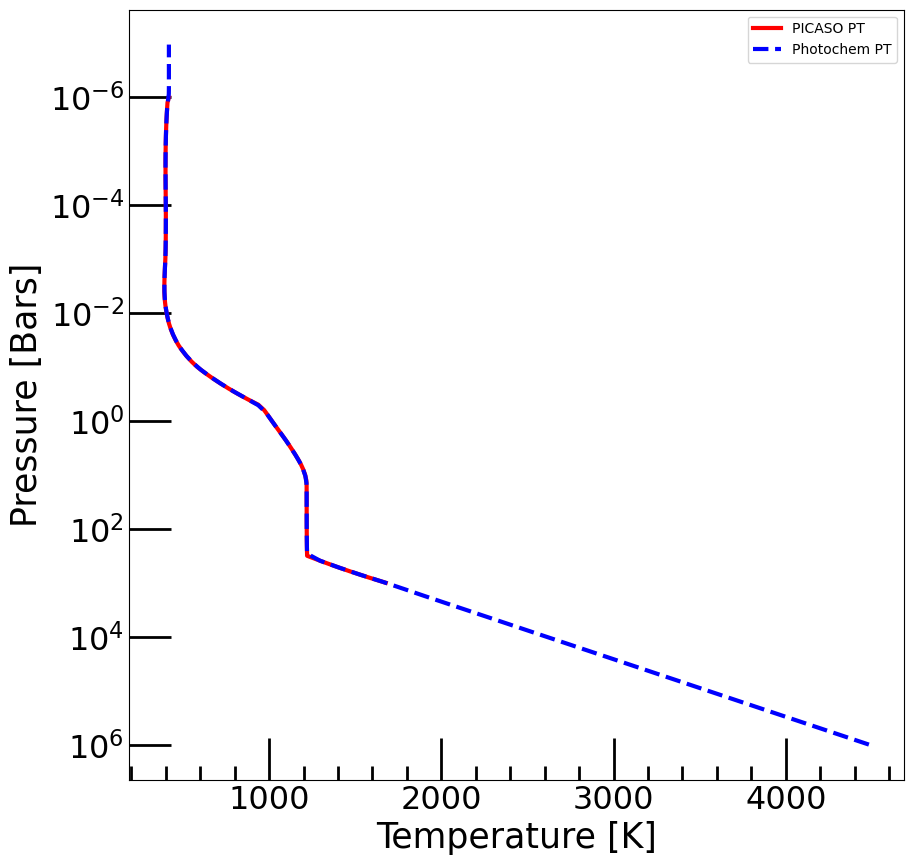

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 4.   0.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


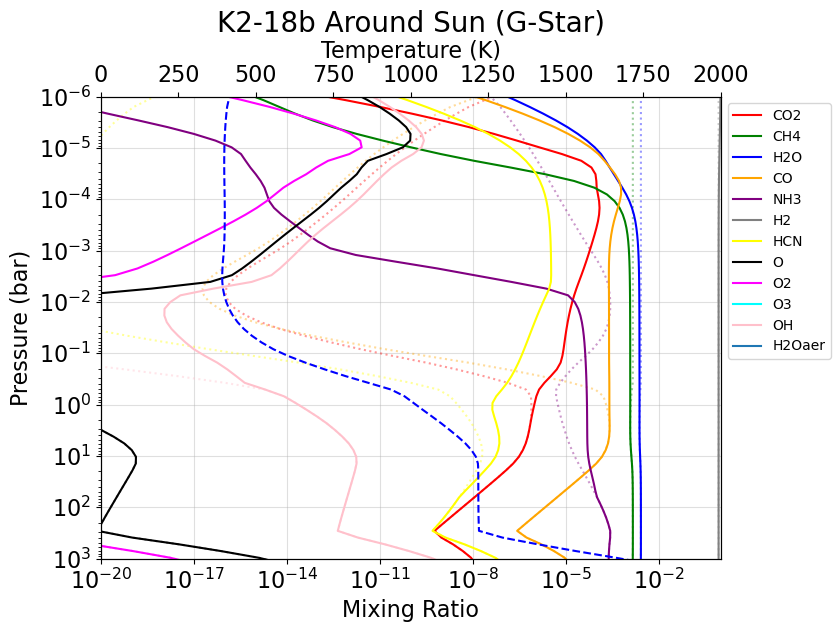

This is an example of inputs: [ 4.   0.5 20.   0.3  1.   9. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 4.   0.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


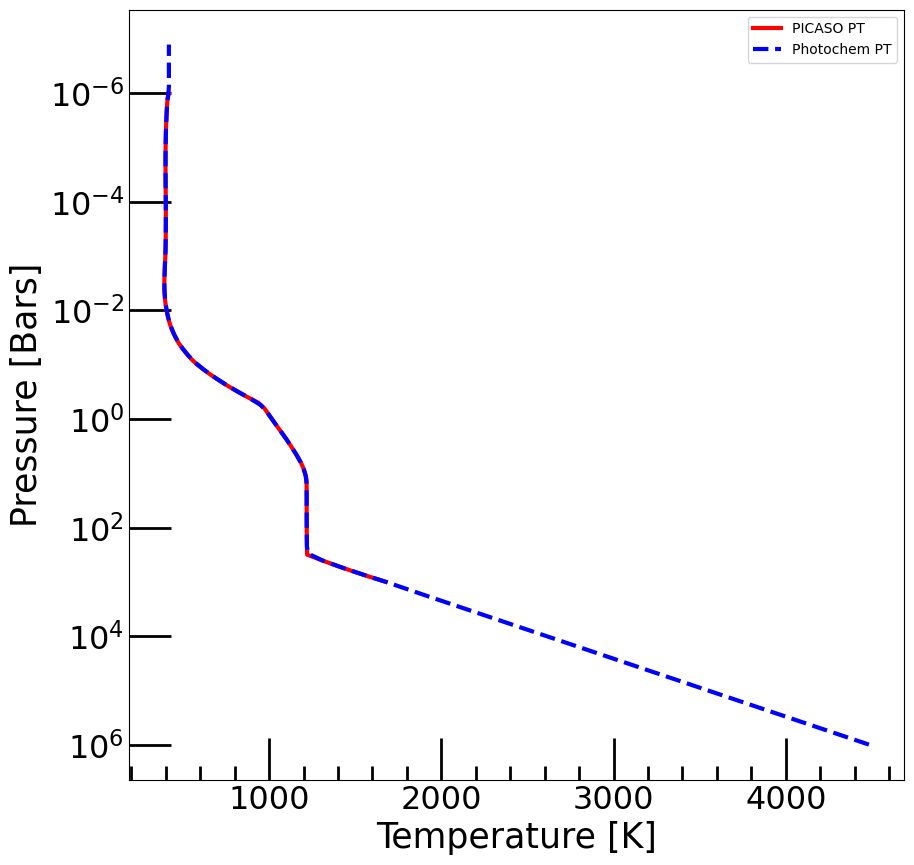

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 4.   0.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


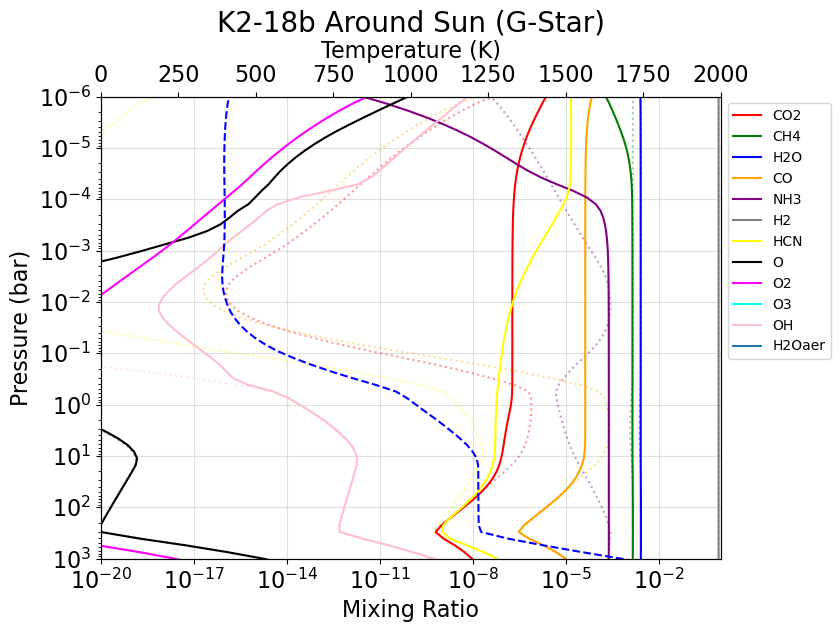

This is an example of inputs: [4.e+00 5.e-01 2.e+01 1.e+01 1.e-02 5.e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 2.e+01 1.e+01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:10.0, ctoO: 0.01, log_Kzz: 5.0


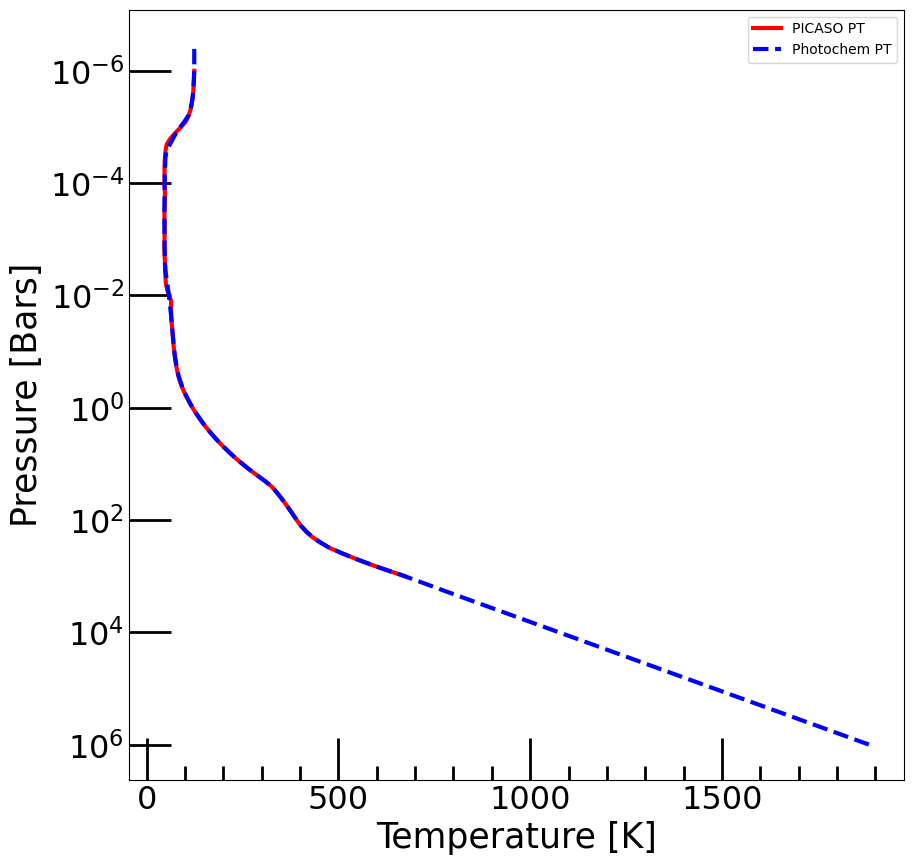

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 2.e+01 1.e+01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:10.0, ctoO: 0.01, log_Kzz: 5.0


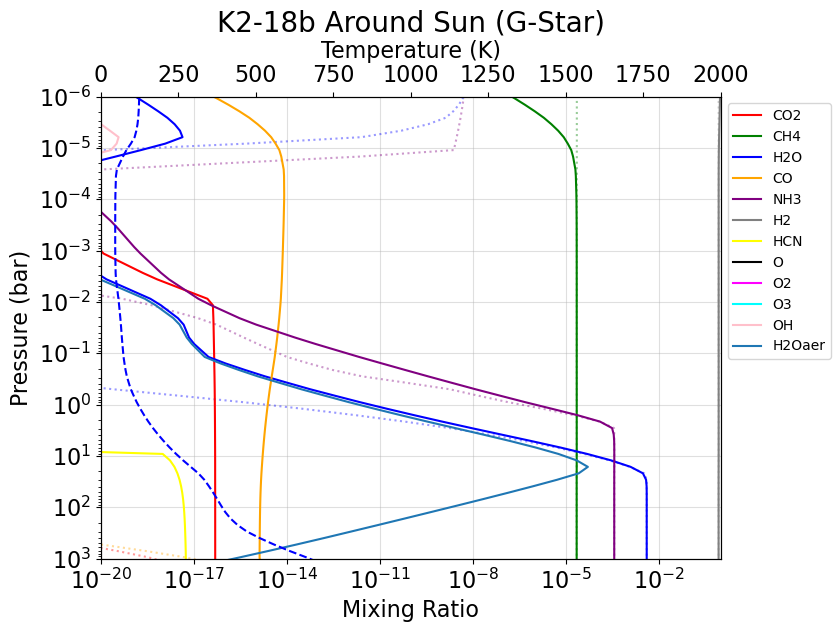

This is an example of inputs: [4.e+00 5.e-01 2.e+01 1.e+01 1.e-02 9.e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 2.e+01 1.e+01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:10.0, ctoO: 0.01, log_Kzz: 9.0


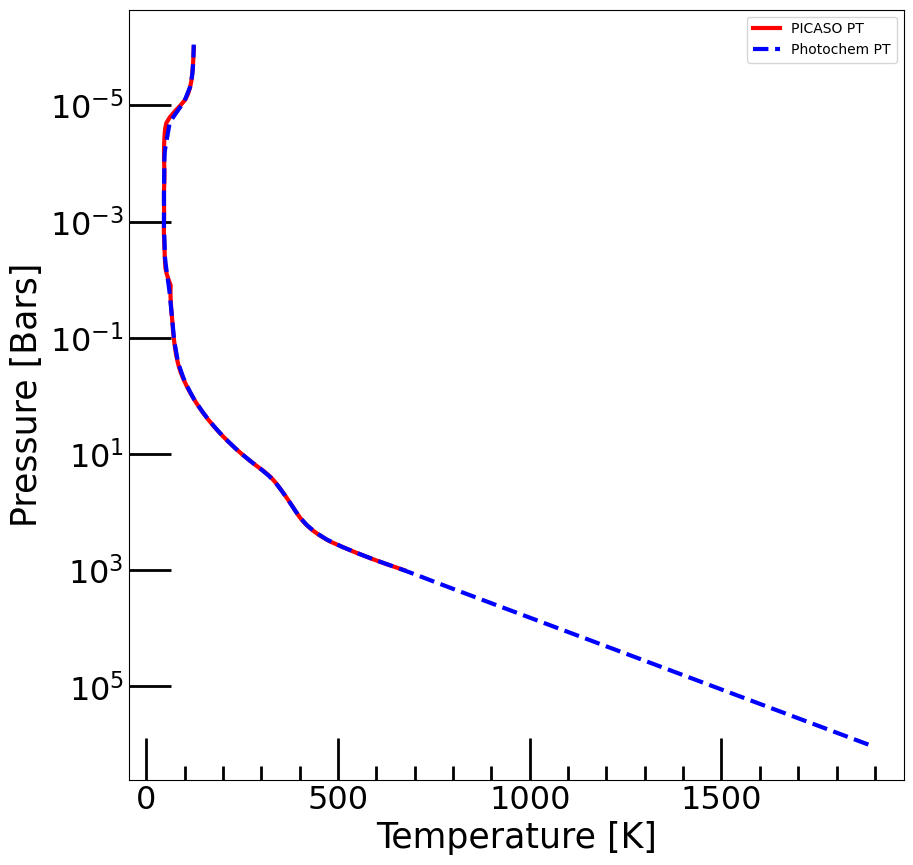

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 2.e+01 1.e+01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:10.0, ctoO: 0.01, log_Kzz: 9.0


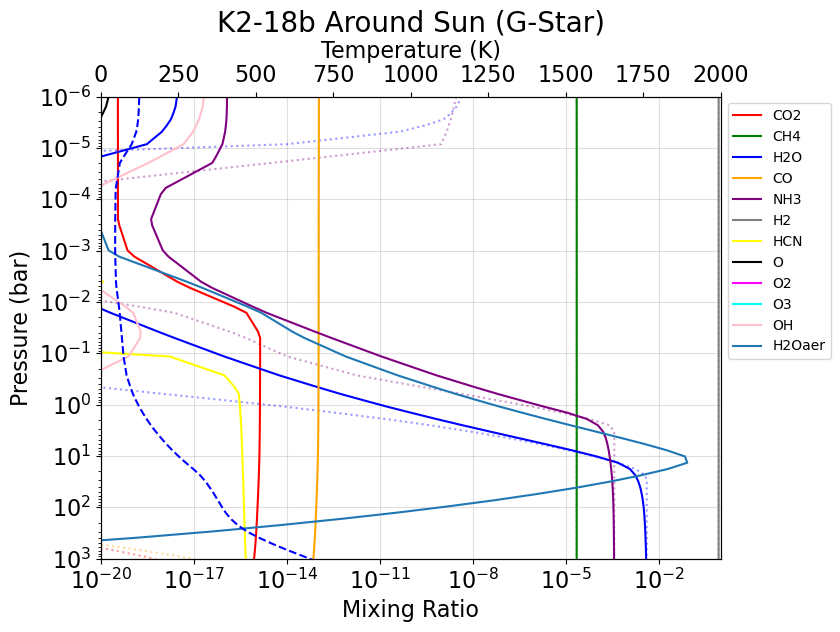

This is an example of inputs: [ 4.   0.5 20.  10.   1.   5. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 4.   0.5 20.  10.   1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:10.0, ctoO: 1.0, log_Kzz: 5.0


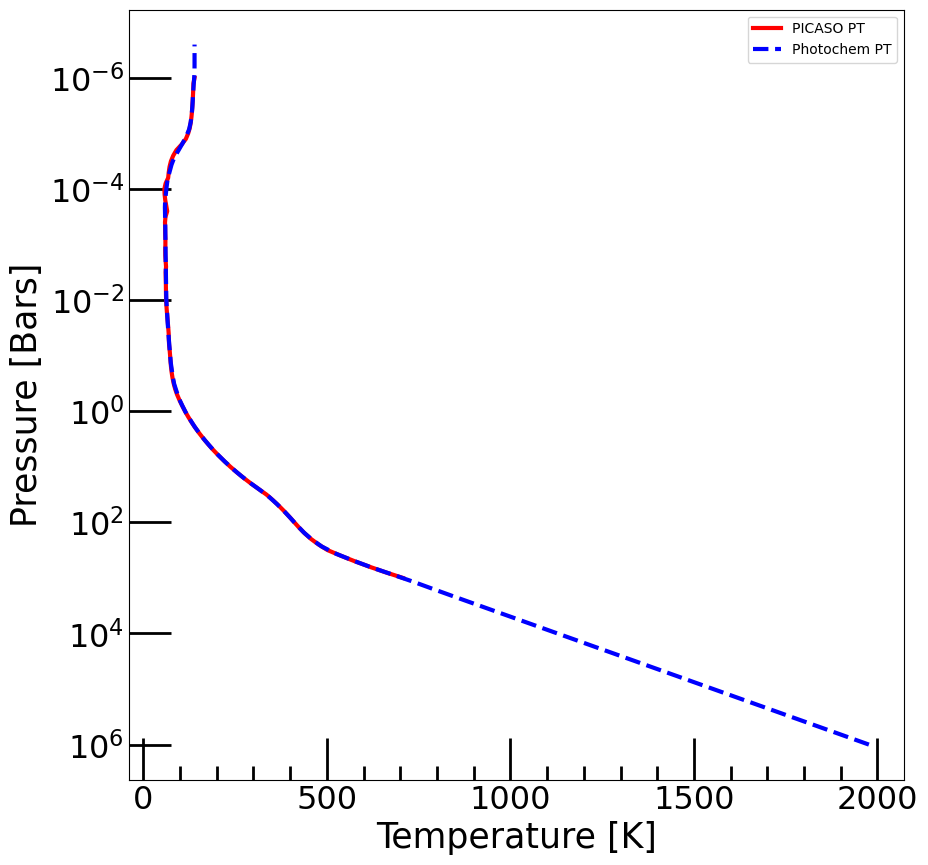

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 4.   0.5 20.  10.   1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:10.0, ctoO: 1.0, log_Kzz: 5.0


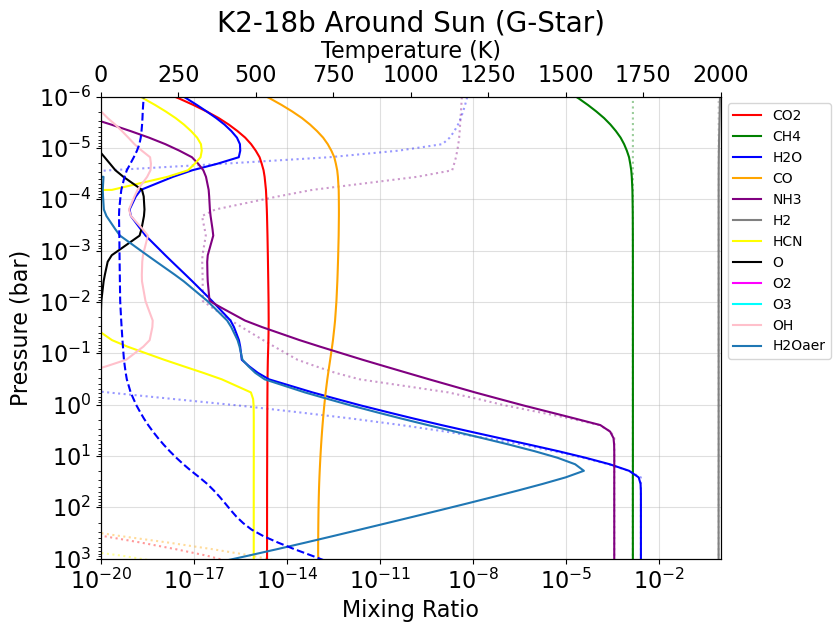

This is an example of inputs: [ 4.   0.5 20.  10.   1.   9. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 4.   0.5 20.  10.   1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:10.0, ctoO: 1.0, log_Kzz: 9.0


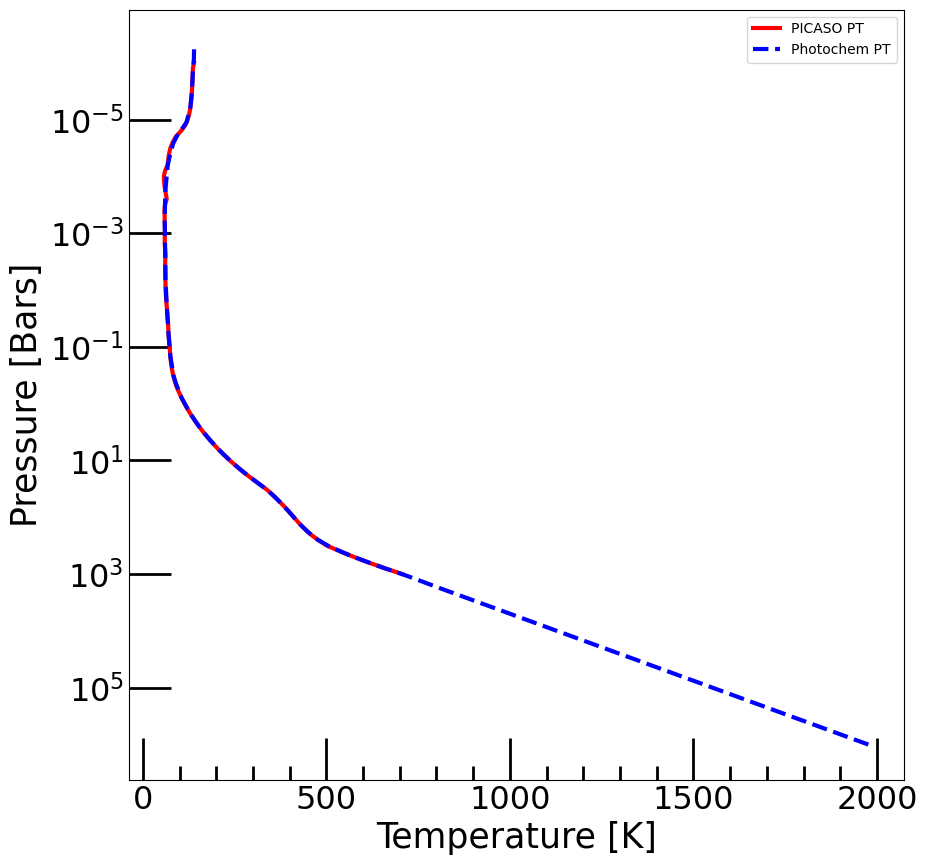

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 4.   0.5 20.  10.   1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:20.0, semi major:10.0, ctoO: 1.0, log_Kzz: 9.0


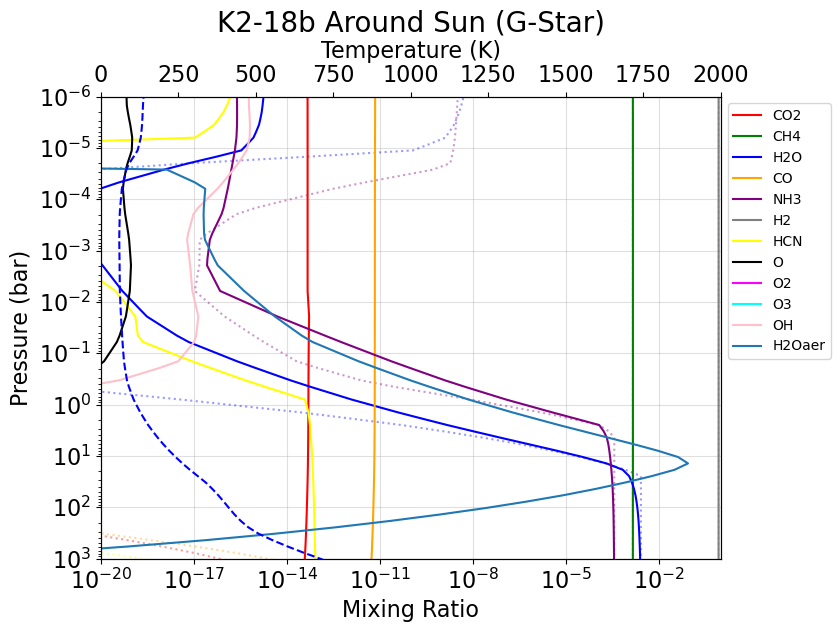

This is an example of inputs: [4.e+00 5.e-01 4.e+02 3.e-01 1.e-02 5.e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 4.e+02 3.e-01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 5.0


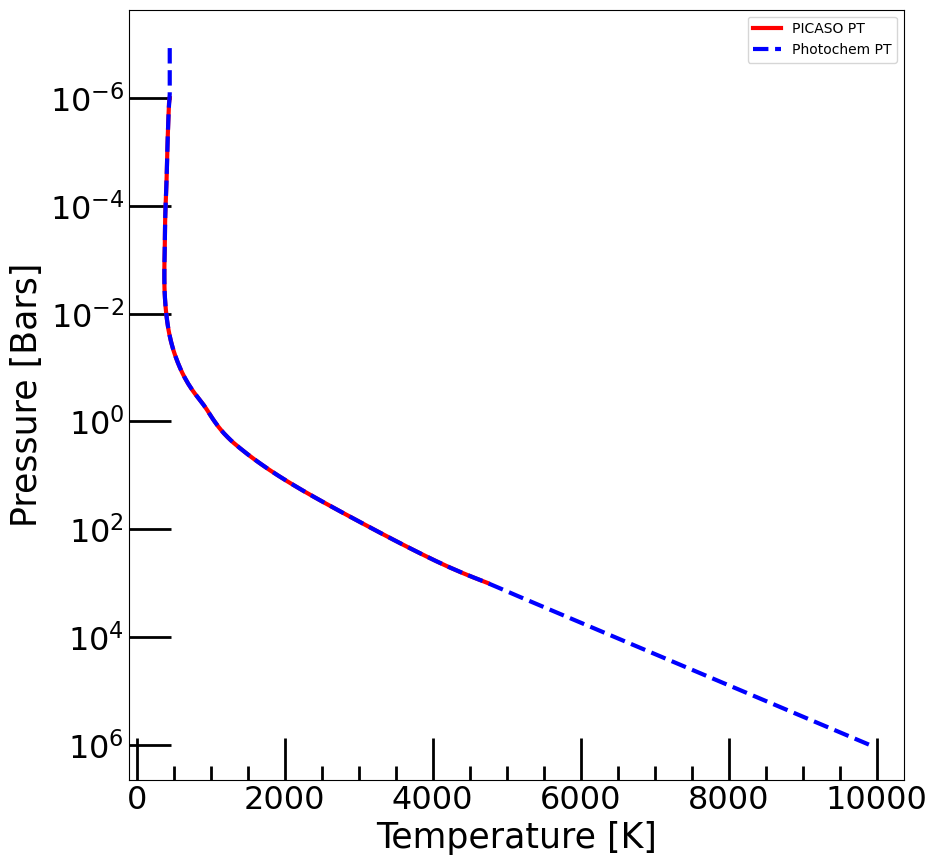

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 4.e+02 3.e-01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 5.0


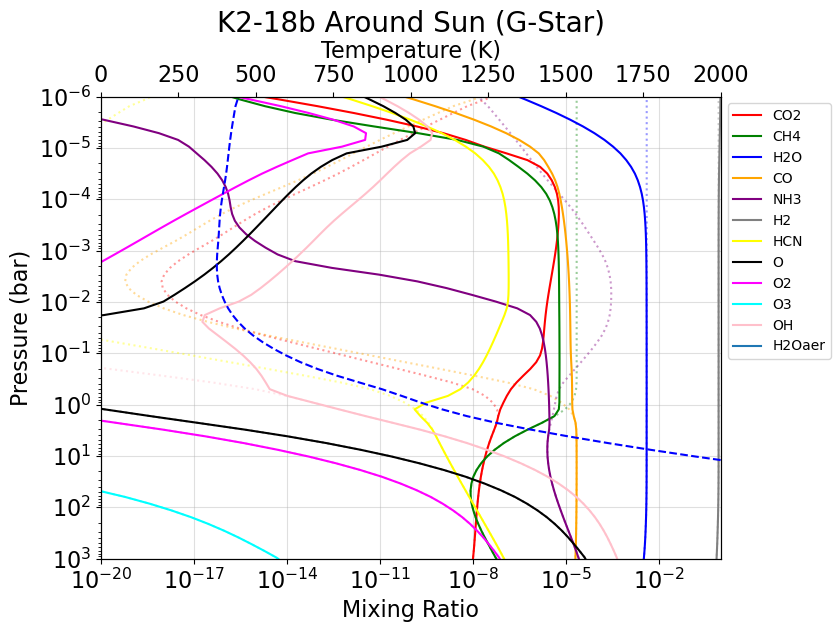

This is an example of inputs: [4.e+00 5.e-01 4.e+02 3.e-01 1.e-02 9.e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 4.e+02 3.e-01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 9.0


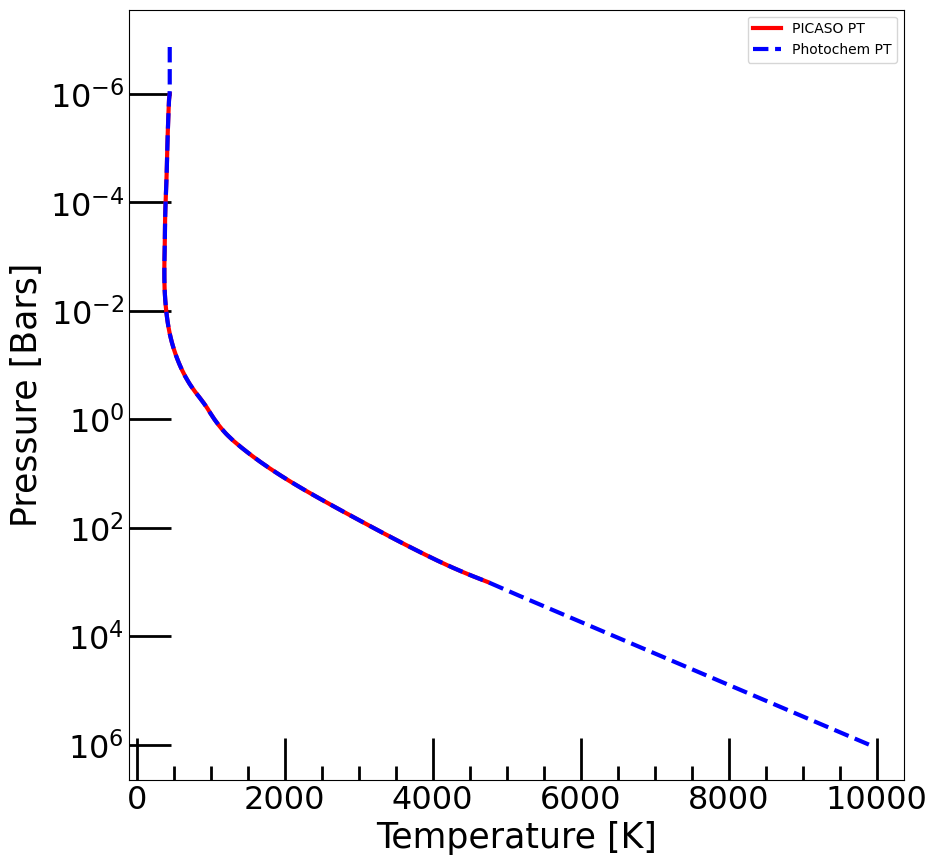

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 4.e+02 3.e-01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 9.0


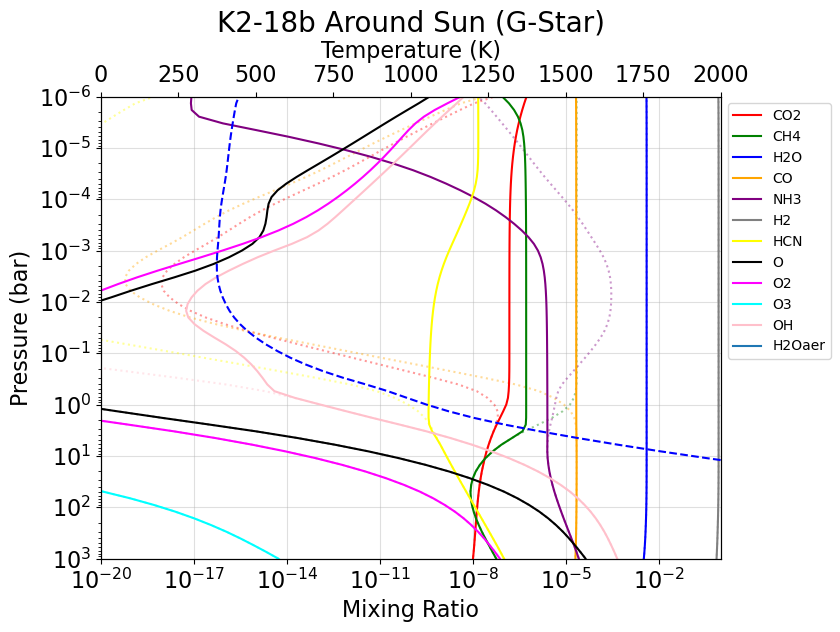

This is an example of inputs: [4.e+00 5.e-01 4.e+02 3.e-01 1.e+00 5.e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 4.e+02 3.e-01 1.e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


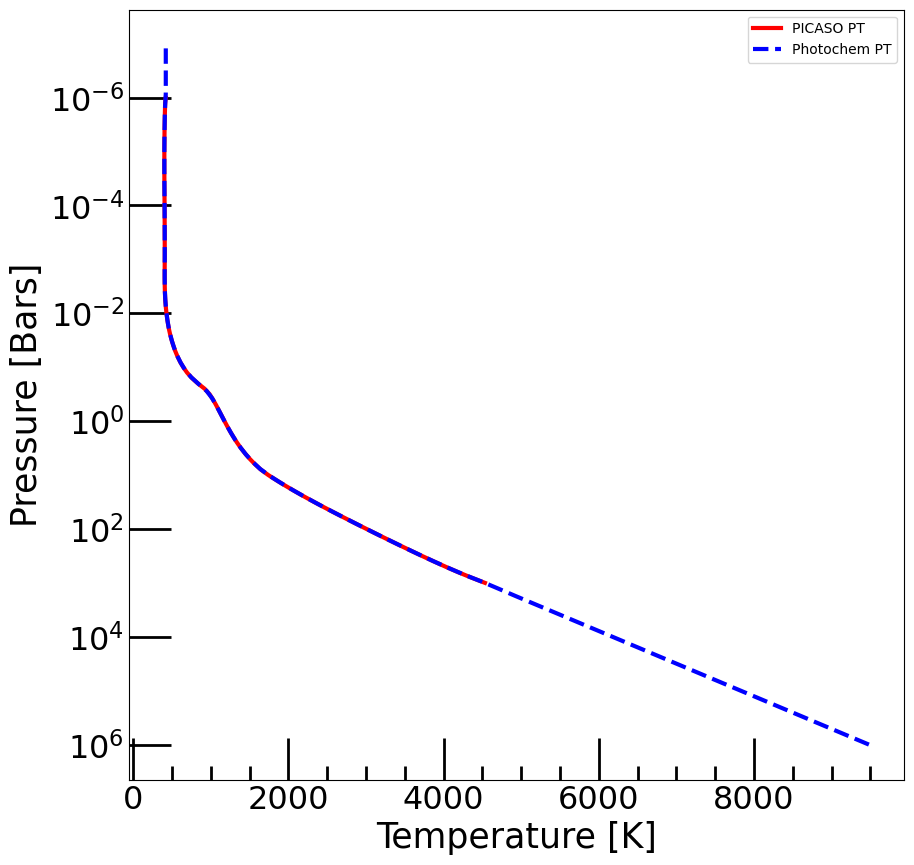

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 4.e+02 3.e-01 1.e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


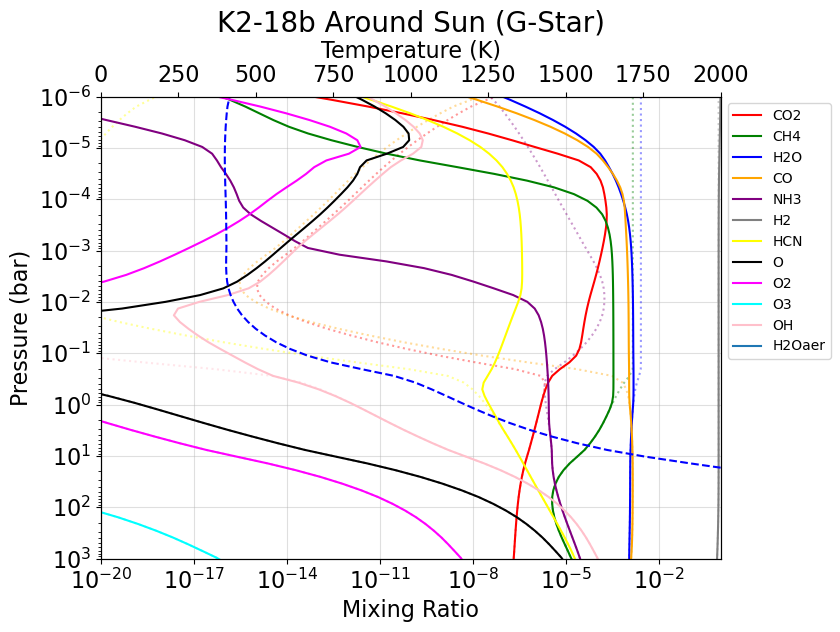

This is an example of inputs: [4.e+00 5.e-01 4.e+02 3.e-01 1.e+00 9.e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 4.e+02 3.e-01 1.e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


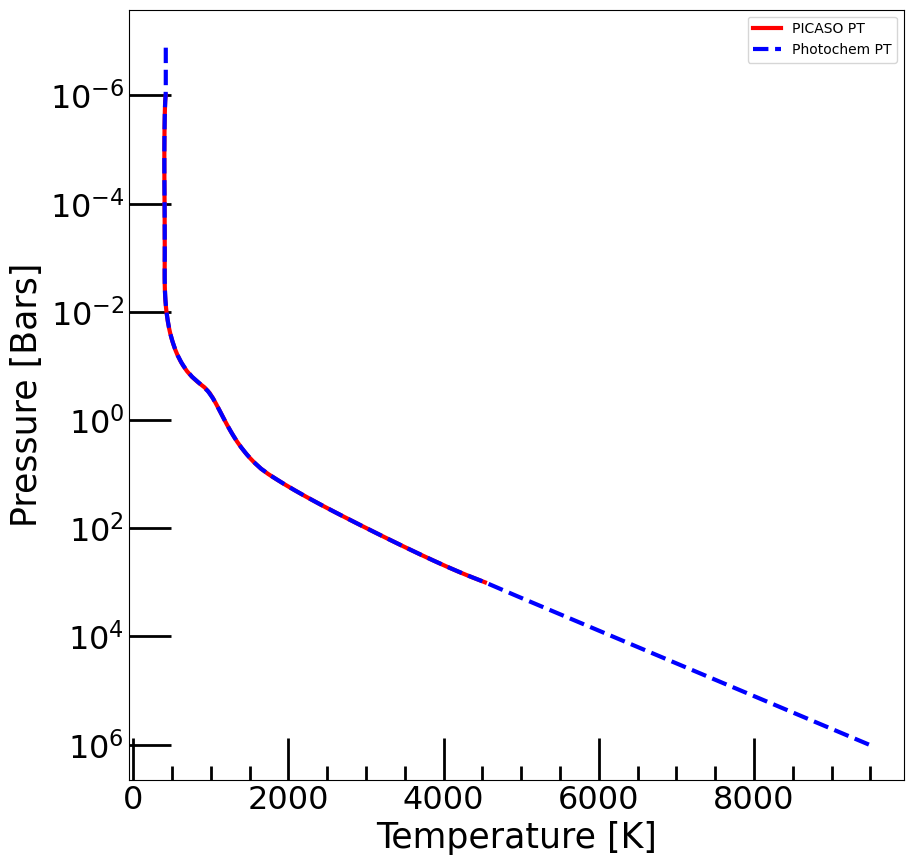

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 4.e+02 3.e-01 1.e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


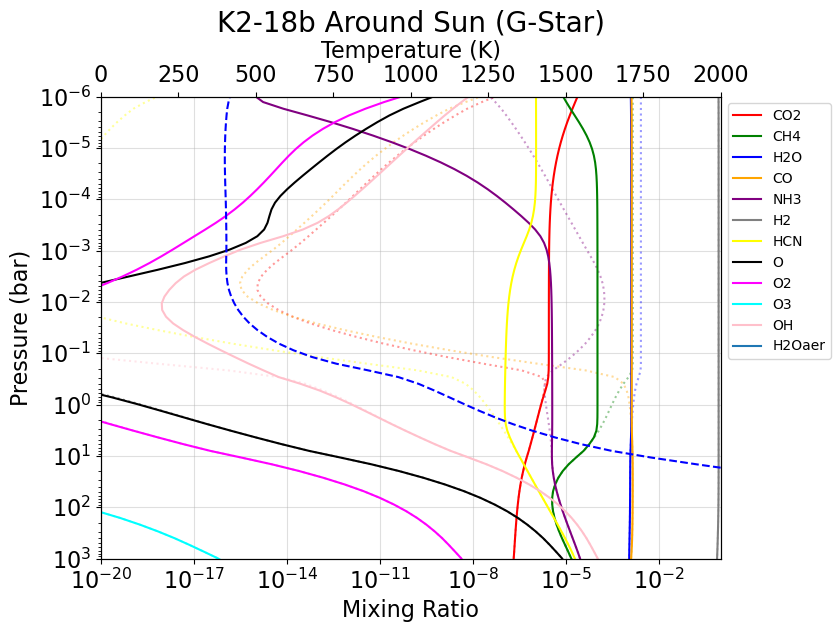

This is an example of inputs: [4.e+00 5.e-01 4.e+02 1.e+01 1.e-02 5.e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 4.e+02 1.e+01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 5.0


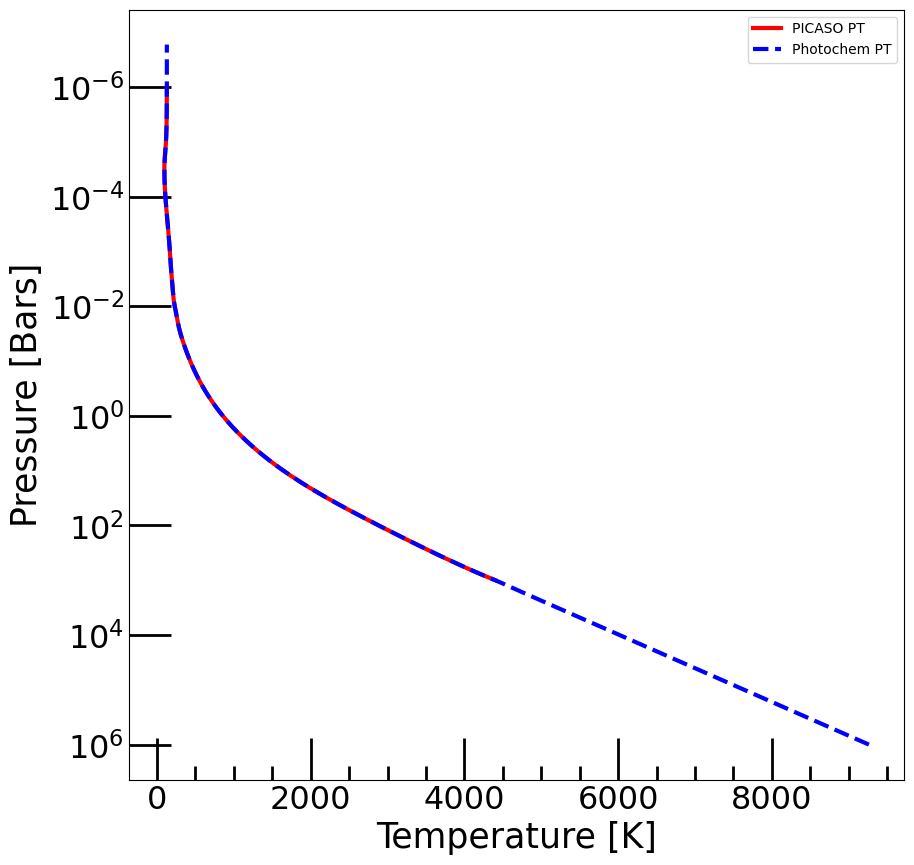

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 4.e+02 1.e+01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 5.0


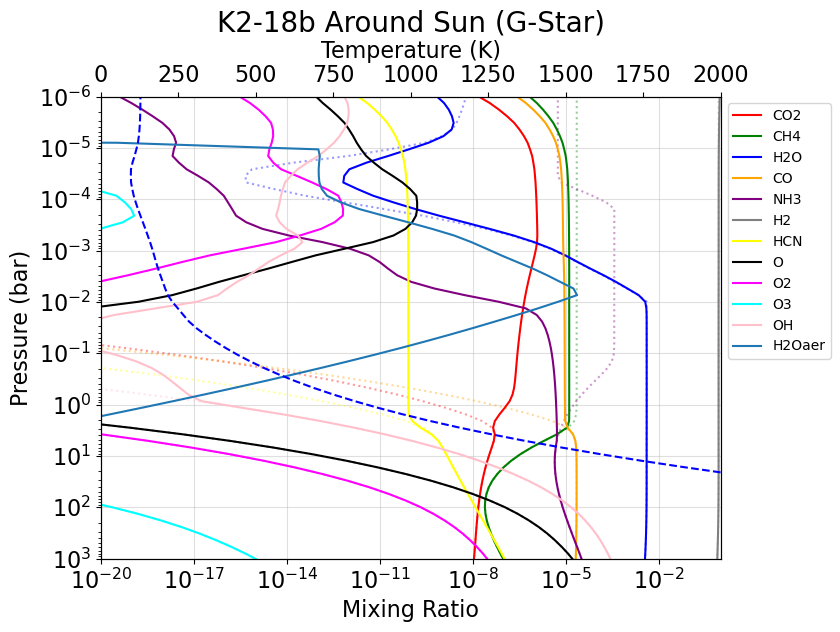

This is an example of inputs: [4.e+00 5.e-01 4.e+02 1.e+01 1.e-02 9.e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 4.e+02 1.e+01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 9.0


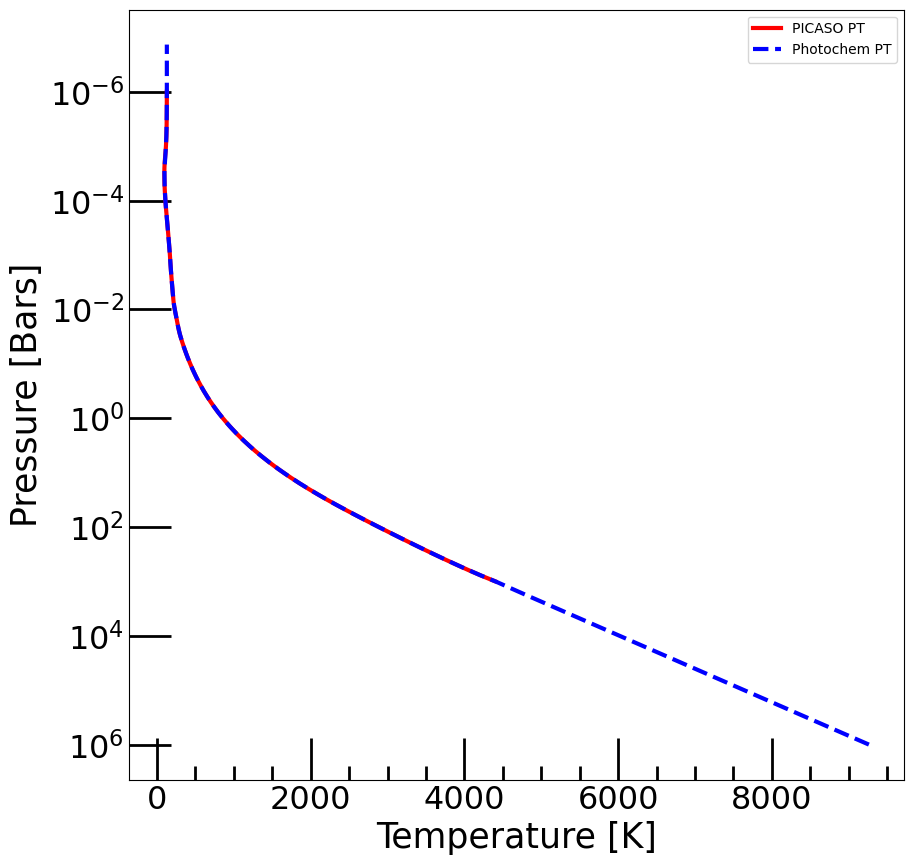

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.e+00 5.e-01 4.e+02 1.e+01 1.e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 9.0


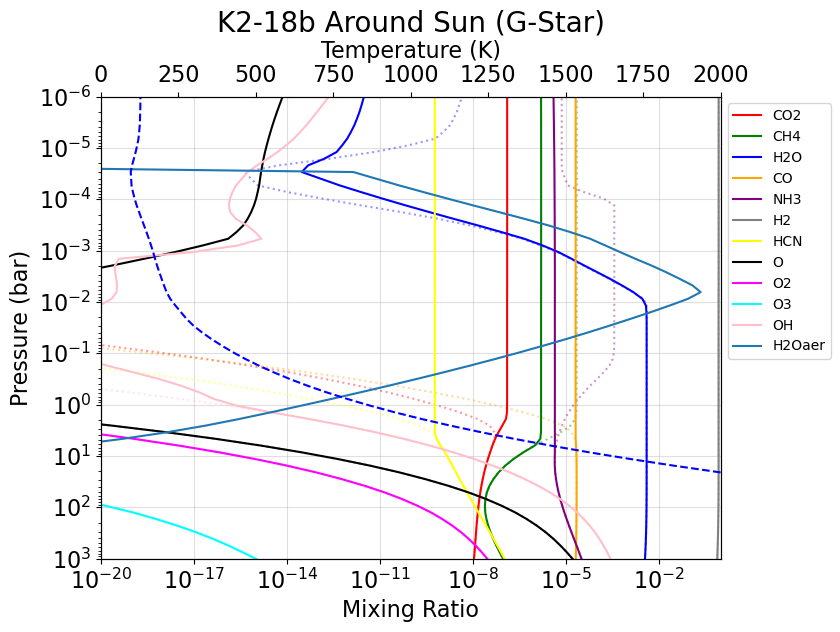

This is an example of inputs: [  4.    0.5 400.   10.    1.    5. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  4.    0.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 5.0


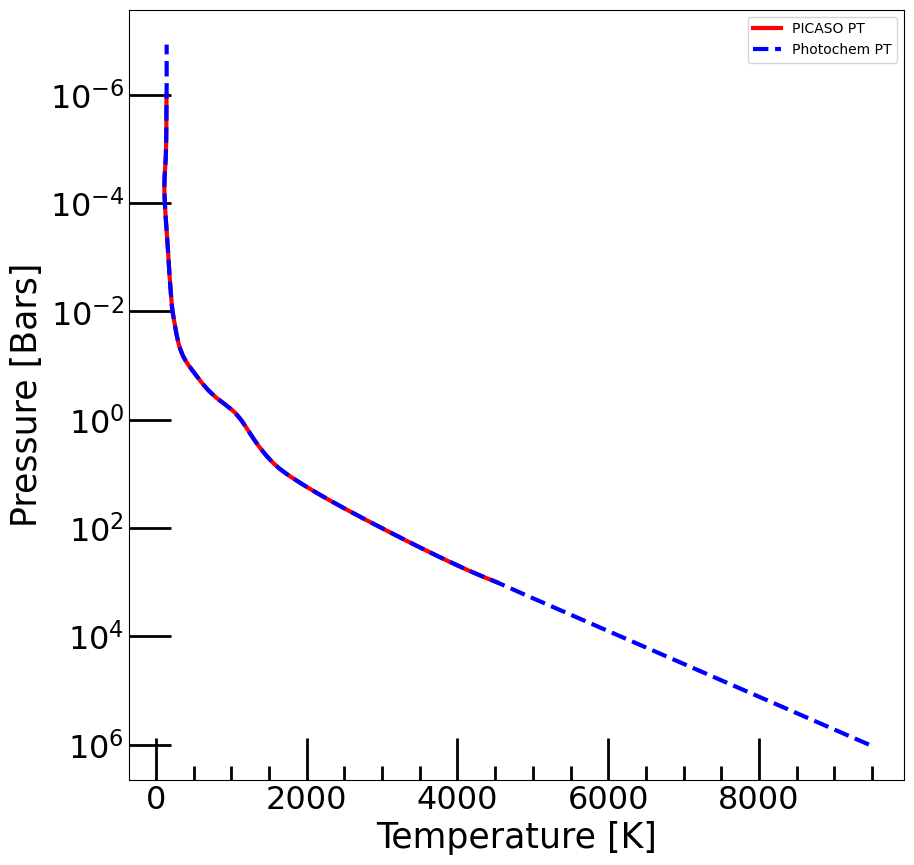

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  4.    0.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 5.0


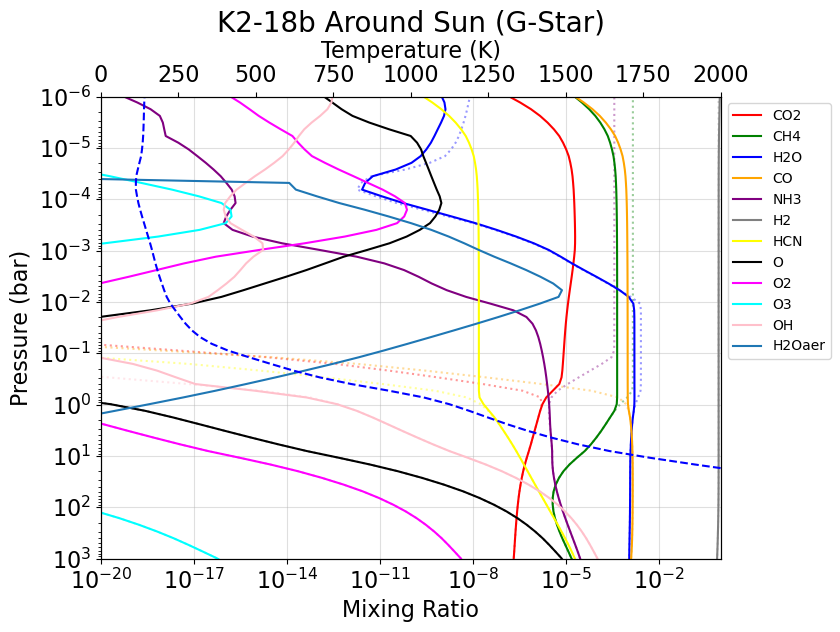

This is an example of inputs: [  4.    0.5 400.   10.    1.    9. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  4.    0.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 9.0


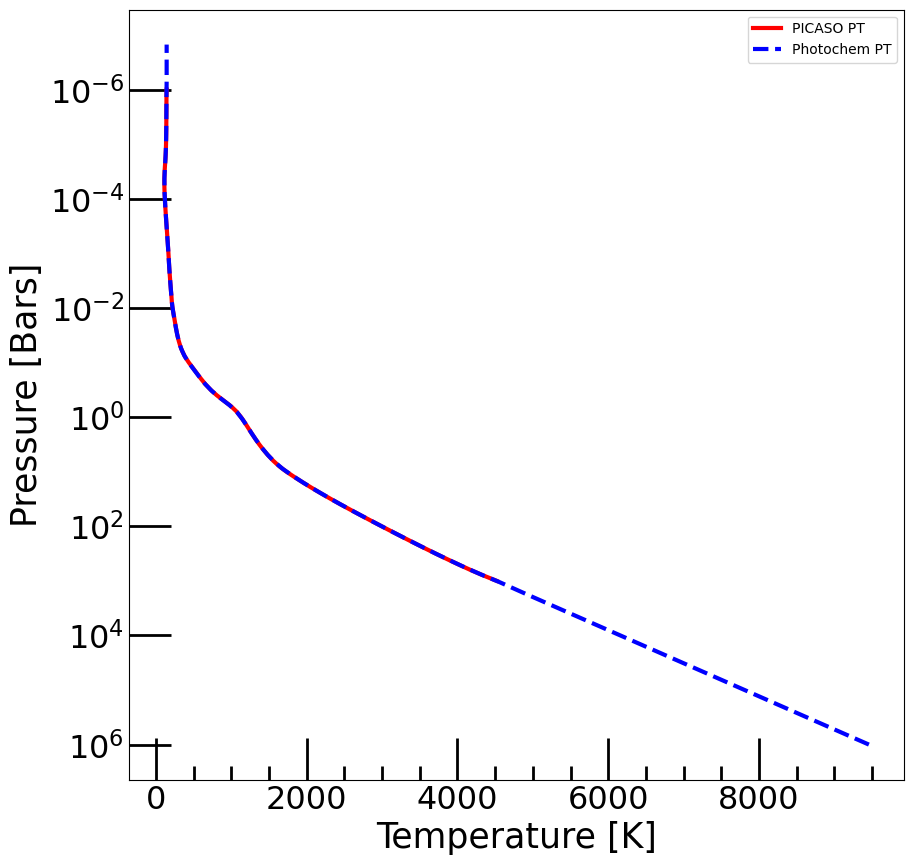

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  4.    0.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:0.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 9.0


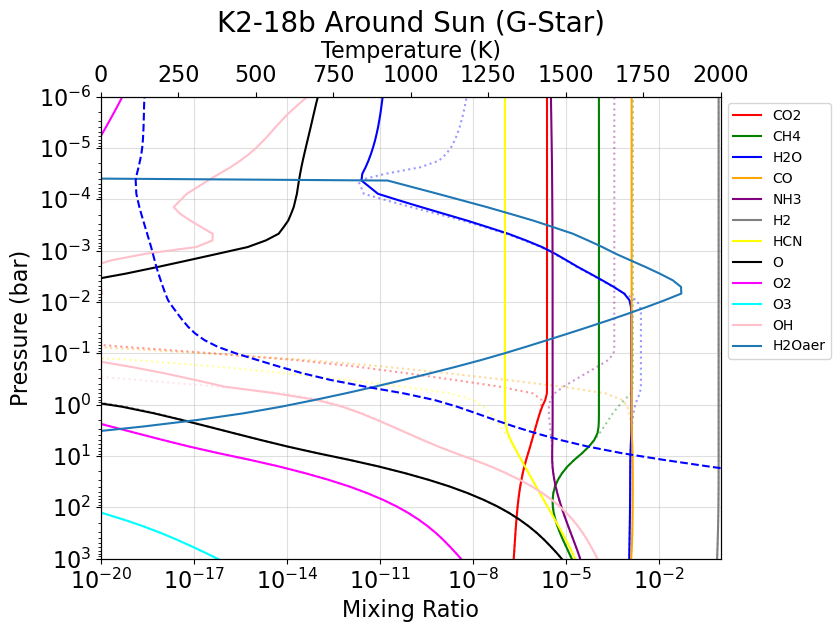

This is an example of inputs: [ 4.   3.5 20.   0.3  1.   5. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 4.   3.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


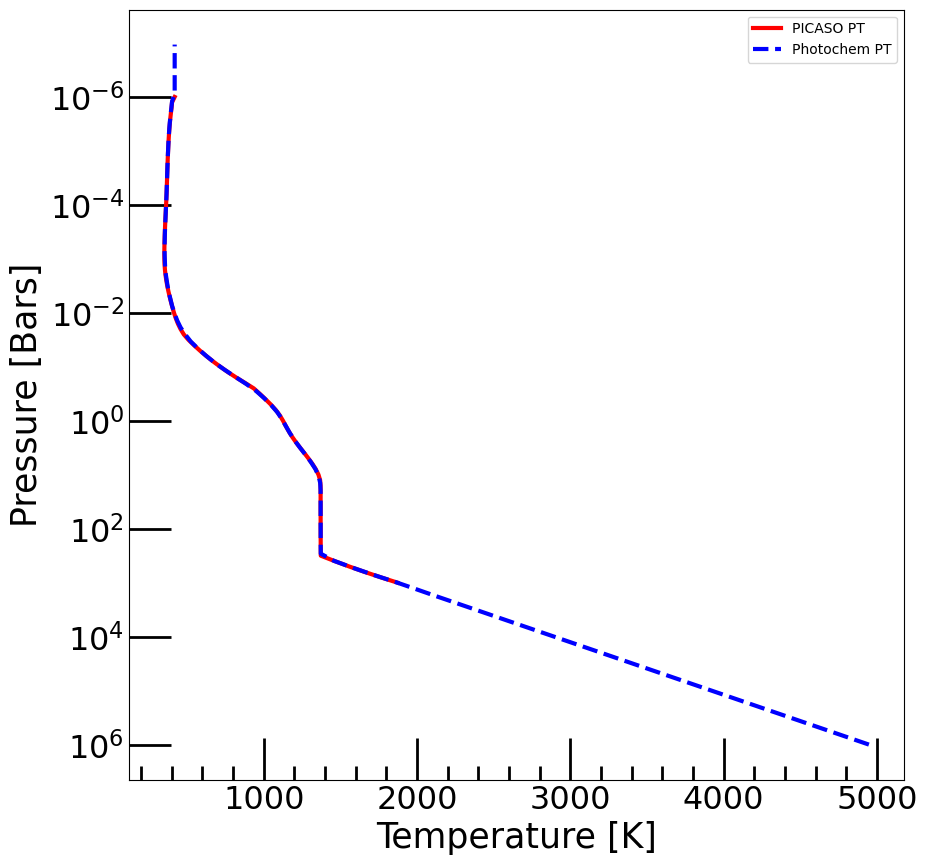

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 4.   3.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


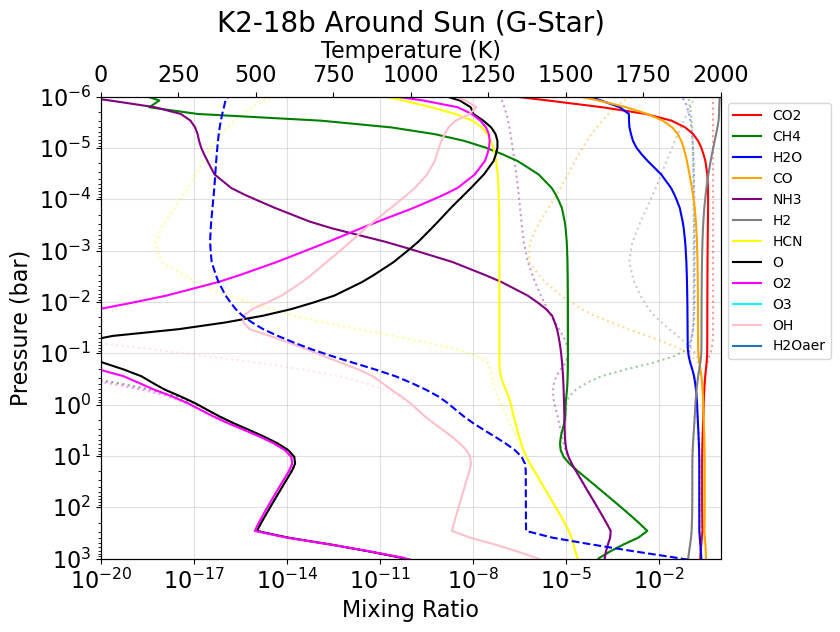

This is an example of inputs: [ 4.   3.5 20.   0.3  1.   9. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 4.   3.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


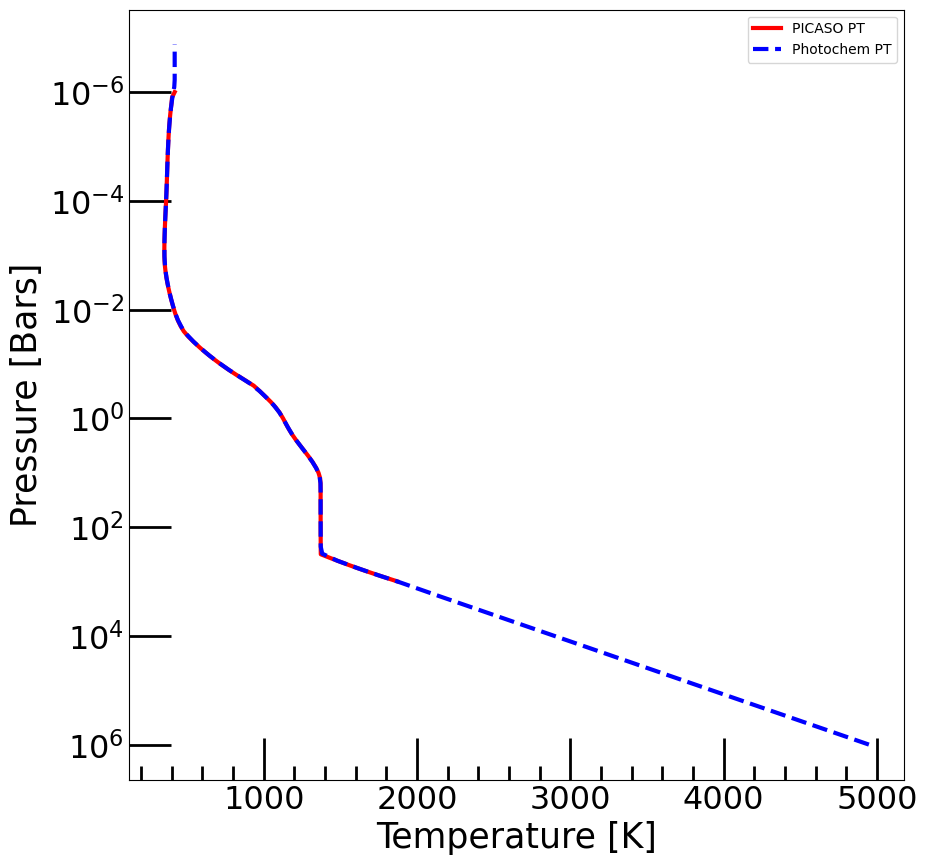

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [ 4.   3.5 20.   0.3  1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:20.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


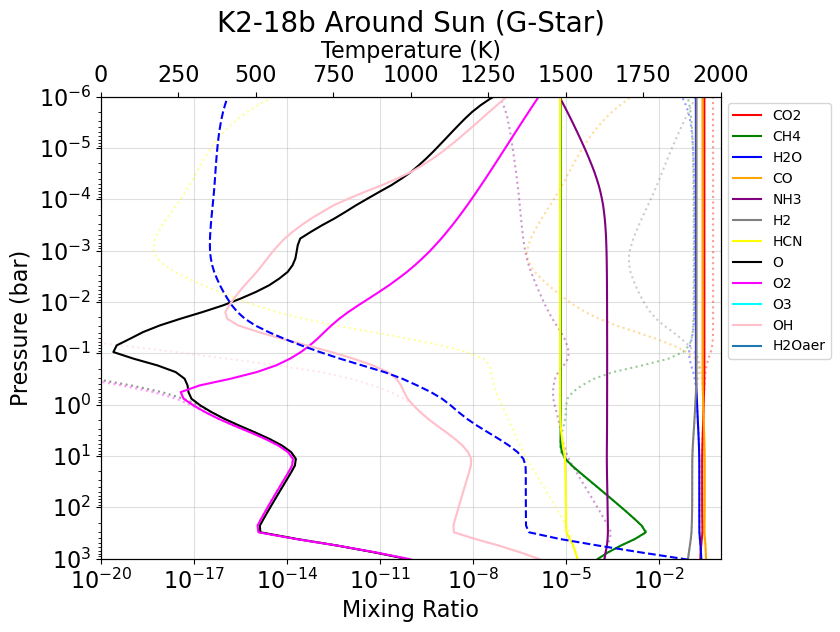

This is an example of inputs: [4.0e+00 3.5e+00 4.0e+02 3.0e-01 1.0e-02 5.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.0e+00 3.5e+00 4.0e+02 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 5.0


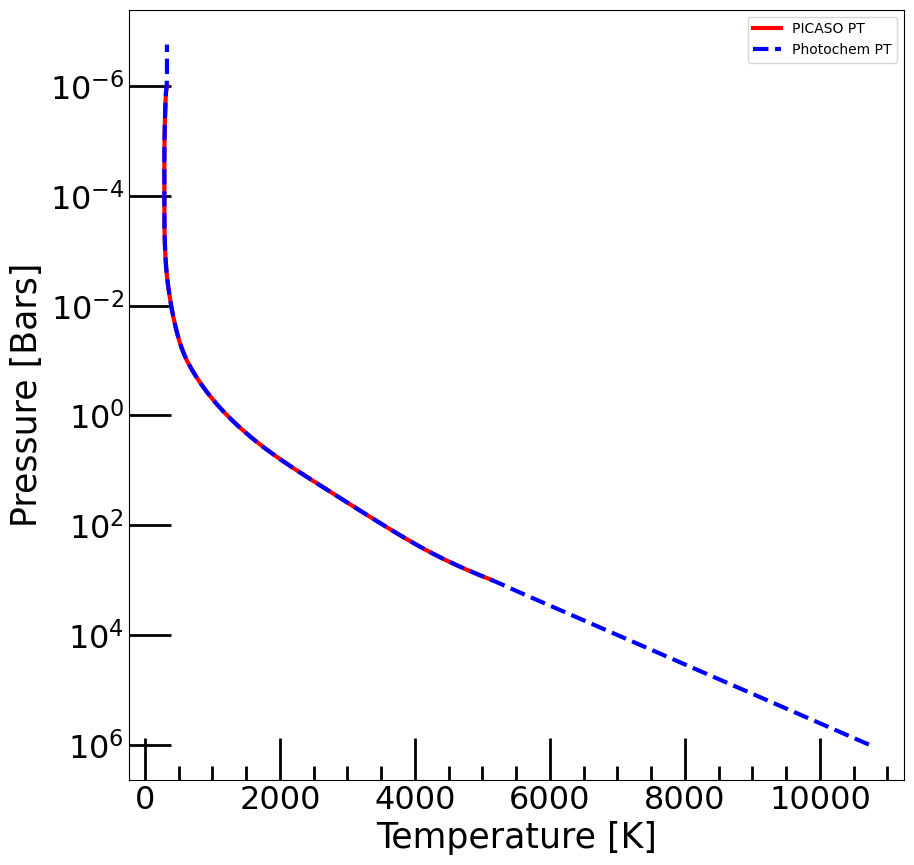

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.0e+00 3.5e+00 4.0e+02 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 5.0


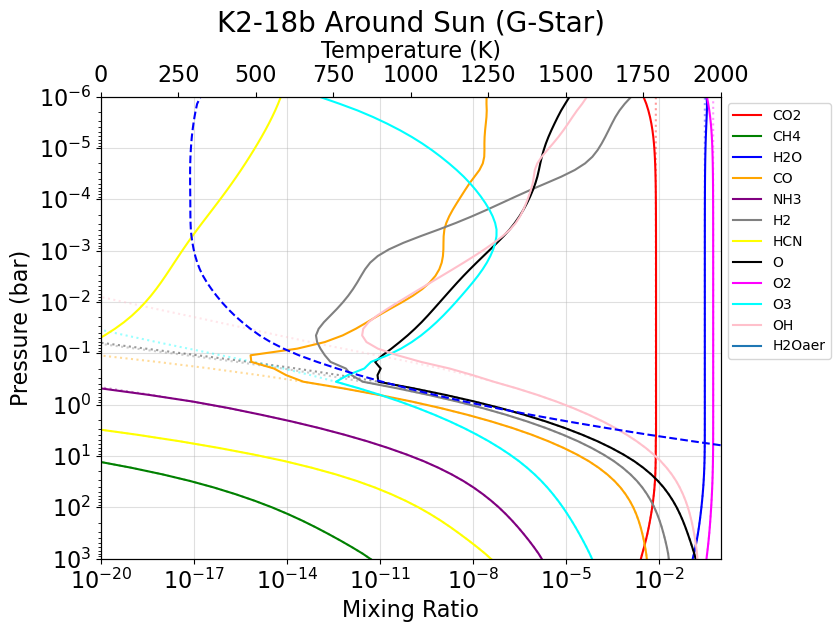

This is an example of inputs: [4.0e+00 3.5e+00 4.0e+02 3.0e-01 1.0e-02 9.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.0e+00 3.5e+00 4.0e+02 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 9.0


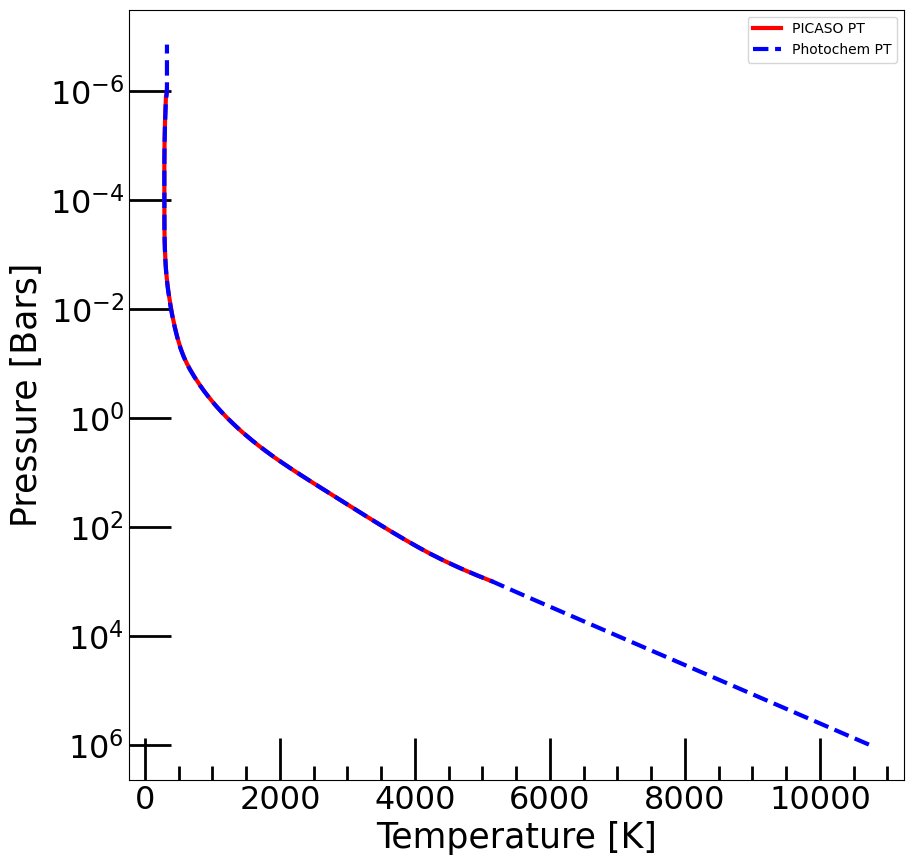

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.0e+00 3.5e+00 4.0e+02 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:0.3, ctoO: 0.01, log_Kzz: 9.0


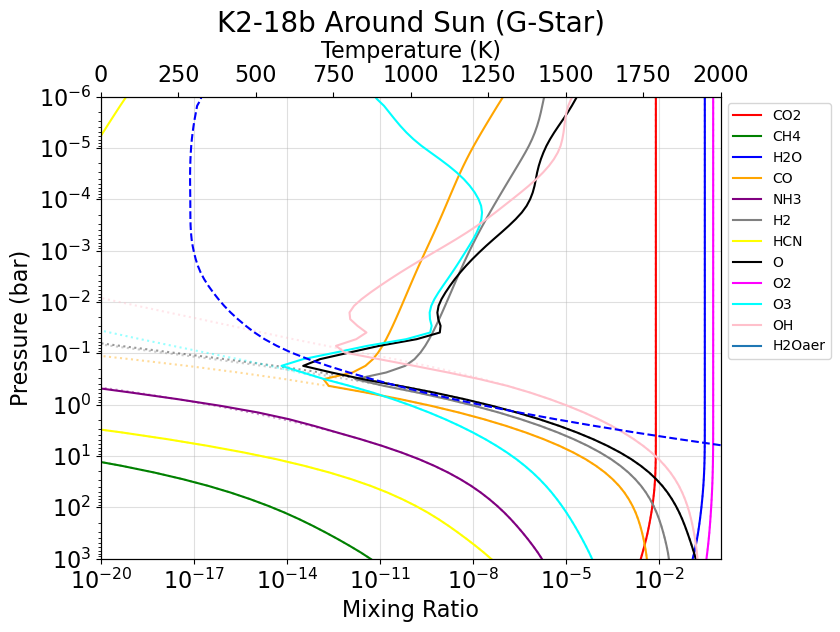

This is an example of inputs: [4.0e+00 3.5e+00 4.0e+02 3.0e-01 1.0e+00 5.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.0e+00 3.5e+00 4.0e+02 3.0e-01 1.0e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


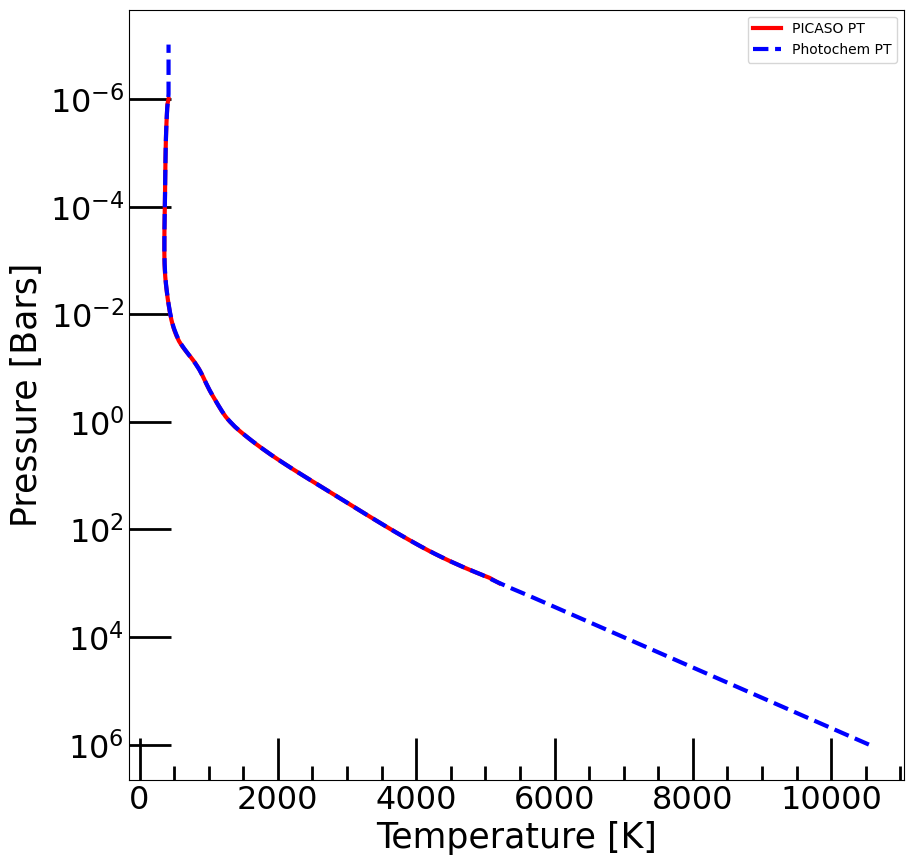

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.0e+00 3.5e+00 4.0e+02 3.0e-01 1.0e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 5.0


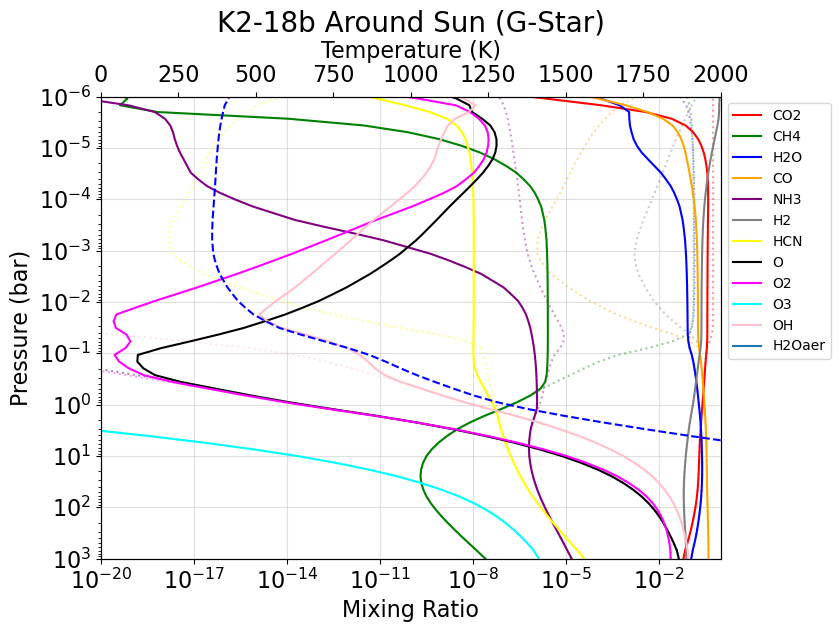

This is an example of inputs: [4.0e+00 3.5e+00 4.0e+02 3.0e-01 1.0e+00 9.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.0e+00 3.5e+00 4.0e+02 3.0e-01 1.0e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


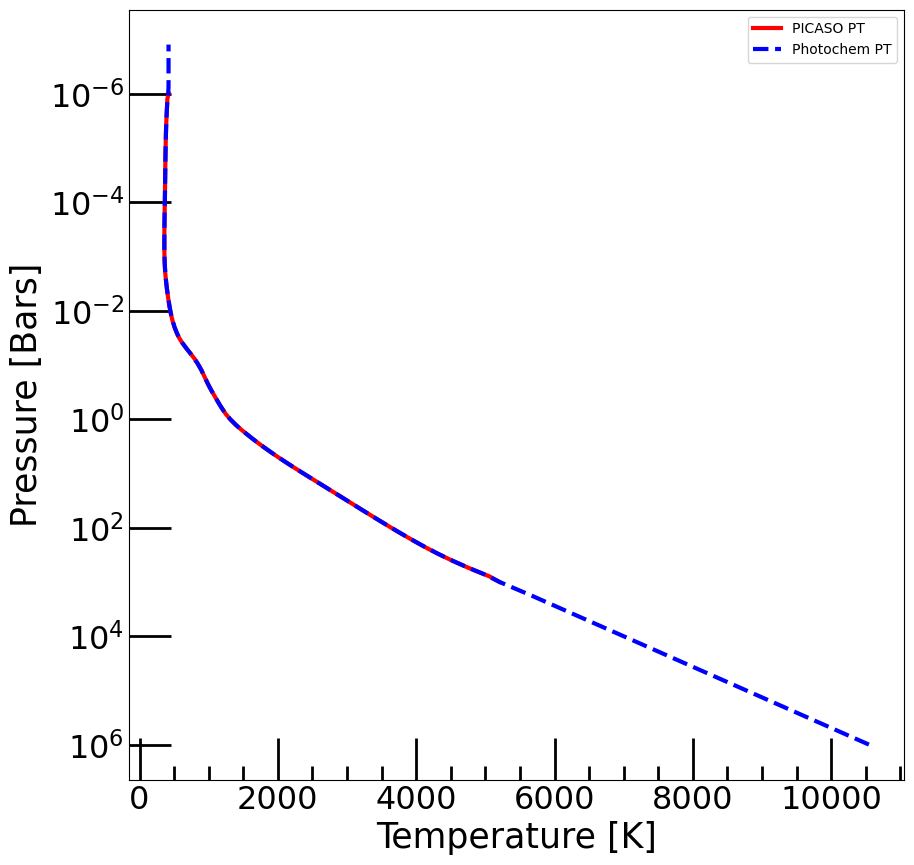

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.0e+00 3.5e+00 4.0e+02 3.0e-01 1.0e+00]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:0.3, ctoO: 1.0, log_Kzz: 9.0


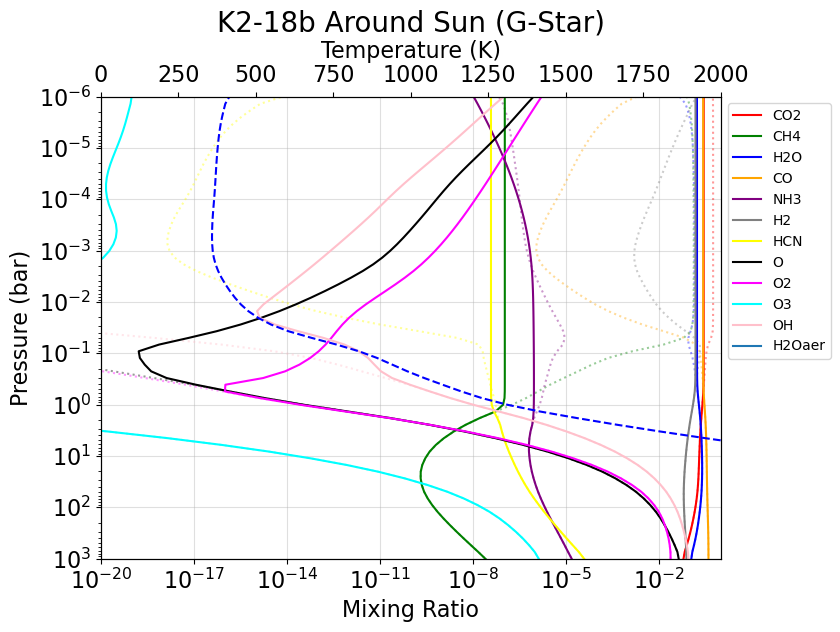

This is an example of inputs: [4.0e+00 3.5e+00 4.0e+02 1.0e+01 1.0e-02 5.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.0e+00 3.5e+00 4.0e+02 1.0e+01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 5.0


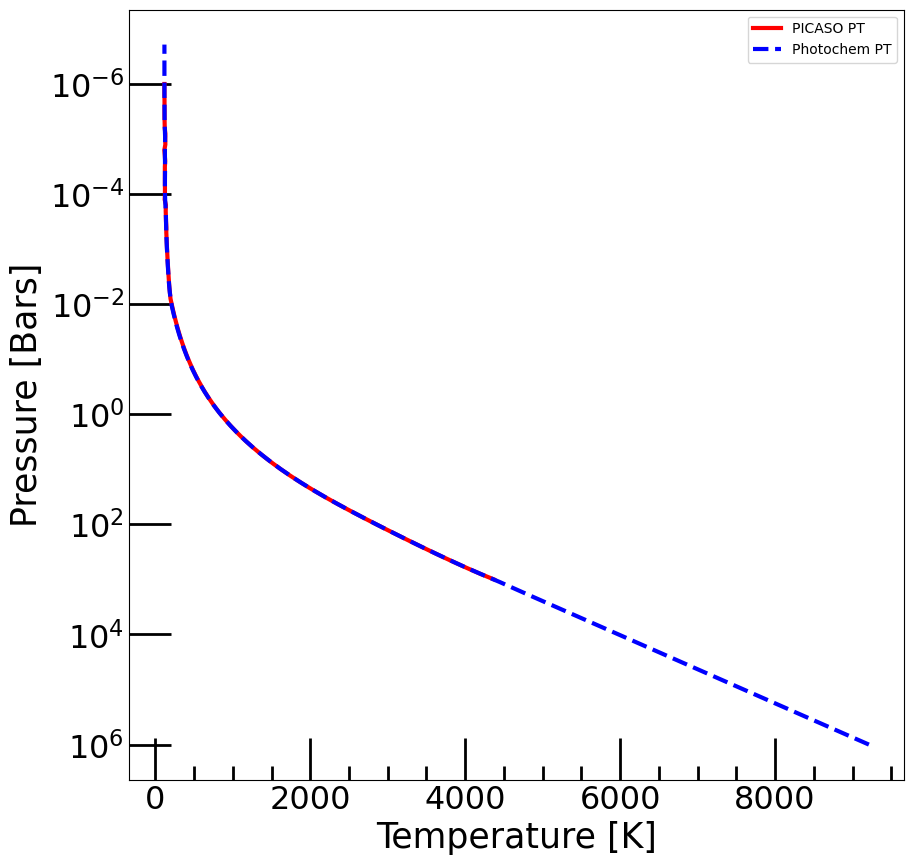

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.0e+00 3.5e+00 4.0e+02 1.0e+01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 5.0


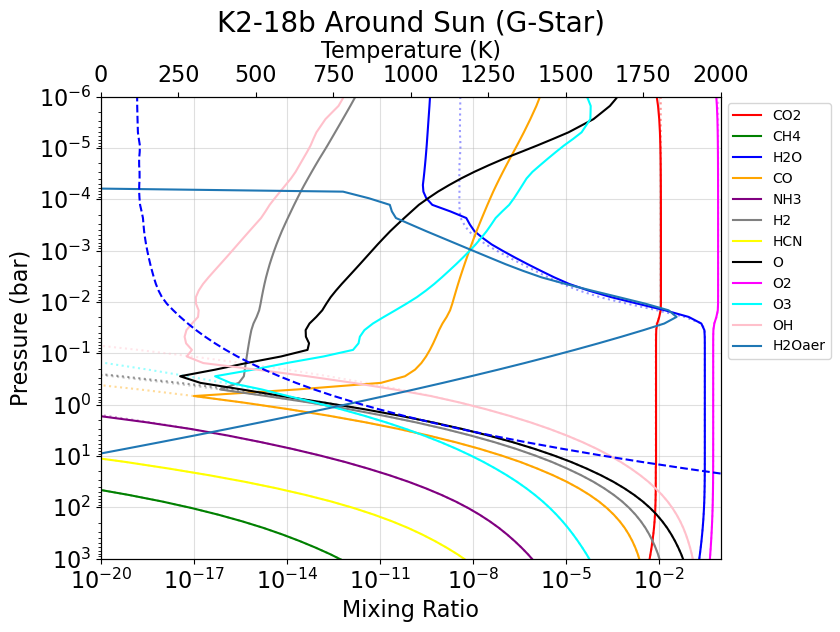

This is an example of inputs: [4.0e+00 3.5e+00 4.0e+02 1.0e+01 1.0e-02 9.0e+00]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.0e+00 3.5e+00 4.0e+02 1.0e+01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 9.0


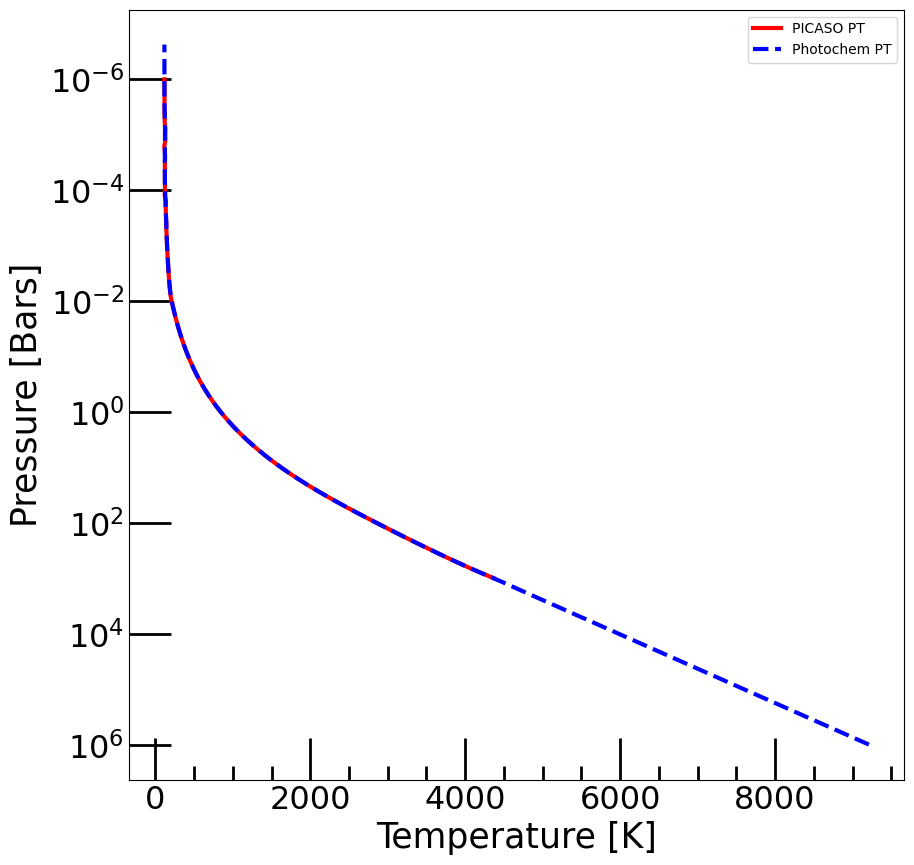

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [4.0e+00 3.5e+00 4.0e+02 1.0e+01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:10.0, ctoO: 0.01, log_Kzz: 9.0


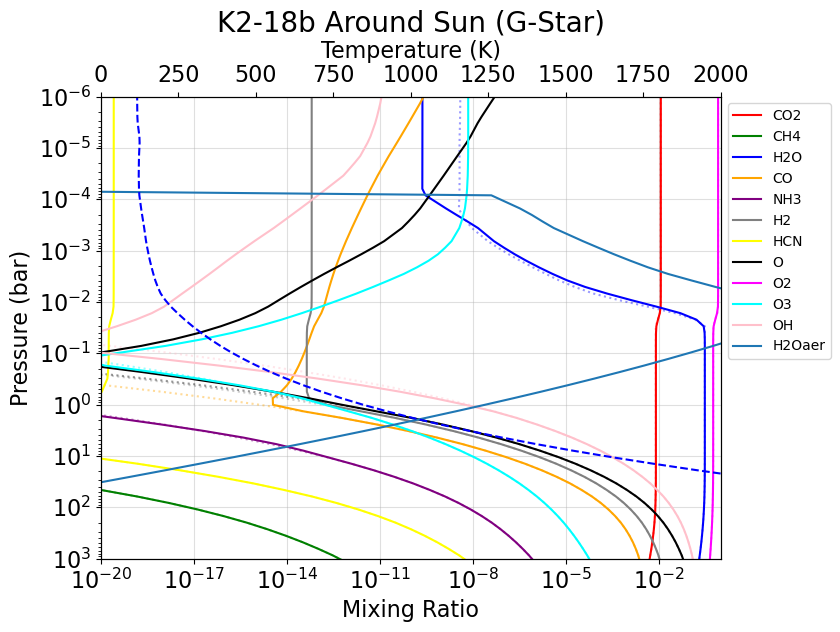

This is an example of inputs: [  4.    3.5 400.   10.    1.    5. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  4.    3.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 5.0


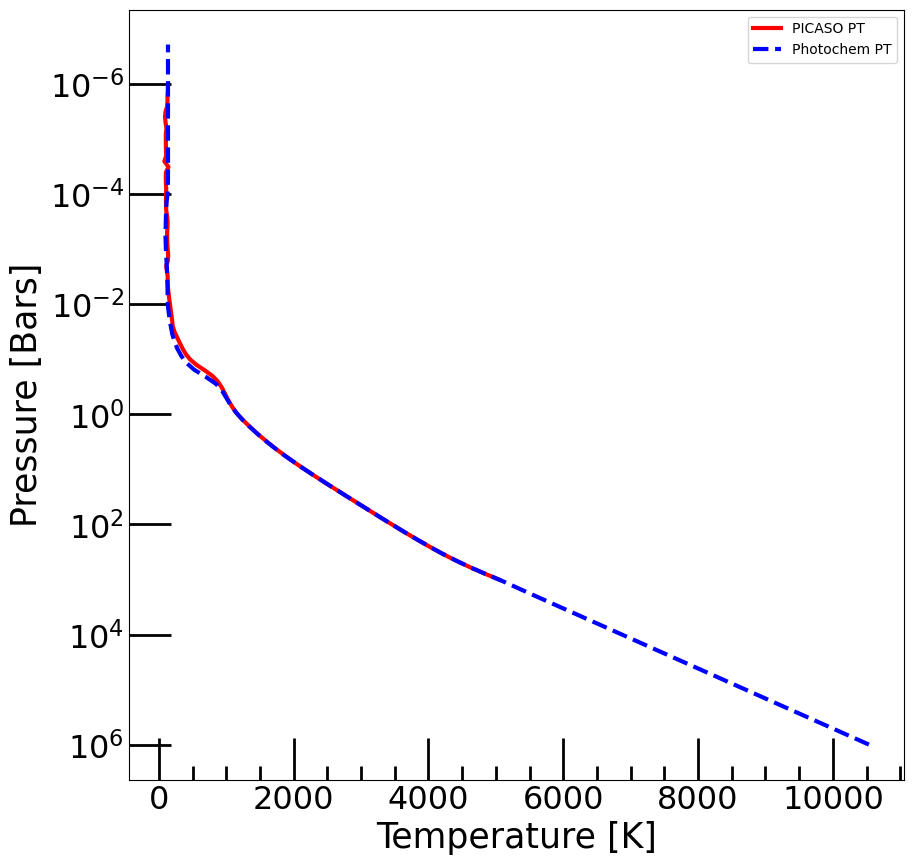

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  4.    3.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 5.0


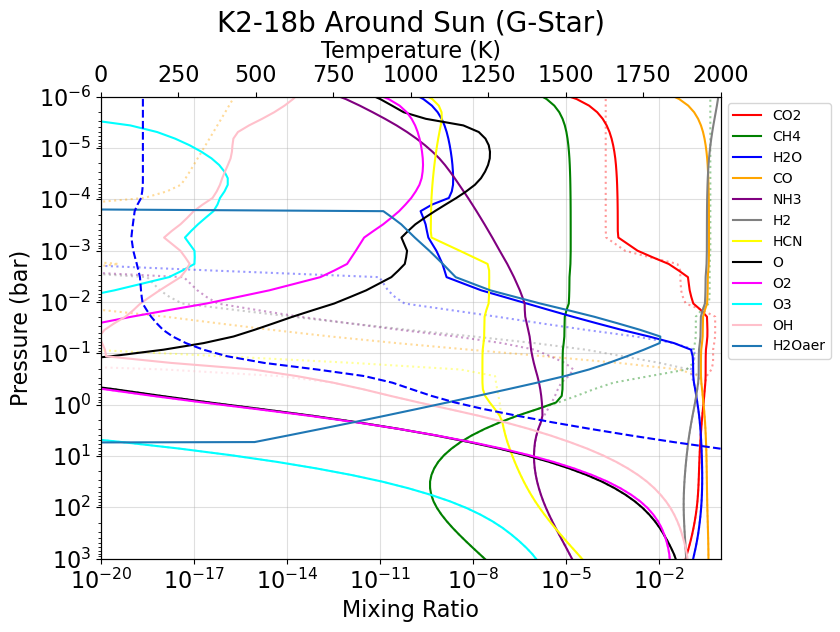

This is an example of inputs: [  4.    3.5 400.   10.    1.    9. ]
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  4.    3.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 9.0


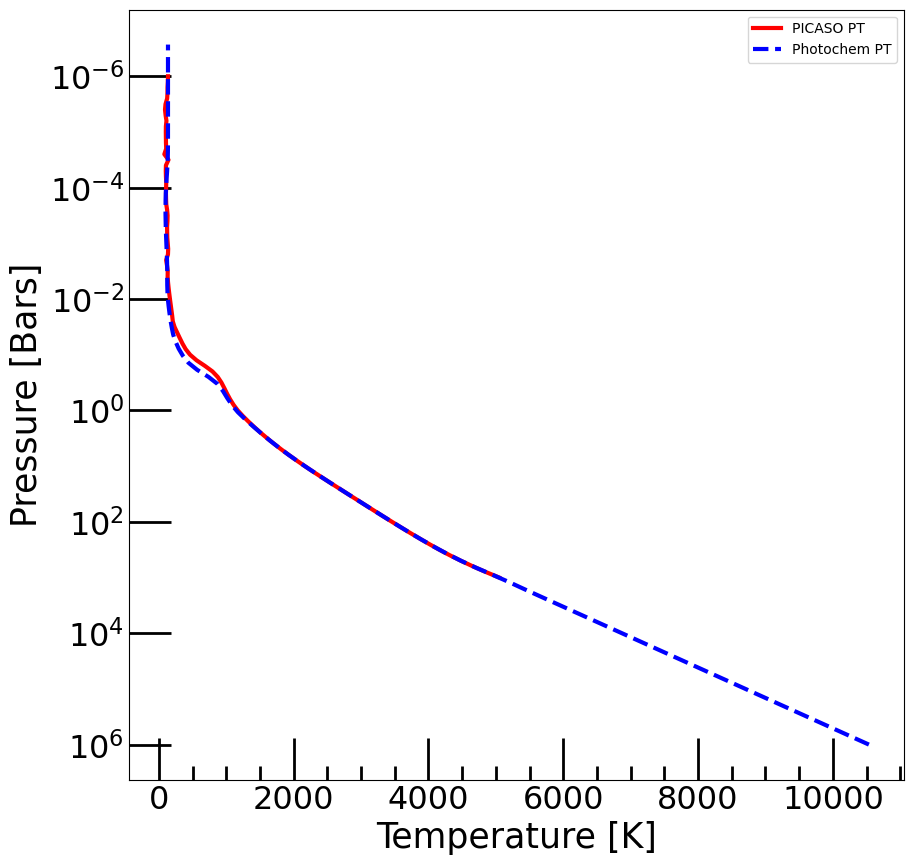

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [  4.    3.5 400.   10.    1. ]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:4.0, metal:3.5, tint:400.0, semi major:10.0, ctoO: 1.0, log_Kzz: 9.0


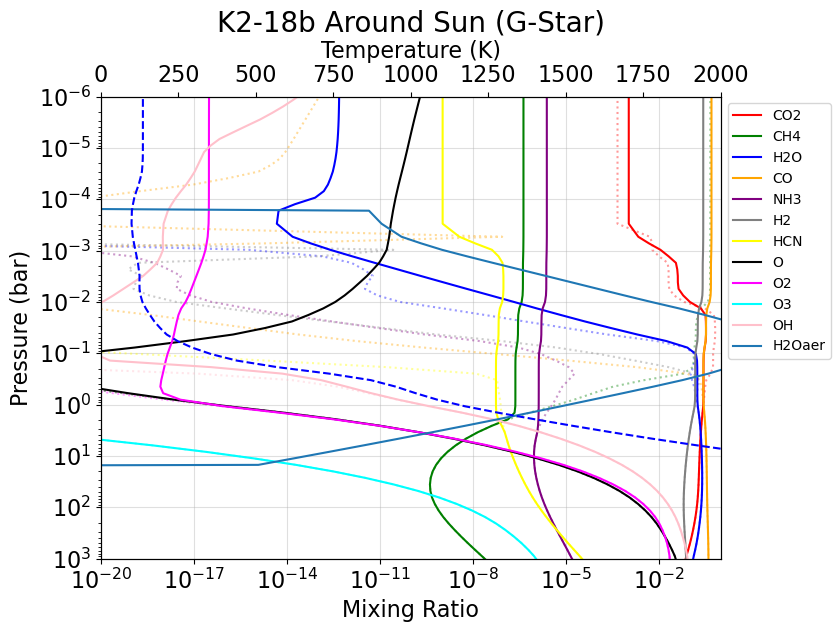

In [5]:
filename_photochem ='results/Photochem_1D_updatop_paramext_K218b.h5'
indices_dnf = []

with h5py.File(filename_photochem, 'r') as f:
    photochem_data = f
    #print(len(list(photochem_data['inputs'])))
    print(list(photochem_data['inputs']))
    completed_list = np.array(list(photochem_data['completed']))

    try:
        indicies_true = np.where(completed_list)[0]
    except:
        print(f"No results were True, no calculations were completed")

    # Find matching indices
    # Reshape arr2 for broadcasting
    # This ensures a comparison is made for each row in arr1 against all rows in arr2
    arr2 = np.array(list(photochem_data['inputs']))
    arr1 = np.array(combinations_list)

    # 1. Compare all rows of arr1 to all rows of arr2
    #    Result is a 3D boolean array where:
    #    - the first dimension matches arr1 rows
    #    - the second dimension matches arr2 rows
    #    - the third dimension matches columns
    #    Shape will be (arr1.shape[0], arr2.shape[0], arr1.shape[1]) -> (4, 2, 3)
    comparison = arr1[:, None, :] == arr2[None, :, :]
    
    # 2. Check if all elements in a row comparison are True
    #    Use np.all() along the last axis (axis=2)
    #    Result is a 2D boolean array (4, 2)
    rows_match = np.all(comparison, axis=2)
    
    # 3. Check if any row in arr2 matches the corresponding row in arr1
    #    Use np.any() along the second axis (axis=1)
    #    Result is a 1D boolean array (4,) indicating which rows in arr1 had a match in arr2
    any_match = np.any(rows_match, axis=1)
    
    # 4. Get the indices of the True values in the boolean mask
    #    Use np.where() to return the indices
    matching_indices = np.where(any_match)[0]
    non_matching_indices = np.where(~any_match)[0]

    # 5. Determine what input values were not calculated
    for index in non_matching_indices:
        indices_dnf.append(combinations_list[index])
    
    #print(f"Indices of matching rows in arr1: {matching_indices}")
    #print(f"Indices of non-matching rows in arr1: {non_matching_indices}")
    print(f"Inputs of failed photochem calcultions: {indices_dnf}")

    for index in indicies_true:
        inputs = photochem_data['inputs'][index]
        print(f"This is an example of inputs: {inputs}")
        GraphsKey.plot_PT(rad_plan=inputs[0], planet_metal=inputs[1], tint=inputs[2], semi_major=inputs[3], ctoO=inputs[4], kzz=inputs[5], calc_PT=True, calc_PhotCh=True)
        plot_PT_Photochem(rad_plan=inputs[0], planet_metal=inputs[1], tint=inputs[2], semi_major=inputs[3], ctoO=inputs[4], kzz=inputs[5], calc_PT=True, calc_PhotCh=True)
         

### Run Photochem for PT values that did not finish

In [6]:
print(indices_dnf)

[(1.6, 0.5, 20, 10.0, 0.01, 5), (1.6, 0.5, 20, 10.0, 0.01, 9), (1.6, 3.5, 20, 0.3, 0.01, 5), (1.6, 3.5, 20, 0.3, 0.01, 9), (1.6, 3.5, 20, 10.0, 0.01, 5), (1.6, 3.5, 20, 10.0, 0.01, 9), (1.6, 3.5, 20, 10.0, 1.0, 5), (1.6, 3.5, 20, 10.0, 1.0, 9), (4.0, 3.5, 20, 0.3, 0.01, 5), (4.0, 3.5, 20, 0.3, 0.01, 9), (4.0, 3.5, 20, 10.0, 0.01, 5), (4.0, 3.5, 20, 10.0, 0.01, 9), (4.0, 3.5, 20, 10.0, 1.0, 5), (4.0, 3.5, 20, 10.0, 1.0, 9)]


#### Calculating the Photochemistry of an Example that worked + its PT profile.

In [8]:
#planet radius:1.6, metal:0.5, tint:20.0, semi major:0.3, ctoO: 0.01, log_Kzz: 5.0; this should work

rad_plan = 1.6
log10_metal = 0.5
tint = 20
semi_major = 0.3
ctoO = 0.01
Kzz = 5.0
filename = "results/PICASO_climate_updatop_paramext_K218b.h5"

sol, soleq, pc, convergence_values, converged = photochem_grid.Photochem_Gas_Giant(rad_plan=rad_plan, log10_planet_metallicity=log10_metal, tint=tint, semi_major=semi_major, ctoO=ctoO, log_Kzz=Kzz, PT_filename=filename)

The stellar flux file already exists
This is the input list: [1.6e+00 5.0e-01 2.0e+01 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
nsteps = 100  longdy = 5.5e-01  max_dT = 7.4e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.2e-07
nsteps = 200  longdy = 5.9e+00  max_dT = 7.4e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.2e-07
nsteps = 300  longdy = 4.8e+01  max_dT = 7.4e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.2e-07
nsteps = 400  longdy = 8.6e+02  max_dT = 7.4e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.2e-07
nsteps = 500  longdy = 6.5e+03  max_dT = 7.4e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.3e-07
nsteps = 600  longdy = 1.9e+04  max_dT = 7.4e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.3e-07
nsteps = 700  longdy = 5.3e+03  max_dT = 7.4e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.3e-07
nsteps = 800  longdy = 2.8e+03  max_dT = 7.4e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.4e-07
nsteps = 900  longdy = 1.8e+03

Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 2.0e+01 3.0e-01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
This is for the input value of planet radius:1.6, metal:0.5, tint:20, semi major:0.3, ctoO: 0.01, log_Kzz: 5.0


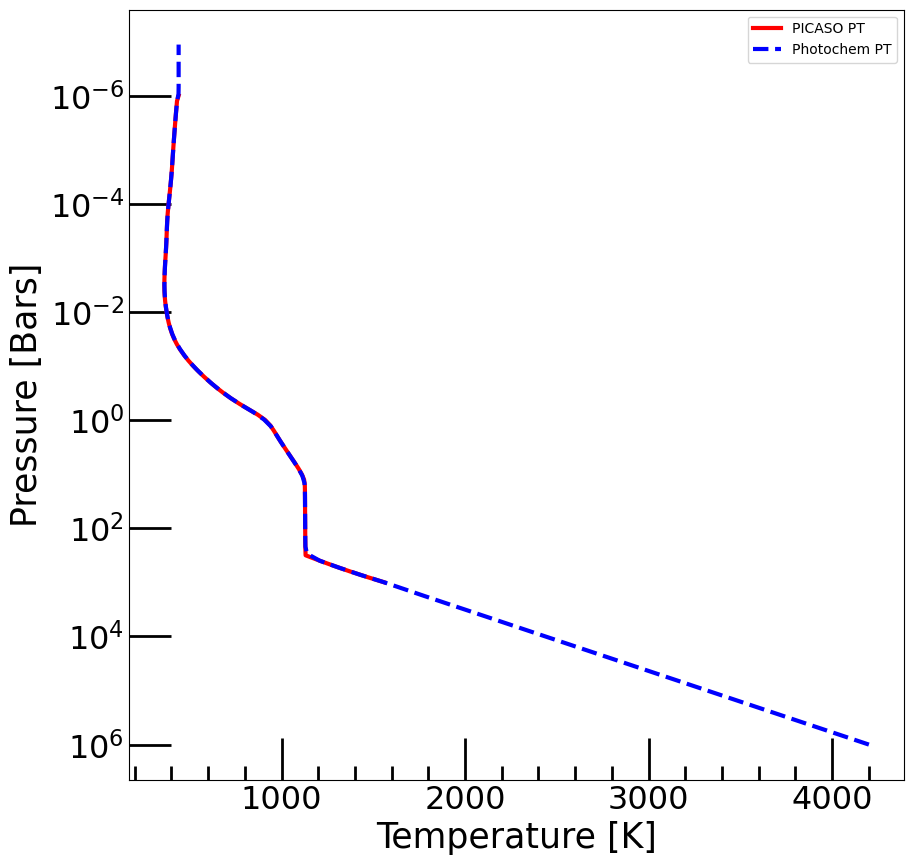

In [9]:
GraphsKey.plot_PT(rad_plan=1.6, planet_metal=0.5, tint=20, semi_major=0.3, ctoO=0.01, kzz=5.0, calc_PT=True, calc_PhotCh=True)

#### Determining what errors were thrown for the cases in Photochem that did not converge + Showing their associated PT PICASO profiles. 

For the input: radius of planet 1.6xEarth Radii, planet metallicity 0.5xSolar, internal temperature 20K, semi major axis 10.0AU, c/o ratio 0.01xSolar
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0
This is the input list: [1.6e+00 5.0e-01 2.0e+01 1.0e+01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
All inputs chosen were directly on the grid!
Make sure your inputs are within the following ranges, rad_plan: 1.6 - 4.0 xEarth Radii, planet metallicity: 0.5 - 3.5 xsolar, tint: 20 - 400 K, semi_major: 0.3 - 10.0 AU, ctoO: 0.01 - 1.0, kzz: 0.3 - 10.0 log10 of cm^2/s.
A match given rad plan, planet metallicity, tint, semi-major axis, and ctoO does not exist
Interpolating results...
This is the gridshape: (2, 2, 2, 2, 2, 2)


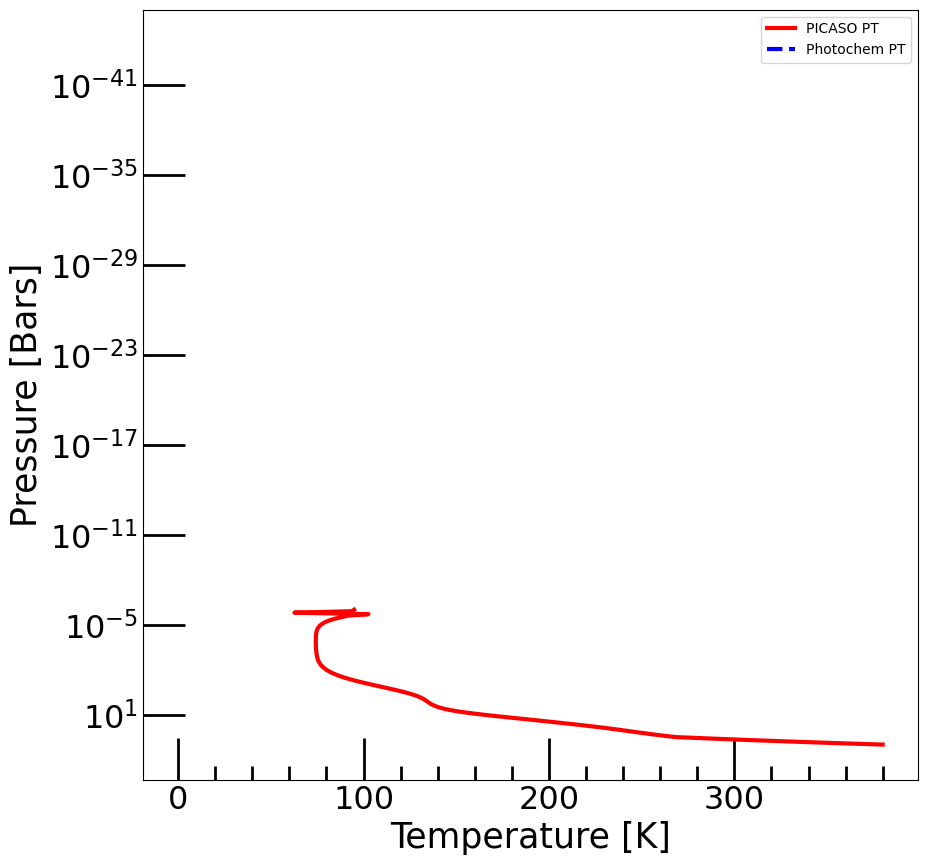

The stellar flux file already exists
This is the input list: [1.6e+00 5.0e-01 2.0e+01 1.0e+01 1.0e-02]
Was able to successfully find your input parameters in the PICASO TP profile grid!
nsteps = 100  longdy = 1.0e+00  max_dT = 4.2e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.7e-07
nsteps = 200  longdy = 9.4e-01  max_dT = 4.2e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.7e-07
nsteps = 300  longdy = 1.5e+00  max_dT = 5.0e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.7e-07
nsteps = 400  longdy = 1.7e+00  max_dT = 5.5e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.7e-07
nsteps = 500  longdy = 1.1e+01  max_dT = 5.8e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.7e-07
nsteps = 600  longdy = 7.0e+03  max_dT = 5.8e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.8e-07
nsteps = 700  longdy = 7.5e+03  max_dT = 5.8e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.8e-07
nsteps = 800  longdy = 7.5e+03  max_dT = 5.8e+00  max_dlog10edd = 0.0e+00  TOA_pressure = 1.8e-07
nsteps = 900  longdy = 7.5e+03

In [ ]:
filename = "results/PICASO_climate_updatop_paramext_K218b.h5"

for index in indices_dnf:
    print(f"For the input: radius of planet {index[0]}xEarth Radii, planet metallicity {index[1]}xSolar, internal temperature {index[2]}K, semi major axis {index[3]}AU, c/o ratio {index[4]}xSolar")

    # Plots the PT profile associated with input that raised the error
    GraphsKey.plot_PT(rad_plan=index[0], planet_metal=index[1], tint=index[2], semi_major=index[3], ctoO=index[4], kzz=index[5], calc_PT=True, calc_PhotCh=True)

    # Prints the exception raised when photochem didn't work.
    try:
        sol, soleq, pc, convergence_values, converged = photochem_grid.Photochem_Gas_Giant(rad_plan=index[0], log10_planet_metallicity=index[1], tint=index[2], semi_major=index[3], ctoO=index[4], log_Kzz=index[5], PT_filename=filename)

    except Exception as e:
        print(f"The exception that occured when trying to run Photochem for {index} was {e}")
    

#### Printing out the exact errors shown (one that was an Assertion Error, and the rest were BOA)

In [ ]:
# This ran into an issue

rad_plan = 1.6
log10_metal = '0.5'
tint = 20
semi_major = 10
ctoO = 0.01
Kzz = 5
filename = "results/PICASO_climate_updatop_paramext_K218b.h5"

sol, soleq, pc, convergence_values, converged = photochem_grid.Photochem_Gas_Giant(rad_plan=rad_plan, log10_planet_metallicity=log10_metal, tint=tint, semi_major=semi_major, ctoO=ctoO, log_Kzz=Kzz, PT_filename=filename)

In [ ]:
# This ran into the BOA issue

rad_plan = 4.0
log10_metal = '3.5'
tint = 20
semi_major = 10
ctoO = 1.0
Kzz = 5
filename = "results/PICASO_climate_updatop_paramext_K218b.h5"

sol, soleq, pc, convergence_values, converged = photochem_grid.Photochem_Gas_Giant(rad_plan=rad_plan, log10_planet_metallicity=log10_metal, tint=tint, semi_major=semi_major, ctoO=ctoO, log_Kzz=Kzz, PT_filename=filename)

In [ ]:
GraphsKey.plot_PT(rad_plan=4, planet_metal=3.5, tint=20, semi_major=10, ctoO=1, kzz=5, calc_PT=True, calc_PhotCh=True)

In [ ]:
GraphsKey.plot_PT(rad_plan=1.6, planet_metal=0.5, tint=20, semi_major=10, ctoO=0.01, kzz=5, calc_PT=True, calc_PhotCh=True)